# Topic : Enhancing Credit Risk Prediction: Techniques to Improve Model Accuracy and Reliability

### Context & Objective:

The dataset being used here has 7 years' historical loan data taken from [LendingClub](https://www.kaggle.com/datasets/devanshi23/loan-data-2007-2014/). By looking at the loan status, we can check if the loan was sanctioned to the customers or not. If the loan status is "charged off" or "default" or the issuance of loan got delayed by 31-120 days, it is a bad loan. We will analyze the characteristics of the customers whose loans belong to **"bad loan"** category and will build a **Probability of Default (PD) Model**, so that is can be used in future to predict the customer will default or not.

We have used some useful concepts:
- Weight of Evidence (WoE),
- Information Value (IV)

In [ ]:
# import libraries
## Setting up

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(context='notebook')
sns.set_style("whitegrid", {'axes.grid' : False})
plt.tight_layout()

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline
#pd.set_option('display.float', '{:.2f}'.format)
pd.set_option('display.max_columns', 1000)
pd.set_option('display.max_rows', 1000)

<Figure size 640x480 with 0 Axes>

In [ ]:
from pathlib import Path

file_path = Path("/content/loan_data_2007_2014.csv")
data = pd.read_csv(file_path, index_col=0)

In [ ]:
data.shape

(466285, 74)

In [ ]:
data.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
0,1077501,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0.0,Jan-85,1.0,NaN,NaN,3.0,0.0,13648,83.7,9.0,f,0.0,0.0,5861.071414,5831.78,5000.00,861.07,0.00,0.00,0.00,Jan-15,171.62,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0.0,Apr-99,5.0,NaN,NaN,3.0,0.0,1687,9.4,4.0,f,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,NaN,small_business,real estate business,606xx,IL,8.72,0.0,Nov-01,2.0,NaN,NaN,2.0,0.0,2956,98.5,10.0,f,0.0,0.0,3003.653644,3003.65,2400.00,603.65,0.00,0.00,0.00,Jun-14,649.91,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0.0,Feb-96,1.0,35.0,NaN,10.0,0.0,5598,21.0,37.0,f,0.0,0.0,12226.302210,12226.30,10000.00,2209.33,16.97,0.00,0.00,Jan-15,357.48,NaN,Jan-15,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69,67.79,B,B5,University Medical Group,1 year,RENT,80000.0,Source Verified,Dec-11,Current,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/21/11 > I plan on combi...,other,Personal,972xx,OR,17.94,0.0,Jan-96,0.0,38.0,NaN,15.0,0.0,27783,53.9,38.0,f,766.9,766.9,3242.170000,3242.17,2233.10,1009.07,0.00,0.00,0.00,Jan-16,67.79,Feb-16,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# 1. Data Description & Business Interpretation of the Features

In [ ]:
# check number of columns and data types of features
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 466285 entries, 0 to 466284
Data columns (total 74 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   id                           466285 non-null  int64  
 1   member_id                    466285 non-null  int64  
 2   loan_amnt                    466285 non-null  int64  
 3   funded_amnt                  466285 non-null  int64  
 4   funded_amnt_inv              466285 non-null  float64
 5   term                         466285 non-null  object 
 6   int_rate                     466285 non-null  float64
 7   installment                  466285 non-null  float64
 8   grade                        466285 non-null  object 
 9   sub_grade                    466285 non-null  object 
 10  emp_title                    438697 non-null  object 
 11  emp_length                   445277 non-null  object 
 12  home_ownership               466285 non-null  object 
 13  annu

In [ ]:
data.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose',
       'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'mths_since_last_delinq',
       'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'initial_list_status', 'out_prncp',
       'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp',
       'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'next_pymnt_d', 'last_credit_pull_d', 'collections_12_mths_ex_med',
       'mths_since_last_major_derog', 'policy_code', 'application_type',
       'annual_inc_joint', 'dti_joint', 'verification_status_joint',
    

## 📄 Dataset Overview: Lending Club Loan Data (2007–2014)
The Lending Club dataset contains detailed information on loans issued through the Lending Club platform between 2007 and 2014. Each row represents a loan, and each column provides details about the borrower, loan terms, performance, and various credit attributes. Below is a detailed explanation of each column based on Lending Club's official data dictionary and financial lending principles.

## <span style="color: #2563eb; font-weight: bold;">🔍 Borrower Identification</span>

- **`id`**: Unique numerical identifier assigned to each loan in the dataset; serves as the primary key.  
- **`member_id`**: Unique numerical identifier for each borrower in the Lending Club system; a borrower may have multiple loans over time.  
- **`url`**: The specific web address for this loan listing on the Lending Club marketplace; allows investors to view the loan details.  
- **`desc`**: A detailed text description of the loan purpose written by the borrower; often provides context beyond the categorical "purpose" field.  
- **`title`**: A brief title for the loan created by the borrower; summarizes the loan purpose in a few words.  

---

## <span style="color: #2563eb; font-weight: bold;">💰 Loan Amount Information</span>  
- **`loan_amnt`**: The exact dollar amount requested by the borrower. This is the initial amount applied for.  
- **`funded_amnt`**: The total dollar amount ultimately committed to the loan, which may differ from the requested amount if Lending Club adjusted the approved amount.  
- **`funded_amnt_inv`**: The total dollar amount committed by investors to this loan. In most cases, this equals the funded_amnt, but can differ if Lending Club itself funded a portion.  

---

## <span style="color: #2563eb; font-weight: bold;">📜 Loan Terms & Interest</span>  
- **`term`**: The duration period for loan repayment, typically expressed as either "36 months" or "60 months". This defines how long the borrower has to repay the loan in full.  
- **`int_rate`**: The annual interest rate charged on the loan, expressed as a percentage (e.g., 10.50%). Higher risk borrowers receive higher interest rates.  
- **`installment`**: The monthly payment amount in dollars that the borrower is obligated to pay, including principal and interest.  
- **`grade`**: Lending Club's proprietary risk assessment grade ranging from A (lowest risk) to G (highest risk). This represents the overall credit quality.  
- **`sub_grade`**: A finer breakdown of the grade, ranging from A1 (best) to G5 (highest risk). This provides more granular risk assessment within each letter grade.  
- **`pymnt_plan`**: Indicates whether the borrower is on a special payment plan, typically "Y" (yes) or "N" (no). Payment plans are often arrangements for struggling borrowers.  
- **`issue_d`**: The month and year when the loan was officially funded and issued to the borrower (e.g., "Jan-2018").  
- **`purpose`**: A standardized category selected by the borrower that indicates the intended use of loan funds (e.g., "debt_consolidation", "home_improvement", "small_business").  
- **`initial_list_status`**: Indicates how the loan was initially listed on the platform - "W" for whole loans (available for entire purchase by a single investor) or "F" for fractional loans (available for partial funding by multiple investors).  
- **`application_type`**: Specifies whether the application was submitted as an "Individual" application.  

---

## <span style="color: #2563eb; font-weight: bold;">👤 Borrower Information</span>  
- **`emp_title`**: The job title provided by the borrower during the loan application process. This is self-reported and not verified.  
- **`emp_length`**: The length of time (in years) that the borrower has been employed with their current employer, categorized as "< 1 year", "1 year", "2 years", up to "10+ years".  
- **`home_ownership`**: The reported housing situation of the borrower, typically "RENT", "OWN", "MORTGAGE", "OTHER", or "NONE". This indicates housing stability.  
- **`annual_inc`**: The self-reported annual income of the borrower in dollars. For individual applications, this is the borrower's personal income.  
- **`verification_status`**: Indicates the extent to which Lending Club verified the borrower's income: "Verified" (documents checked), "Source Verified" (third-party verification), or "Not Verified".  
- **`zip_code`**: The first three digits of the borrower's ZIP code. Full ZIP codes are masked for privacy reasons.  
- **`addr_state`**: The two-letter abbreviation of the borrower's state of residence (e.g., "CA" for California).  
- **`annual_inc_joint`**: For joint applications only, this represents the combined annual income of both co-borrowers in dollars.  
- **`verification_status_joint`**: For joint applications, indicates how the combined income was verified, using the same categories as verification_status.  

---

## <span style="color: #2563eb; font-weight: bold;">💳 Credit Information</span>  
- **`dti`**: Debt-to-Income ratio, calculated as the borrower's total monthly debt payments divided by their monthly income, expressed as a percentage. Higher values indicate higher financial burden.  
- **`delinq_2yrs`**: The number of times the borrower has been 30+ days past due on a payment in the last 2 years. Indicates payment reliability.  
- **`earliest_cr_line`**: The date when the borrower's first credit line was opened. Indicates the length of credit history.  
- **`inq_last_6mths`**: The number of hard credit inquiries recorded on the borrower's credit report in the last 6 months. Multiple inquiries often suggest the borrower is seeking additional credit.  
- **`mths_since_last_delinq`**: The number of months since the borrower's last delinquency. Null values indicate no delinquencies in credit history.  
- **`mths_since_last_record`**: The number of months since the last public record (e.g., bankruptcy, tax lien) was filed. Null values indicate no public records.  
- **`open_acc`**: The total number of open credit accounts in the borrower's name (credit cards, auto loans, mortgages, etc.).  
- **`pub_rec`**: The number of derogatory public records on the borrower's credit report, including bankruptcies, tax liens, and judgments.  
- **`revol_bal`**: The total outstanding balance on all revolving credit accounts (primarily credit cards), expressed in dollars.  
- **`revol_util`**: The revolving line utilization rate, calculated as the total credit currently used divided by the total available revolving credit, expressed as a percentage. Higher percentages indicate higher credit usage.  
- **`total_acc`**: The total number of credit accounts (both open and closed) in the borrower's credit history.  
- **`dti_joint`**: For joint applications, the combined Debt-to-Income ratio of both co-borrowers, calculated like the individual DTI.  
- **`acc_now_delinq`**: The number of accounts on which the borrower is currently delinquent (late on payments).  
- **`tot_coll_amt`**: The total amount in dollars that the borrower has previously had in collections. Collections occur when debts are severely delinquent.  
- **`tot_cur_bal`**: The total current balance in dollars of all the borrower's active accounts (both installment and revolving).  
- **`open_acc_6m`**: The number of new credit accounts opened in the last 6 months.  
- **`open_il_6m`**: The number of new installment accounts (loans with fixed payments, like auto loans) opened in the last 6 months.  
- **`open_il_12m`**: The number of installment accounts opened in the last 12 months.  
- **`open_il_24m`**: The number of installment accounts opened in the last 24 months.  
- **`mths_since_rcnt_il`**: The number of months since the most recent installment account was opened.  
- **`total_bal_il`**: The total current balance in dollars across all installment accounts.  
- **`il_util`**: The installment account utilization ratio, calculated as total current installment balance divided by the original loan amounts, expressed as a percentage.  
- **`open_rv_12m`**: The number of revolving credit accounts (primarily credit cards) opened in the last 12 months.  
- **`open_rv_24m`**: The number of revolving credit accounts opened in the last 24 months.  
- **`max_bal_bc`**: The maximum balance in dollars carried on all revolving accounts (primarily credit cards) in the past 12 months.  
- **`all_util`**: The percentage utilization of all available credit (both revolving and installment), calculated as total balances divided by total credit limits.  
- **`total_rev_hi_lim`**: The total revolving high credit limit, representing the maximum amount available across all revolving accounts, in dollars.  
- **`inq_fi`**: The number of financial-specific credit inquiries in the past 12 months. These are inquiries related to financial products like loans.  
- **`total_cu_tl`**: The number of credit union trades (accounts) in the borrower's credit history. Credit unions often have different lending practices than banks.  
- **`inq_last_12m`**: The number of hard credit inquiries recorded in the past 12 months.  
- **`collections_12_mths_ex_med`**: The number of collections in the past 12 months, excluding medical collections. Medical collections are treated differently in credit scoring.  
- **`mths_since_last_major_derog`**: The number of months since the most recent 90-day or worse rating on any account. Indicates serious payment problems.  
- **`policy_code`**: A standardized code representing the publicly available policy that applied to this loan. Almost always "1" in this dataset, representing standard policies.  

---

## <span style="color: #2563eb; font-weight: bold;">📊 Loan Status & Repayment</span>  
- **`loan_status`**: The current status of the loan, such as "Fully Paid", "Current" (on-time), "Late (31-120 days)", "Default", or "Charged Off" (deemed uncollectible). This is often the target variable for credit risk models.  
- **`out_prncp`**: The outstanding principal balance in dollars that remains unpaid. Decreases with each payment.  
- **`out_prncp_inv`**: The outstanding principal balance in dollars from the investor's perspective. May differ slightly from out_prncp due to fees.  
- **`total_pymnt`**: The total amount in dollars that has been paid by the borrower to date, including principal, interest, late fees, and recoveries.  
- **`total_pymnt_inv`**: The total amount in dollars received by investors to date, which may differ from total_pymnt due to service fees.  
- **`total_rec_prncp`**: The total principal amount in dollars received to date. This shows how much of the original loan has been repaid.  
- **`total_rec_int`**: The total interest amount in dollars received to date. This represents the profit for investors.  
- **`total_rec_late_fee`**: The total late fee amounts in dollars received to date, charged when payments are late.  
- **`recoveries`**: The post-charge-off gross recovery amount in dollars. After a loan is charged off as uncollectible, this represents any money later recovered.  
- **`collection_recovery_fee`**: The fee in dollars that the collection agency takes from recoveries. Reduces the net recovery for investors.  
- **`last_pymnt_d`**: The date when the last payment was received from the borrower.  
- **`last_pymnt_amnt`**: The dollar amount of the last payment received.  
- **`next_pymnt_d`**: The date when the next scheduled payment is due from the borrower.  
- **`last_credit_pull_d`**: The most recent date when Lending Club pulled the borrower's credit report. Regular pulls help monitor credit changes.  

## Assigning the Target Column to Identify Bad Loans

In [ ]:
data['loan_status'].value_counts()

,count
loan_status,
Current,224226
Fully Paid,184739
Charged Off,42475
Late (31-120 days),6900
In Grace Period,3146
Does not meet the credit policy. Status:Fully Paid,1988
Late (16-30 days),1218
Default,832
Does not meet the credit policy. Status:Charged Off,761


When a person applies for a loan, there are two types of decisions that could be taken by the company:

1. Loan accepted: If the company approves the loan, there are 3 possible scenarios described below:

    a. Fully paid: Applicant has fully paid the loan (the principal and the interest rate)

    b. Current: Applicant is in the process of paying the instalments, i.e. the tenure of the loan is not yet completed. These candidates are not labelled as 'defaulted'.

    c. Charged-off: Applicant has not paid the instalments in due time for a long period of time, i.e. he/she has defaulted on the loan


2. Loan rejected: The company had rejected the loan (because the candidate does not meet their requirements etc.). Since the loan was rejected, there is no transactional history of those applicants with the company and so this data is not available with the company (and thus in this dataset)

Good (0):
* Fully Paid: Loan fully repaid.
* Current: Loan active and payments up to date.
* In Grace Period: Minor delay (1-15 days), often still recoverable.
* Late (16-30 days): Moderately overdue, often a warning sign. (but can handle)
* Does not meet the credit policy. Status:Fully Paid: Paid despite policy issues (historical artifact).  

Bad (1):
* Charged Off: Loan written off as a loss (defaulted).
* Default: Explicitly defaulted.
* Late (31-120 days): Significantly overdue, high risk of default.
* Does not meet the credit policy. Status:Charged Off: Defaulted despite policy issues.  

Rationale  
- Good: Current and Fully Paid are clear successes. In Grace Period is typically minor and often resolves, especially in Lending Club data. The "Does not meet..." fully paid category is rare but indicates repayment.  
- Bad: Charged Off and Default are definitive failures. Late statuses (31-120 days) signal distress, often leading to default, and are commonly treated as "bad" in credit scoring.

In [ ]:
# Define good and bad categories
good_status = ['Fully Paid', 'Current', 'In Grace Period', 'Late (16-30 days)',
               'Does not meet the credit policy. Status:Fully Paid']
bad_status = ['Charged Off', 'Default', 'Late (31-120 days)',
             'Does not meet the credit policy. Status:Charged Off']

# Create target column: 0 = good, 1 = bad
data['loan_target'] = data['loan_status'].apply(lambda x: 0 if x in good_status else 1 if x in bad_status else None)
data.drop(columns=['loan_status'], inplace=True)

In [ ]:
print("Shape with target:", data.shape)
print("Target distribution:", data['loan_target'].value_counts(normalize=True))

Shape with target: (466285, 74)
Target distribution: loan_target
0    0.890693
1    0.109307
Name: proportion, dtype: float64


In [ ]:
X = data.drop('loan_target', axis=1)
y = data['loan_target']
print("X shape:", X.shape)
print("y shape:", y.shape)

X shape: (466285, 73)
y shape: (466285,)


## Data Cleaning

In [ ]:
# 1. Identify columns with more than 70% missing values
missing_values = data.isnull().mean()
cols_over_70_missing = missing_values[missing_values > 0.7].index
print(cols_over_70_missing)

# 2. Drop those columns from the dataset
data.drop(columns=cols_over_70_missing, inplace=True)

# 3. Remove duplicate columns
# Transpose -> drop duplicate rows (which are original columns) -> transpose back
#data.T.drop_duplicates().T

# 4. Remove duplicate rows from the dataset
data.drop_duplicates(inplace=True)

# 5. Drop columns where all values are NaN
data.dropna(how='all', axis=1, inplace=True)
print(data.shape)

Index(['desc', 'mths_since_last_record', 'mths_since_last_major_derog',
       'annual_inc_joint', 'dti_joint', 'verification_status_joint',
       'open_acc_6m', 'open_il_6m', 'open_il_12m', 'open_il_24m',
       'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m',
       'open_rv_24m', 'max_bal_bc', 'all_util', 'inq_fi', 'total_cu_tl',
       'inq_last_12m'],
      dtype='object')
(466285, 54)


In [ ]:
data.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,pymnt_plan,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,tot_coll_amt,tot_cur_bal,total_rev_hi_lim,loan_target
0,1077501,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,n,https://www.lendingclub.com/browse/loanDetail....,credit_card,Computer,860xx,AZ,27.65,0.0,Jan-85,1.0,NaN,3.0,0.0,13648,83.7,9.0,f,0.0,0.0,5861.071414,5831.78,5000.00,861.07,0.00,0.00,0.00,Jan-15,171.62,NaN,Jan-16,0.0,1,INDIVIDUAL,0.0,NaN,NaN,NaN,0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,n,https://www.lendingclub.com/browse/loanDetail....,car,bike,309xx,GA,1.00,0.0,Apr-99,5.0,NaN,3.0,0.0,1687,9.4,4.0,f,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,1,INDIVIDUAL,0.0,NaN,NaN,NaN,1
2,1077175,1313524,2400,2400,2400.0,36 months,15.96,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,n,https://www.lendingclub.com/browse/loanDetail....,small_business,real estate business,606xx,IL,8.72,0.0,Nov-01,2.0,NaN,2.0,0.0,2956,98.5,10.0,f,0.0,0.0,3003.653644,3003.65,2400.00,603.65,0.00,0.00,0.00,Jun-14,649.91,NaN,Jan-16,0.0,1,INDIVIDUAL,0.0,NaN,NaN,NaN,0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,n,https://www.lendingclub.com/browse/loanDetail....,other,personel,917xx,CA,20.00,0.0,Feb-96,1.0,35.0,10.0,0.0,5598,21.0,37.0,f,0.0,0.0,12226.302210,12226.30,10000.00,2209.33,16.97,0.00,0.00,Jan-15,357.48,NaN,Jan-15,0.0,1,INDIVIDUAL,0.0,NaN,NaN,NaN,0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69,67.79,B,B5,University Medical Group,1 year,RENT,80000.0,Source Verified,Dec-11,n,https://www.lendingclub.com/browse/loanDetail....,other,Personal,972xx,OR,17.94,0.0,Jan-96,0.0,38.0,15.0,0.0,27783,53.9,38.0,f,766.9,766.9,3242.170000,3242.17,2233.10,1009.07,0.00,0.00,0.00,Jan-16,67.79,Feb-16,Jan-16,0.0,1,INDIVIDUAL,0.0,NaN,NaN,NaN,0


# 2. Explolatory Data Analysis

In [ ]:
!pip install hvplot holoviews bokeh matplotlib pandas colorcet

In [ ]:
import hvplot.pandas

## ✔️ `loan_target`

> Current status of the loan

In [ ]:
data['loan_target'].value_counts().hvplot.bar(
    title="Loan Status Counts", xlabel='Loan Status', ylabel='Count',
    width=500, height=350
)

:Bars   [loan_target]   (count)

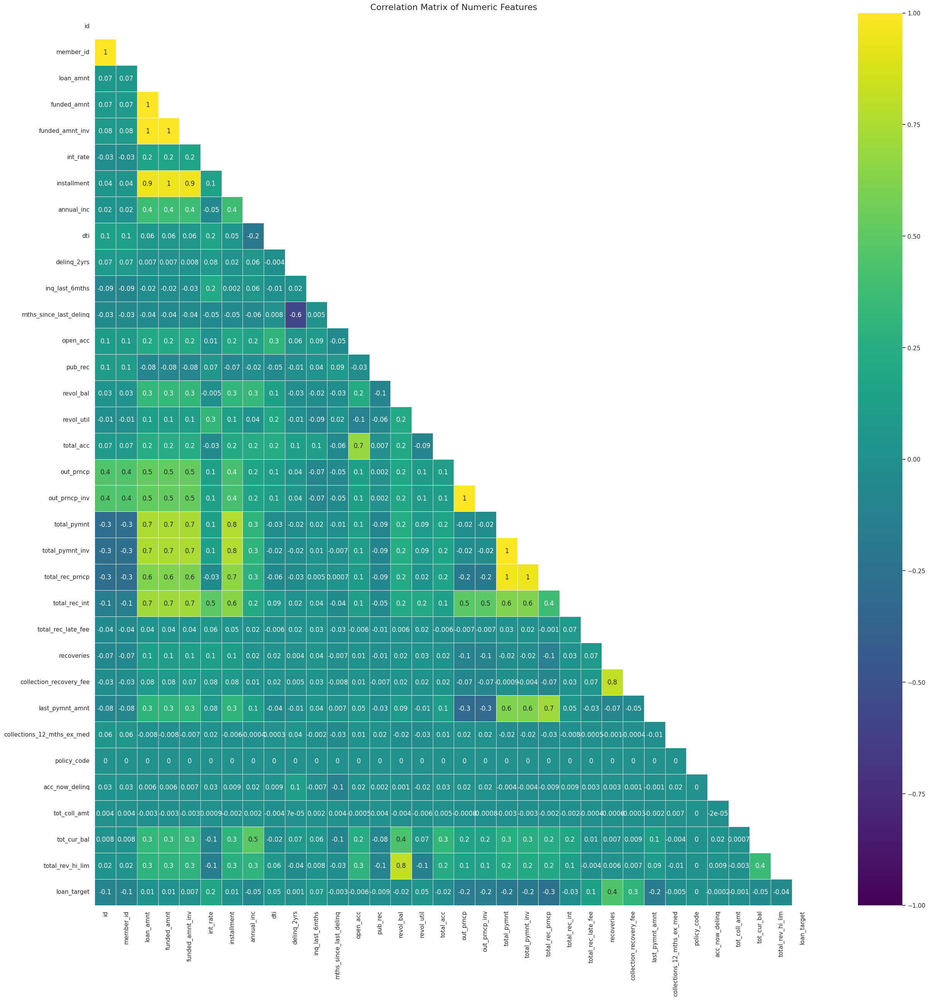

In [ ]:
numeric_data = data.select_dtypes(include=[np.number])
corr_matrix = numeric_data.corr().fillna(0)
mask = np.zeros_like(corr_matrix, dtype=bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(30,30))
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap="viridis", vmin=-1, vmax=1,
            fmt='.1g', edgecolor='w', linewidth=0.6)
plt.title("Correlation Matrix of Numeric Features", fontsize=16)
plt.show()

### 🔗 Các Cặp Biến Có Hệ Số Tương Quan Cao (> 0.85)

Dưới đây là bảng liệt kê các cặp biến số trong tập dữ liệu Lending Club có mối tương quan cao (hệ số tương quan Pearson tuyệt đối > 0.85). Điều này cho thấy rằng những biến này có thể mang thông tin trùng lặp, cần xem xét loại bỏ hoặc sử dụng kỹ thuật giảm chiều:

| Feature 1             | Feature 2               | Correlation | Giải thích                                                                 |
|-----------------------|-------------------------|-------------|----------------------------------------------------------------------------|
| loan_amnt             | funded_amnt             | ≈ 1.00      | Khoản vay được yêu cầu và khoản được tài trợ gần như bằng nhau            |
| loan_amnt             | installment             | ≈ 0.97      | Số tiền vay càng lớn, khoản trả hàng tháng càng cao                       |
| total_pymnt           | total_rec_prncp         | ≈ 0.97      | Tổng thanh toán tăng cùng với số gốc đã được thu                          |
| total_pymnt           | total_rec_int           | ≈ 0.92      | Tổng thanh toán càng nhiều thì tiền lãi đã thu càng cao                   |
| out_prncp             | out_prncp_inv           | ≈ 1.00      | Số dư gốc còn lại của khoản vay và phần nhà đầu tư                         |
| total_pymnt           | last_pymnt_amnt         | ≈ 0.71-0.85 | Khoản thanh toán cuối có ảnh hưởng đến tổng tiền đã trả                  |

> ⚠️ **Lưu ý**: Cần kiểm tra đa cộng tuyến khi xây dựng mô hình Machine Learning. Nếu các biến quá giống nhau về thông tin, nên loại bỏ bớt hoặc áp dụng các phương pháp như PCA để giảm chiều dữ liệu.



## ✔️ `loan_amnt` & `installment`

> - `installment`: The monthly payment owed by the borrower if the loan originates.
> - `loan_amnt`: The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.

In [ ]:
installment = data.hvplot.hist(
    y='installment', by='loan_target', subplots=False,
    width=350, height=400, bins=50, alpha=0.4,
    title="Installment by Loan Status",
    xlabel='Installment', ylabel='Counts', legend='top'
)

loan_amnt = data.hvplot.hist(
    y='loan_amnt', by='loan_target', subplots=False,
    width=350, height=400, bins=30, alpha=0.4,
    title="Loan Amount by Loan Status",
    xlabel='Loan Amount', ylabel='Counts', legend='top'
)

installment + loan_amnt

:Layout
   .NdOverlay.I  :NdOverlay   [loan_target]
      :Histogram   [installment]   (Count)
   .NdOverlay.II :NdOverlay   [loan_target]
      :Histogram   [loan_amnt]   (Count)

In [ ]:
loan_amnt_box = data.hvplot.box(
    y='loan_amnt', subplots=True, by='loan_target', width=300, height=350,
    title="Loan Status by Loan Amount ", xlabel='Loan Status', ylabel='Loan Amount'
)

installment_box = data.hvplot.box(
    y='installment', subplots=True, by='loan_target', width=300, height=350,
    title="Loan Status by Installment", xlabel='Loan Status', ylabel='Installment'
)

loan_amnt_box + installment_box

:Layout
   .BoxWhisker.I  :BoxWhisker   [loan_target]   (loan_amnt)
   .BoxWhisker.II :BoxWhisker   [loan_target]   (installment)

In [ ]:
data.groupby(by='loan_target')['loan_amnt'].describe()

,count,mean,std,min,25%,50%,75%,max
loan_target,,,,,,,,
0,415317.0,14282.967769,8274.293674,500.0,8000.0,12000.0,20000.0,35000.0
1,50968.0,14596.853908,8380.232557,500.0,8000.0,12800.0,20000.0,35000.0


## ✔️ `grade` & `sub_grade`

> - `grade`: LC assigned loan grade
> - `sub_grade`: LC assigned loan subgrade

Let's explore the Grade and SubGrade columns that LendingClub attributes to the loans.

What are the unique possible `grade` & `sub_grade`?

In [ ]:
print(f"GRADE unique: {data.grade.unique()}")
print(f"SUB_GRADE unique: {data.sub_grade.unique()}")

GRADE unique: ['B' 'C' 'A' 'E' 'F' 'D' 'G']
SUB_GRADE unique: ['B2' 'C4' 'C5' 'C1' 'B5' 'A4' 'E1' 'F2' 'C3' 'B1' 'D1' 'A1' 'B3' 'B4'
 'C2' 'D2' 'A3' 'A5' 'D5' 'A2' 'E4' 'D3' 'D4' 'F3' 'E3' 'F4' 'F1' 'E5'
 'G4' 'E2' 'G3' 'G2' 'G1' 'F5' 'G5']


In [ ]:
# Plot grade distribution for good loans (bad_loan = 0)
fully_paid = data.loc[data['loan_target'] == 0, 'grade'].value_counts().sort_index().hvplot.bar(
    color='green', label='Good Loan'
)

# Plot grade distribution for bad loans (bad_loan = 1)
charged_off = data.loc[data['loan_target'] == 1, 'grade'].value_counts().sort_index().hvplot.bar(
    color='red', label='Bad Loan'
)

# Overlay the two bar plots
(fully_paid * charged_off).opts(
    title="Loan Status by Grade",
    xlabel='Grade',
    ylabel='Count',
    width=600,
    height=450,
    legend_position='top_right',
    xrotation=0
)

:Overlay
   .Bars.Good_Loan :Bars   [grade]   (count)
   .Bars.Bad_Loan  :Bars   [grade]   (count)

In [ ]:
# Plot grade distribution for good loans (bad_loan = 0)
fully_paid = data.loc[data['loan_target'] == 0, 'sub_grade'].value_counts().sort_index().hvplot.bar(
    color='green', label='Good Loan'
)

# Plot grade distribution for bad loans (bad_loan = 1)
charged_off = data.loc[data['loan_target'] == 1, 'sub_grade'].value_counts().sort_index().hvplot.bar(
    color='red', label='Bad Loan'
)

# Overlay the two bar plots
(fully_paid * charged_off).opts(
    title="Loan Status by Sub_Grade",
    xlabel='Sub_Grade',
    ylabel='Count',
    width=600,
    height=450,
    legend_position='top_right',
    xrotation=0
)

:Overlay
   .Bars.Good_Loan :Bars   [sub_grade]   (count)
   .Bars.Bad_Loan  :Bars   [sub_grade]   (count)

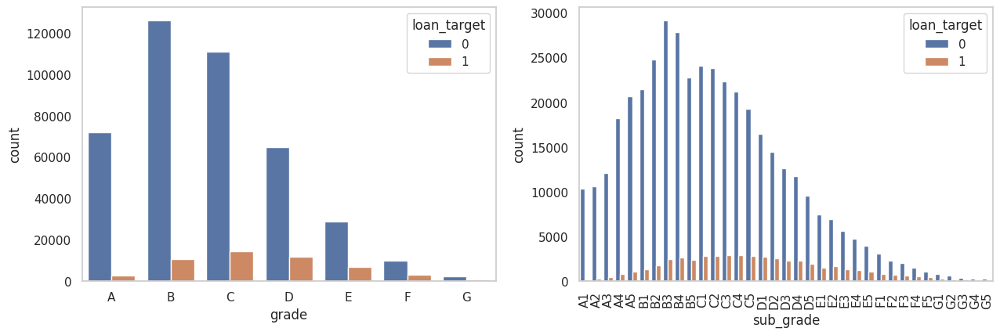

In [ ]:
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
grade = sorted(data.grade.unique().tolist())
sns.countplot(x='grade', data=data, hue='loan_target', order=grade)

plt.subplot(2, 2, 2)
sub_grade = sorted(data.sub_grade.unique().tolist())
g = sns.countplot(x='sub_grade', data=data, hue='loan_target', order=sub_grade)
g.set_xticklabels(g.get_xticklabels(), rotation=90);

It looks like `F` and `G` subgrades don't get paid back that often. Isloate those and recreate the countplot just for those subgrades.

<Axes: xlabel='sub_grade', ylabel='count'>

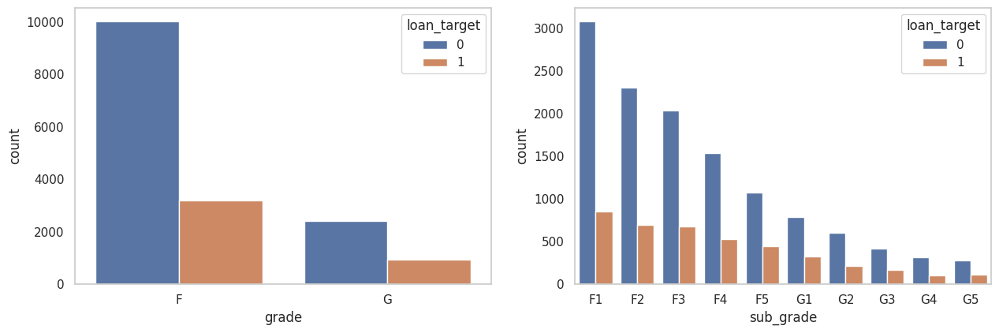

In [ ]:
df = data[(data.grade == 'F') | (data.grade == 'G')]

plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
grade = sorted(df.grade.unique().tolist())
sns.countplot(x='grade', data=df, hue='loan_target', order=grade)

plt.subplot(2, 2, 2)
sub_grade = sorted(df.sub_grade.unique().tolist())
sns.countplot(x='sub_grade', data=df, hue='loan_target', order=sub_grade)

## ✔️ `term`, `home_ownership`, `verification_status` & `purpose`

> - `term`: The number of payments on the loan. Values are in months and can be either 36 or 60.
> - `home_ownership`: The home ownership status provided by the borrower during registration or obtained from the credit report. Our values are: RENT, OWN, MORTGAGE, OTHER
> - `verification_status`: Indicates if income was verified by LC, not verified, or if the income source was verified
> - `purpose`: A category provided by the borrower for the loan request.

In [ ]:
data['home_ownership'].value_counts()

,count
home_ownership,
MORTGAGE,235875
RENT,188473
OWN,41704
OTHER,182
NONE,50
ANY,1


In [ ]:
fully_paid = data.loc[data['loan_target']== 0, 'home_ownership'].value_counts().hvplot.bar()
charged_off = data.loc[data['loan_target']== 1, 'home_ownership'].value_counts().hvplot.bar()

home_ownership_count = (fully_paid * charged_off).opts(
    title="Loan Status by Grade", xlabel='Home Ownership', ylabel='Count',
    width=350, height=350, legend_cols=2, legend_position='top_right'
).opts(xrotation=90)

home_ownership = data.home_ownership.value_counts().hvplot.bar(
    title="Loan Status by Grade", xlabel='Home Ownership', ylabel='Count',
    width=350, height=350, legend='top'
).opts(xrotation=90)

(home_ownership_count + home_ownership)

:Layout
   .Overlay.Count :Overlay
      .Bars.Count.I  :Bars   [home_ownership]   (count)
      .Bars.Count.II :Bars   [home_ownership]   (count)
   .Bars.Count    :Bars   [home_ownership]   (count)

In [ ]:
# There are 1 values in home_ownership with value of ANY and 50 of NONE; We can impute NONE and ANY to OTHER
data.loc[(data.home_ownership == 'ANY') | (data.home_ownership == 'NONE'), 'home_ownership'] = 'OTHER'
data.home_ownership.value_counts()

,count
home_ownership,
MORTGAGE,235875
RENT,188473
OWN,41704
OTHER,233


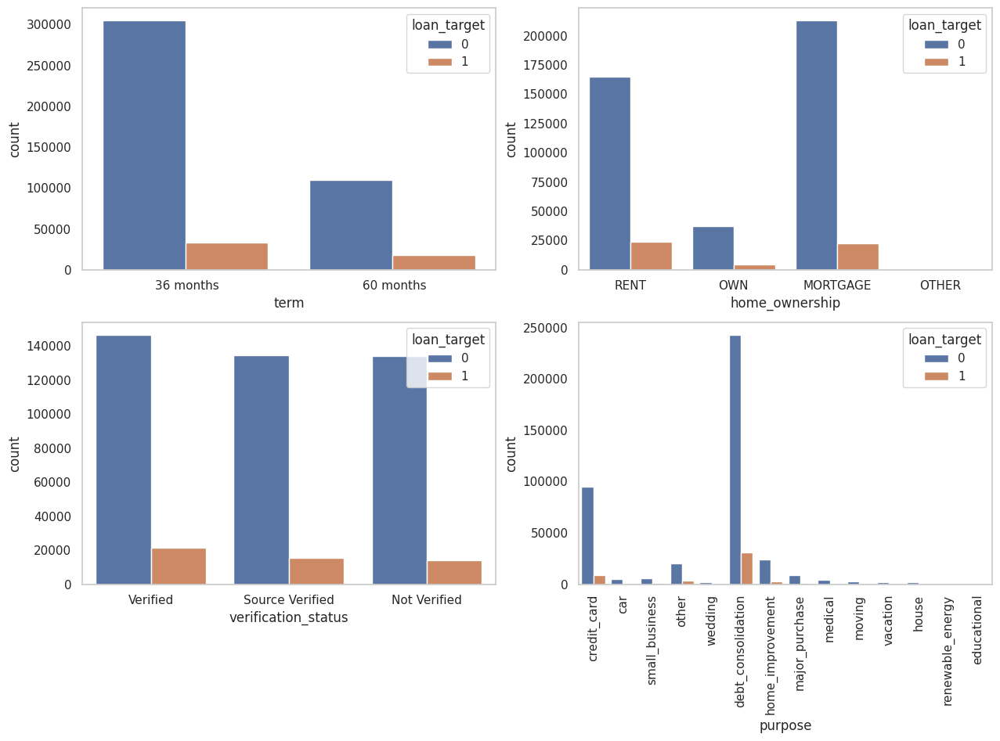

In [ ]:
plt.figure(figsize=(15, 20))

plt.subplot(4, 2, 1)
sns.countplot(x='term', data=data, hue='loan_target')

plt.subplot(4, 2, 2)
sns.countplot(x='home_ownership', data=data, hue='loan_target')

plt.subplot(4, 2, 3)
sns.countplot(x='verification_status', data=data, hue='loan_target')

plt.subplot(4, 2, 4)
g = sns.countplot(x='purpose', data=data, hue='loan_target')
g.set_xticklabels(g.get_xticklabels(), rotation=90);

In [ ]:
data.loc[data['home_ownership']=='OTHER', 'loan_target'].value_counts()

,count
loan_target,
0,187
1,46


## ✔️ `int_rate` & `annual_inc`

> - `int_rate`: Interest Rate on the loan
> - `annual_inc`: The self-reported annual income provided by the borrower during registration

In [ ]:
int_rate = data.hvplot.hist(
    y='int_rate', by='loan_target', alpha=0.3, width=350, height=400,
    title="Loan Status by Interest Rate", xlabel='Interest Rate', ylabel='Loans Counts',
    legend='top'
)

annual_inc = data.hvplot.hist(
    y='annual_inc', by='loan_target', bins=50, alpha=0.3, width=350, height=400,
    title="Loan Status by Annual Income", xlabel='Annual Income', ylabel='Loans Counts',
    legend='top'
).opts(xrotation=45)

int_rate + annual_inc

:Layout
   .NdOverlay.I  :NdOverlay   [loan_target]
      :Histogram   [int_rate]   (Count)
   .NdOverlay.II :NdOverlay   [loan_target]
      :Histogram   [annual_inc]   (Count)

In [ ]:
data[data.annual_inc <= 250000].hvplot.hist(
    y='annual_inc', by='loan_target', bins=50, alpha=0.3, width=500, height=400,
    title="Loan Status by Annual Income (<= 250000/Year)",
    xlabel='Annual Income', ylabel='Loans Counts', legend='top'
).opts(xrotation=45)

:NdOverlay   [loan_target]
   :Histogram   [annual_inc]   (Count)

In [ ]:
print((data[data.annual_inc >= 250000].shape[0] / data.shape[0]) * 100)
print((data[data.annual_inc >= 1000000].shape[0] / data.shape[0]) * 100)

0.9655039299998928
0.014368894560193874


In [ ]:
data.loc[data.annual_inc >= 1000000, 'loan_target'].value_counts()

,count
loan_target,
0,66
1,1


- It seems that loans with high intersest rate are more likely to be unpaid.

## ✔️ `emp_title` & `emp_length`

> - `emp_title`: The job title supplied by the Borrower when applying for the loan.
> - `emp_length`: Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years.

In [ ]:
print(data.emp_title.isna().sum())
print(data.emp_title.nunique())

27588
205475


In [ ]:
data['emp_title'].value_counts()[:20]

,count
emp_title,
Teacher,5399
Manager,4438
Registered Nurse,2316
RN,2204
Supervisor,1967
Project Manager,1624
Sales,1624
Owner,1527
Office Manager,1395


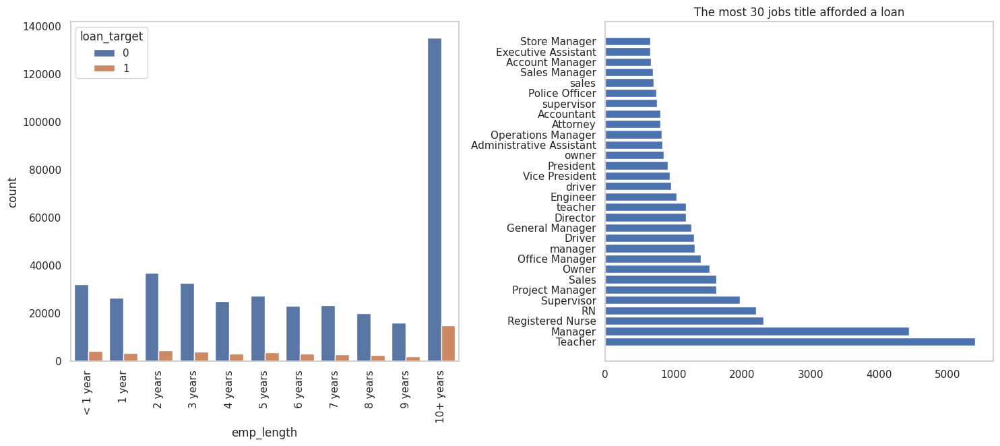

In [ ]:
plt.figure(figsize=(15, 12))

plt.subplot(2, 2, 1)
order = ['< 1 year', '1 year', '2 years', '3 years', '4 years', '5 years',
          '6 years', '7 years', '8 years', '9 years', '10+ years',]
g = sns.countplot(x='emp_length', data=data, hue='loan_target', order=order)
g.set_xticklabels(g.get_xticklabels(), rotation=90);

plt.subplot(2, 2, 2)
plt.barh(data.emp_title.value_counts()[:30].index, data.emp_title.value_counts()[:30])
plt.title("The most 30 jobs title afforded a loan")
plt.tight_layout()

## ✔️ `issue_d`, `earliest_cr_line`

> - `issue_d`: The month which the loan was funded
> - `earliest_cr_line`: The month the borrower's earliest reported credit line was opened

In [ ]:
data['issue_d'].value_counts()

,count
issue_d,
Oct-14,38782
Jul-14,29306
Nov-14,25054
May-14,19099
Apr-14,19071
Aug-14,18814
Jun-14,17179
Mar-14,16513
Jan-14,15628


In [ ]:
data['earliest_cr_line'].value_counts()

,count
earliest_cr_line,
Oct-00,3674
Aug-00,3597
Aug-01,3455
Oct-99,3406
Oct-01,3329
Nov-99,3323
Nov-00,3267
Sep-00,3256
Sep-99,3130


In [ ]:
# Change the format of the date columns to datetime
data['issue_d'] = pd.to_datetime(data['issue_d'], format='%b-%y')
data.hvplot.line(x='issue_d', y='loan_target')

:Curve   [issue_d]   (loan_target)

In [ ]:
# Xử lý đặc biệt cho earliest_cr_line
def fix_earliest_cr_line(date_str):
    if isinstance(date_str, str) and '-' in date_str:
        month, year = date_str.split('-')
        year = int(year)
        # Xác định thế kỷ phù hợp
        if 0 <= year <= 20:
            return f"{month}-20{year:02d}"
        else:
            return f"{month}-19{year:02d}"
    return date_str

# Áp dụng cho earliest_cr_line trước khi chuyển đổi
data['earliest_cr_line'] = data['earliest_cr_line'].apply(fix_earliest_cr_line)
data['earliest_cr_line'] = pd.to_datetime(data['earliest_cr_line'], format='%b-%Y')

In [ ]:
data['earliest_cr_line'].value_counts()

,count
earliest_cr_line,
2000-10-01,3674
2000-08-01,3597
2001-08-01,3455
1999-10-01,3406
2001-10-01,3329
1999-11-01,3323
2000-11-01,3267
2000-09-01,3256
1999-09-01,3130


In [ ]:
fully_paid = data.loc[data['loan_target']== 0, 'issue_d'].hvplot.hist(bins=35)
charged_off = data.loc[data['loan_target']== 1, 'issue_d'].hvplot.hist(bins=35)

# fully_paid * charged_off
loan_issue_date = (fully_paid * charged_off).opts(
    title="Loan Status by Loan Issue Date", xlabel='Loan Issue Date', ylabel='Count',
    width=350, height=350, legend_cols=2, legend_position='top_right'
).opts(xrotation=45)

fully_paid = data.loc[data['loan_target']== 0, 'earliest_cr_line'].hvplot.hist(bins=35)
charged_off = data.loc[data['loan_target']== 1, 'earliest_cr_line'].hvplot.hist(bins=35)

earliest_cr_line = (fully_paid * charged_off).opts(
    title="Loan Status by earliest_cr_line", xlabel='earliest_cr_line', ylabel='Count',
    width=350, height=350, legend_cols=2, legend_position='top_right'
).opts(xrotation=45)

loan_issue_date + earliest_cr_line

:Layout
   .Overlay.I  :Overlay
      .Histogram.I  :Histogram   [issue_d]   (Count)
      .Histogram.II :Histogram   [issue_d]   (Count)
   .Overlay.II :Overlay
      .Histogram.I  :Histogram   [earliest_cr_line]   (Count)
      .Histogram.II :Histogram   [earliest_cr_line]   (Count)

## ✔️ `title`

> - `title`: The loan title provided by the borrower

In [ ]:
data.title.isna().sum()

np.int64(21)

In [ ]:
data['title'] = data.title.str.lower()

In [ ]:
data.title.value_counts()

,count
title,
debt consolidation,185313
credit card refinancing,62661
home improvement,17400
other,12799
consolidation,7740
...,...
citicard fund,1
high intrest consolidation,1
building my credit history.,1


`title` will be removed because we have the `purpose` column with is generated from it.

## ✔️ `dti`, `open_acc`, `revol_bal`, `revol_util`, & `total_acc`

> - `dti`: A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.
> - `open_acc`: The number of open credit lines in the borrower's credit file.
> - `revol_bal`: Total credit revolving balance
> - `revol_util`: Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.
> - `total_acc`: The total number of credit lines currently in the borrower's credit file

`DTI = Total Monthly Debt Payments / Monthly Income`

It’s a financial metric that lenders use to assess a borrower’s ability to manage monthly payments and repay debts.

📌 In the Lending Club dataset:
dti is a numerical feature that represents the borrower's debt obligations as a percentage of their gross monthly income.

Example:

If someone earns $5,000/month and has $1,000 in monthly loan/credit payments,

DTI = $1,000 / $5,000 = 0.20 (or 20%)

🧠 Why is DTI important?    

A high DTI suggests the borrower is over-leveraged (riskier).

A low DTI indicates more room to handle new debt (safer).

* Lenders typically prefer DTI < 36%.
* Over 40%–43% often signals credit risk.

In [ ]:
data.dti.value_counts()

,count
dti,
14.40,410
19.20,381
12.00,369
16.80,368
18.00,365
...,...
37.43,2
39.94,1
35.54,1


In [ ]:
dti = data.hvplot.hist(
    y='dti', bins=50, width=350, height=350,
    title="dti Distribution", xlabel='dti', ylabel='Count'
)

sub_dti = data[data['dti']<=50].hvplot.hist(
    y='dti', bins=50, width=350, height=350,
    title="dti (<=30) Distribution", xlabel='dti', ylabel='Count', shared_axes=False
)

dti + sub_dti

:Layout
   .Histogram.I  :Histogram   [dti]   (Count)
   .Histogram.II :Histogram   [dti]   (Count)

In [ ]:
print(data[data['dti']>=40].shape)

(0, 54)


In [ ]:
data.loc[data['dti']>=50, 'loan_target'].value_counts()

,count
loan_target,


In [ ]:
dti = data[data['dti']<=30].hvplot.hist(
    y='dti', by='loan_target', bins=50, width=300, height=350,
    title="dti (<=30) Distribution", xlabel='dti', ylabel='Count',
    alpha=0.3, legend='top'
)

title="Loan Status by The number of open credit lines"

open_acc = data.hvplot.hist(
    y='open_acc', by='loan_target', bins=50, width=300, height=350,
    title=title, xlabel='The number of open credit lines', ylabel='Count',
    alpha=0.4, legend='top'
)

title="Loan Status by The total number of credit lines"

total_acc = data.hvplot.hist(
    y='total_acc', by='loan_target', bins=50, width=300, height=350,
    title=title, xlabel='The total number of credit lines', ylabel='Count',
    alpha=0.4, legend='top'
)

dti + open_acc + total_acc

:Layout
   .NdOverlay.I   :NdOverlay   [loan_target]
      :Histogram   [dti]   (Count)
   .NdOverlay.II  :NdOverlay   [loan_target]
      :Histogram   [open_acc]   (Count)
   .NdOverlay.III :NdOverlay   [loan_target]
      :Histogram   [total_acc]   (Count)

In [ ]:
print(data.shape)
print(data[data.open_acc > 40].shape)

(466285, 54)
(172, 54)


In [ ]:
print(data.shape)
print(data[data.total_acc > 80].shape)

(466285, 54)
(176, 54)


In [ ]:
print(data.shape)
print(data[data.revol_util > 120].shape)

(466285, 54)
(36, 54)


In [ ]:
title="Loan Status by Revolving line utilization rate"

revol_util = data.hvplot.hist(
    y='revol_util', by='loan_target', bins=50, width=350, height=400,
    title=title, xlabel='Revolving line utilization rate', ylabel='Count',
    alpha=0.4, legend='top'
)

title="Loan Status by Revolving line utilization rate (<120)"

sub_revol_util = data[data.revol_util < 120].hvplot.hist(
    y='revol_util', by='loan_target', bins=50, width=350, height=400,
    title=title, xlabel='Revolving line utilization rate', ylabel='Count',
    shared_axes=False, alpha=0.4, legend='top'
)

revol_util + sub_revol_util

:Layout
   .NdOverlay.I  :NdOverlay   [loan_target]
      :Histogram   [revol_util]   (Count)
   .NdOverlay.II :NdOverlay   [loan_target]
      :Histogram   [revol_util]   (Count)

In [ ]:
data[data.revol_util > 200]

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,pymnt_plan,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,tot_coll_amt,tot_cur_bal,total_rev_hi_lim,loan_target
368206,19076217,21278928,16500,16500,16500.0,60 months,14.49,388.14,C,C4,sales rep,< 1 year,MORTGAGE,48000.0,Source Verified,2014-06-01,n,https://www.lendingclub.com/browse/loanDetail....,debt_consolidation,debt consolidation,284xx,NC,9.33,0.0,1996-06-01,0.0,NaN,4.0,0.0,2566,366.6,15.0,f,12727.23,12727.23,6986.52,6986.52,3772.77,3213.75,0.0,0.0,0.0,Dec-15,388.14,Feb-16,Dec-15,0.0,1,INDIVIDUAL,0.0,0.0,17390.0,700.0,0
406516,14539247,16601554,3500,3500,3500.0,36 months,12.49,117.08,B,B4,Budget Analyst,10+ years,RENT,45000.0,Verified,2014-04-01,n,https://www.lendingclub.com/browse/loanDetail....,debt_consolidation,debt consolidation,918xx,CA,14.67,0.0,1998-10-01,0.0,67.0,2.0,0.0,2677,892.3,9.0,f,0.00,0.00,3944.66,3944.66,3500.00,444.66,0.0,0.0,0.0,Jul-15,2422.62,NaN,Jan-16,0.0,1,INDIVIDUAL,0.0,0.0,5668.0,300.0,0


In [ ]:
print(data.shape)
print(data[data.revol_bal > 250000].shape)

(466285, 54)
(394, 54)


In [ ]:
title = "Loan Status by Total credit revolving balance"

revol_bal = data.hvplot.hist(
    y='revol_bal', by='loan_target', bins=50, width=350, height=400,
    title=title, xlabel='Total credit revolving balance', ylabel='Count',
    alpha=0.4, legend='top'
)

title = "Loan Status by Total credit revolving balance (<250000)"

sub_revol_bal = data[data['revol_bal']<=250000].hvplot.hist(
    y='revol_bal', by='loan_target', bins=50, width=350, height=400,
    title=title, xlabel='Total credit revolving balance', ylabel='Count',
    alpha=0.4, legend='top', shared_axes=False
).opts(xrotation=45)

revol_bal + sub_revol_bal

:Layout
   .NdOverlay.I  :NdOverlay   [loan_target]
      :Histogram   [revol_bal]   (Count)
   .NdOverlay.II :NdOverlay   [loan_target]
      :Histogram   [revol_bal]   (Count)

In [ ]:
data.loc[data.revol_bal > 250000, 'loan_target'].value_counts()

,count
loan_target,
0,371
1,23


- It seems that the smaller the `dti` the more likely that the loan will not be paid.
- Only `172` borrower have more than `40` open credit lines.
- Only `176` borrwer have more than `80` credit line in the borrower credit file.

## ✔️ `pub_rec`, `initial_list_status`, `application_type`

> - `pub_rec`: Number of derogatory public records
> - `initial_list_status`: The initial listing status of the loan. Possible values are – W, F
> - `application_type`: Indicates whether the loan is an individual application or a joint application with two co-borrowers

In [ ]:
# Tạo bảng đếm số lượng theo pub_rec và loan_target
grouped = data.groupby(['pub_rec', 'loan_target']).size().unstack().fillna(0)
# Đổi tên cột để rõ ràng hơn
grouped.columns = ['Good', 'Bad']

# Vẽ biểu đồ grouped bar chart
grouped.hvplot.bar(
    rot=0,
    title="Loan Status by Number of derogatory public records",
    xlabel="Number of derogatory public records",
    ylabel="Count",
    width=700,
    height=400,
    stacked=False,
    color=["green", "red"]
)


:Bars   [pub_rec,Variable]   (value)

In [ ]:
xlabel = "The initial listing status of the loan"
title = "Loan Status by The initial listing status of the loan"

fully_paid = data.loc[data['loan_target']== 0, 'initial_list_status'].value_counts().hvplot.bar()
charged_off = data.loc[data['loan_target']==1, 'initial_list_status'].value_counts().hvplot.bar()

(fully_paid * charged_off).opts(
    title=title, xlabel=xlabel, ylabel='Count',
    width=400, height=400, legend_cols=2, legend_position='top_right'
)

:Overlay
   .Bars.Count.I  :Bars   [initial_list_status]   (count)
   .Bars.Count.II :Bars   [initial_list_status]   (count)

In [ ]:
fully_paid = data.loc[data['loan_target']==0, 'application_type'].value_counts().hvplot.bar()
charged_off = data.loc[data['loan_target']==1, 'application_type'].value_counts().hvplot.bar()

(fully_paid * charged_off).opts(
    title="Loan Status by Application Type", xlabel="Application Type", ylabel='Count',
    width=400, height=400, legend_cols=2, legend_position='top_right'
)

:Overlay
   .Bars.Count.I  :Bars   [application_type]   (count)
   .Bars.Count.II :Bars   [application_type]   (count)

<Axes: xlabel='application_type', ylabel='count'>

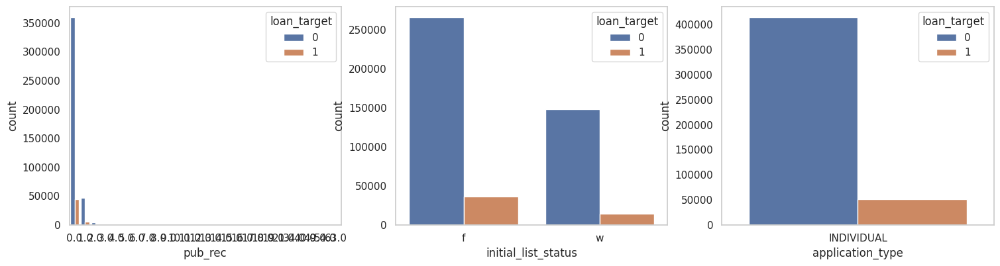

In [ ]:
plt.figure(figsize=(18, 30))

plt.subplot(6,3,1)
sns.countplot(x='pub_rec', data=data, hue='loan_target')

plt.subplot(6, 3, 2)
sns.countplot(x='initial_list_status', data=data, hue='loan_target')

plt.subplot(6, 3, 3)
sns.countplot(x='application_type', data=data, hue='loan_target')

## ✔️ `addr_state`

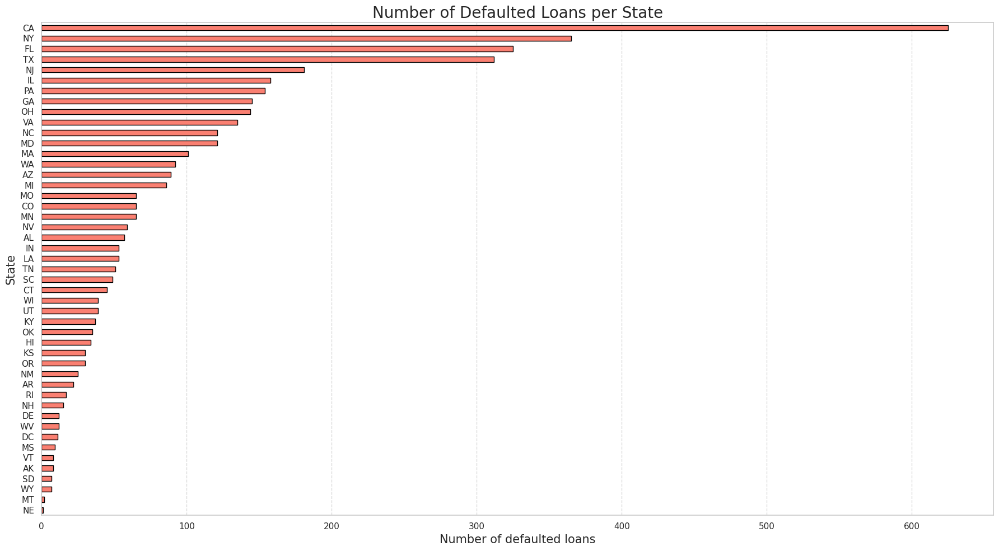

In [ ]:
fig = plt.figure(figsize=(18,10))
(
    df[df['loan_target']==1]
    .groupby('addr_state')['loan_target']
    .count()
    .sort_values()
    .plot(kind='barh', color='salmon', edgecolor='black')
)

plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.ylabel('State', fontsize=15)
plt.xlabel('Number of defaulted loans', fontsize=15)
plt.title('Number of Defaulted Loans per State', fontsize=20)
plt.tight_layout()
plt.show()

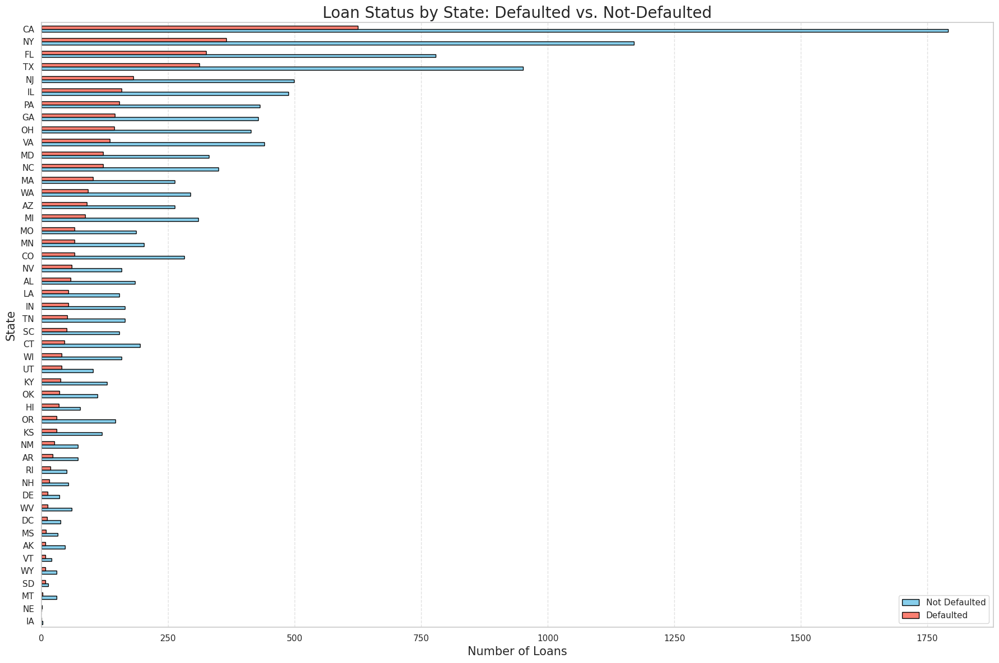

In [ ]:
# Aggregate both defaulted and non-defaulted counts
loan_counts = df.groupby(['addr_state', 'loan_target']).size().unstack(fill_value=0)

# Sort by total loans or default count if you like
loan_counts = loan_counts.sort_values(by=1)  # Sort by number of defaults

# Plot
loan_counts.plot(kind='barh', figsize=(18, 12),
                 color={0: 'skyblue', 1: 'salmon'}, edgecolor='black')

plt.xlabel('Number of Loans', fontsize=15)
plt.ylabel('State', fontsize=15)
plt.title('Loan Status by State: Defaulted vs. Not-Defaulted', fontsize=20)
plt.legend(['Not Defaulted', 'Defaulted'])
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


It can be seen that there are more number of loans taken amount from the same states where there are more number of defaulted risk. This is why the state cannot be taken as a major feature for knowing if a loan will be defaulted or not.

# 3. Data Preprocessing:

**Section Goals:**
> - Remove or fill any missing data.

> - Remove unnecessary or repetitive features.   
        - The follwing features are identifiers and can not be used in building model. id, member id, url, title, desc, zipcode and emp_title  
        - The sub_grade column wll also be droped as it contains similar information as the grade columns.  
        - Features that contain information about the future will not be included in building the model since those events are yet to occur. The features include next_pymnt_d, recoveries, collection_recovery_fee, total_rec_prncp and total_rec_late_fee, issue_d (This would be data leakage, we wouldn't know beforehand whether or not a loan would be issued when using our model, so in theory we wouldn't have an issue_date.)  
        - application_type also be dropped as it only has 1 value = INDIVIDUAL  
        - pymnt_plan also be dropped as it has only 1 value = n

> - Convert categorical string features to dummy variables.

In [ ]:
for i in data.columns:

    if data[i].nunique() < 10:

        print({i: df[i].value_counts()})

{'term': term
60 months    13010
36 months     3541
Name: count, dtype: int64}
{'grade': grade
F    13229
G     3322
Name: count, dtype: int64}
{'home_ownership': home_ownership
MORTGAGE    7774
RENT        7201
OWN         1556
OTHER         14
NONE           6
Name: count, dtype: int64}
{'verification_status': verification_status
Verified           9680
Source Verified    5176
Not Verified       1695
Name: count, dtype: int64}
{'pymnt_plan': pymnt_plan
n    16549
y        2
Name: count, dtype: int64}
{'initial_list_status': initial_list_status
f    11405
w     5146
Name: count, dtype: int64}
{'collections_12_mths_ex_med': collections_12_mths_ex_med
0.0    16349
1.0      170
2.0       13
Name: count, dtype: int64}
{'policy_code': policy_code
1    16551
Name: count, dtype: int64}
{'application_type': application_type
INDIVIDUAL    16551
Name: count, dtype: int64}
{'acc_now_delinq': acc_now_delinq
0.0    16420
1.0      121
2.0       10
Name: count, dtype: int64}
{'loan_target': loan_tar

In [ ]:
#dropping irrelevant cols & cols with missing values
columns_to_drop = ['id', 'member_id', 'sub_grade', 'emp_title', 'url', 'title', 'zip_code', 'next_pymnt_d',
                  'recoveries', 'collection_recovery_fee', 'total_rec_prncp', 'total_rec_late_fee', 'policy_code','issue_d','application_type', 'pymnt_plan']
data.drop(columns=columns_to_drop, inplace=True, axis=1)

In [ ]:
data.shape

(466285, 38)

## Checking Correlation among Features

Numeric columns: ['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'int_rate', 'installment', 'annual_inc', 'dti', 'delinq_2yrs', 'inq_last_6mths', 'mths_since_last_delinq', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_int', 'last_pymnt_amnt', 'collections_12_mths_ex_med', 'acc_now_delinq', 'tot_coll_amt', 'tot_cur_bal', 'total_rev_hi_lim', 'loan_target']


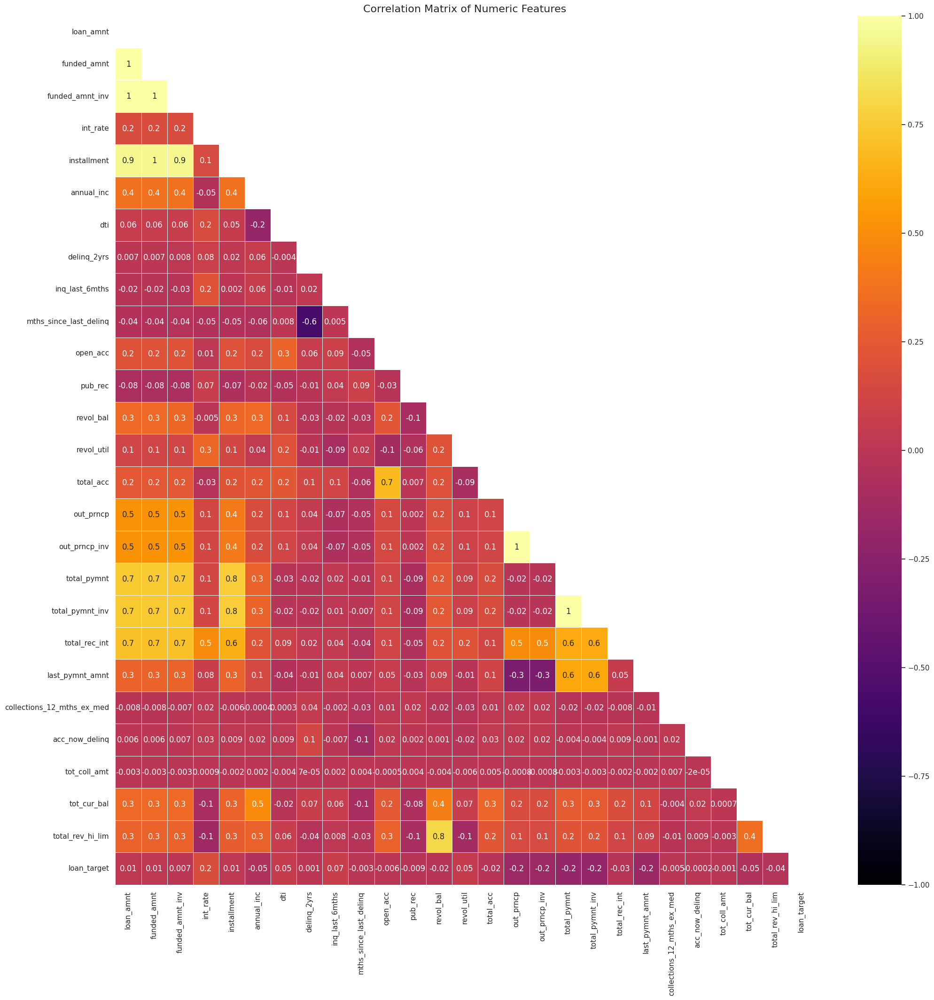

In [ ]:
numeric_data = data.select_dtypes(include=[np.number])
print("Numeric columns:", numeric_data.columns.tolist())
corr_matrix = numeric_data.corr().fillna(0)
mask = np.zeros_like(corr_matrix, dtype=bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(24, 24))
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap="inferno", vmin=-1, vmax=1,
            fmt='.1g', edgecolor='w', linewidth=0.6)
plt.title("Correlation Matrix of Numeric Features", fontsize=16)
plt.show()

## Removing Multicolliear Features

In [ ]:
data.drop(columns=['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'installment',
                   'total_pymnt_inv',  'out_prncp_inv','revol_bal'], inplace=True) # drop columns with high correlation

Numeric columns: ['int_rate', 'annual_inc', 'dti', 'delinq_2yrs', 'inq_last_6mths', 'mths_since_last_delinq', 'open_acc', 'pub_rec', 'revol_util', 'total_acc', 'out_prncp', 'total_pymnt', 'total_rec_int', 'last_pymnt_amnt', 'collections_12_mths_ex_med', 'acc_now_delinq', 'tot_coll_amt', 'tot_cur_bal', 'total_rev_hi_lim', 'loan_target']


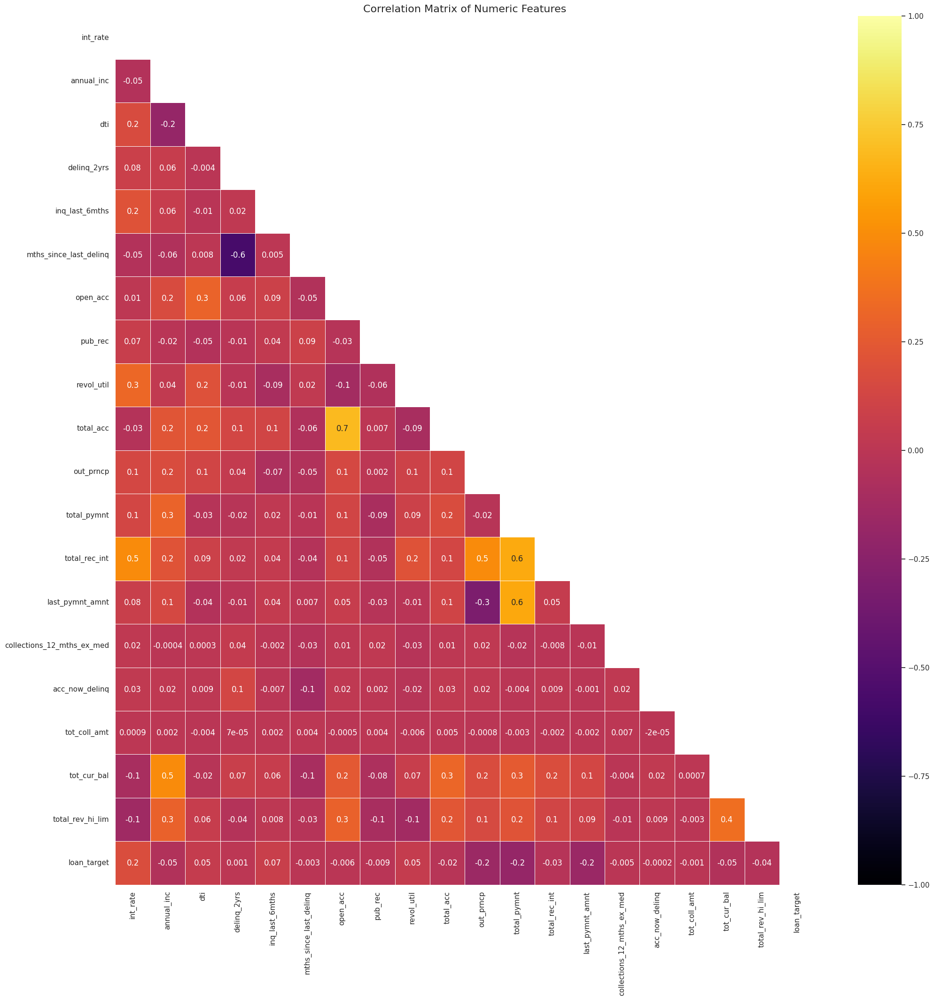

In [ ]:
numeric_data = data.select_dtypes(include=[np.number])  # Filter numeric columns
print("Numeric columns:", numeric_data.columns.tolist())
corr_matrix = numeric_data.corr().fillna(0)
mask = np.zeros_like(corr_matrix, dtype=bool)  # Updated dtype
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(24, 24))
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap="inferno", vmin=-1, vmax=1,
            fmt='.1g', edgecolor='w', linewidth=0.6)
plt.title("Correlation Matrix of Numeric Features", fontsize=16)
plt.show()

In [ ]:
##descriptive statistics
data.describe()

,int_rate,annual_inc,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,open_acc,pub_rec,revol_util,total_acc,out_prncp,total_pymnt,total_rec_int,last_pymnt_amnt,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,total_rev_hi_lim,loan_target
count,466285.000000,4.662810e+05,466285.000000,466256.000000,466256,466256.000000,215934.000000,466256.000000,466256.000000,465945.000000,466256.000000,466285.000000,466285.000000,466285.000000,466285.000000,466140.000000,466256.000000,3.960090e+05,3.960090e+05,3.960090e+05,466285.000000
mean,13.829236,7.327738e+04,17.218758,0.284678,1997-09-15 22:08:41.574414208,0.804745,34.104430,11.187069,0.160564,56.176947,25.064430,4410.062342,11540.686220,2588.677225,3123.913796,0.009085,0.004002,1.919135e+02,1.388017e+05,3.037909e+04,0.109307
min,5.420000,1.896000e+03,0.000000,0.000000,1944-01-01 00:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000
25%,10.990000,4.500000e+04,11.360000,0.000000,1994-03-01 00:00:00,0.000000,16.000000,8.000000,0.000000,39.200000,17.000000,0.000000,5552.125349,957.280000,312.620000,0.000000,0.000000,0.000000e+00,2.861800e+04,1.350000e+04,0.000000
50%,13.660000,6.300000e+04,16.870000,0.000000,1999-02-01 00:00:00,0.000000,31.000000,10.000000,0.000000,57.600000,23.000000,441.470000,9419.250943,1818.880000,545.960000,0.000000,0.000000,0.000000e+00,8.153900e+04,2.280000e+04,0.000000
75%,16.490000,8.896000e+04,22.780000,0.000000,2002-08-01 00:00:00,1.000000,49.000000,14.000000,0.000000,74.700000,32.000000,7341.650000,15308.158460,3304.530000,3187.510000,0.000000,0.000000,0.000000e+00,2.089530e+05,3.790000e+04,0.000000
max,26.060000,7.500000e+06,39.990000,29.000000,2011-11-01 00:00:00,33.000000,188.000000,84.000000,63.000000,892.300000,156.000000,32160.380000,57777.579870,24205.620000,36234.440000,20.000000,5.000000,9.152545e+06,8.000078e+06,9.999999e+06,1.000000
std,4.357587,5.496357e+04,7.851121,0.797365,NaN,1.091598,21.778487,4.987526,0.510863,23.732628,11.600141,6355.078769,8265.627112,2483.809661,5554.737393,0.108648,0.068637,1.463021e+04,1.521147e+05,3.724713e+04,0.312024


## Data Type Transformation

In [ ]:
cat_cols = data.select_dtypes(exclude=[np.number]).columns.tolist()
for col in cat_cols:
    unique_values = data[col].unique()
    print(f"\n{col}:")
    print(unique_values)


term:
[' 36 months' ' 60 months']

grade:
['B' 'C' 'A' 'E' 'F' 'D' 'G']

emp_length:
['10+ years' '< 1 year' '1 year' '3 years' '8 years' '9 years' '4 years'
 '5 years' '6 years' '2 years' '7 years' nan]

home_ownership:
['RENT' 'OWN' 'MORTGAGE' 'OTHER']

verification_status:
['Verified' 'Source Verified' 'Not Verified']

purpose:
['credit_card' 'car' 'small_business' 'other' 'wedding'
 'debt_consolidation' 'home_improvement' 'major_purchase' 'medical'
 'moving' 'vacation' 'house' 'renewable_energy' 'educational']

addr_state:
['AZ' 'GA' 'IL' 'CA' 'OR' 'NC' 'TX' 'VA' 'MO' 'CT' 'UT' 'FL' 'NY' 'PA'
 'MN' 'NJ' 'KY' 'OH' 'SC' 'RI' 'LA' 'MA' 'WA' 'WI' 'AL' 'CO' 'KS' 'NV'
 'AK' 'MD' 'WV' 'VT' 'MI' 'DC' 'SD' 'NH' 'AR' 'NM' 'MT' 'HI' 'WY' 'OK'
 'DE' 'MS' 'TN' 'IA' 'NE' 'ID' 'IN' 'ME']

earliest_cr_line:
<DatetimeArray>
['1985-01-01 00:00:00', '1999-04-01 00:00:00', '2001-11-01 00:00:00',
 '1996-02-01 00:00:00', '1996-01-01 00:00:00', '2004-11-01 00:00:00',
 '2005-07-01 00:00:00', '2007-01-01 

Change data types these following columns into numerical/datetime. Also the NaN values should be replaced with zeroes wherever applicable.

- emp_length,
- term,
- last_pymnt_d,
- last_credit_pull_d
- earliest_cr_line

We will define functions to transform their data types.

In [ ]:
# converting emp_length to numeric and assign NaN to zero
def emp_length_convert(df, column):
    # Remove '+', ' years', ' year' and handle '< 1 year'
    df[column] = df[column].str.replace(r'\+ years', '', regex=True)
    df[column] = df[column].str.replace(r'< 1 year', '0', regex=True)
    df[column] = df[column].str.replace(r' years', '', regex=True)
    df[column] = df[column].str.replace(r' year', '', regex=True)

    # Convert to numeric, invalid parsing will become NaN
    df[column] = pd.to_numeric(df[column], errors='coerce')

    # Fill NaNs with 0
    df[column].fillna(0, inplace=True)

emp_length_convert(data, 'emp_length')
print(data['emp_length'].unique())
print(data['emp_length'].isnull().sum())
print(data['emp_length'].dtype)

[10.  0.  1.  3.  8.  9.  4.  5.  6.  2.  7.]
0
float64


In [ ]:
# converting term to numeric
def term_numeric(df, column):
    df[column] = pd.to_numeric(df[column].str.replace(' months', ''))

term_numeric(data, 'term')
print(data['term'].unique())
print(data['term'].isnull().sum())
print(data['term'].dtype)

[36 60]
0
int64


In [ ]:
def date_columns(df, column, today_date='2017-12-31'):
    # set reference date
    today_date = pd.to_datetime(today_date)

    # convert to datetime only if it's not already
    if not np.issubdtype(df[column].dtype, np.datetime64):
        df[column] = pd.to_datetime(df[column], format="%b-%y", errors='coerce')

    df['mths_since_' + column] = ((today_date - df[column]) / np.timedelta64(1, 'D') / 30.44).round()

    # replace negative values (if any)
    max_val = df['mths_since_' + column].max()
    df['mths_since_' + column] = df['mths_since_' + column].apply(lambda x: max_val if x < 0 else x)

    # drop original date column
    df.drop(columns=[column], inplace=True)
date_columns(data, 'earliest_cr_line', today_date='2017-12-31')
date_columns(data, 'last_pymnt_d', today_date='2017-12-31')
date_columns(data, 'last_credit_pull_d', today_date='2017-12-31')
print("Shape after date preprocessing:", data.shape)

Shape after date preprocessing: (466285, 31)


In [ ]:
# checking for missing values again

missing_values = data.isnull().sum()
missing_values[missing_values>0]/len(data)

,0
annual_inc,0.000009
delinq_2yrs,0.000062
inq_last_6mths,0.000062
mths_since_last_delinq,0.536906
open_acc,0.000062
pub_rec,0.000062
revol_util,0.000729
total_acc,0.000062
collections_12_mths_ex_med,0.000311
acc_now_delinq,0.000062


For the 'mths_since_last_delinq' column, I'll be filling in the missing value with the median of the columns as the data in the column is continuous.

In [ ]:
data['mths_since_last_delinq'] = data['mths_since_last_delinq'].fillna(data['mths_since_last_delinq'].median())

However for columns like 'total_rev_hi_lim','tot_col_ammnt',etc. , I won't be filling in the missing data because they will certainly be of high feature importance due to their description. If they do not seem to be of high importance we can always re-iterate and fill the missing values later.

So, dropping all remaining null values

In [ ]:
data.dropna(inplace=True)

In [ ]:
data.shape

(395492, 31)

In [ ]:
# seperating categorical features from numerical
categorical_features = data.select_dtypes(exclude='number')
numerical_features = data.select_dtypes(exclude='object')

In [ ]:
# converting to dataframe
filled_data = data.copy()

In [ ]:
preprocess_data = data.copy()

#checking for any missing values
missing = preprocess_data.isnull().sum()
missing[missing>0]

,0


In [ ]:
preprocess_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 395492 entries, 42535 to 466284
Data columns (total 31 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   term                           395492 non-null  int64  
 1   int_rate                       395492 non-null  float64
 2   grade                          395492 non-null  object 
 3   emp_length                     395492 non-null  float64
 4   home_ownership                 395492 non-null  object 
 5   annual_inc                     395492 non-null  float64
 6   verification_status            395492 non-null  object 
 7   purpose                        395492 non-null  object 
 8   addr_state                     395492 non-null  object 
 9   dti                            395492 non-null  float64
 10  delinq_2yrs                    395492 non-null  float64
 11  inq_last_6mths                 395492 non-null  float64
 12  mths_since_last_delinq         

In [ ]:
# converting to dataframe for advance model
backup_data = data.copy()
preprocess_data_advanced = data.copy()

In [ ]:
preprocess_data_advanced.info()

<class 'pandas.core.frame.DataFrame'>
Index: 395492 entries, 42535 to 466284
Data columns (total 31 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   term                           395492 non-null  int64  
 1   int_rate                       395492 non-null  float64
 2   grade                          395492 non-null  object 
 3   emp_length                     395492 non-null  float64
 4   home_ownership                 395492 non-null  object 
 5   annual_inc                     395492 non-null  float64
 6   verification_status            395492 non-null  object 
 7   purpose                        395492 non-null  object 
 8   addr_state                     395492 non-null  object 
 9   dti                            395492 non-null  float64
 10  delinq_2yrs                    395492 non-null  float64
 11  inq_last_6mths                 395492 non-null  float64
 12  mths_since_last_delinq         

Finally no missing values. We are now left with a reasonable amount of data for modelling.

# 4. Binning, Weight of Evidence (WoE), Information Value (IV)

- **Binning** creates buckets of independent variables based on ranking methods. Binning helps convert continuous variables into categorical ones. This process allows us to better understand feature performance. Insights from this part of the analysis can be useful in devising portfolio risk strategies. One simple binning example using the variable "age" is shown below for illustration.

- **Weight of Evidence (WoE)** helps determine which categories should be binned together. WoE measures the strength of a bin in differentiating between Good and Bad accounts. A WoE value less than 0 indicates that the variable bin captures a higher proportion of Bad accounts compared to Good ones.

$$
WoE = \ln\left(\frac{\text{\% of Good}}{\text{\% of Bad}}\right) = \ln\left(\frac{\text{Non-Events Ratio}}{\text{Events Ratio}}\right)
$$

- **Information Value (IV)** helps identify which variables are useful for prediction in a logistic regression model. IV measures the overall predictive power of a variable and is particularly useful for feature selection.

$$
IV = \sum \left( WoE \times (\%\text{ of Non-Events} - \%\text{ of Events}) \right)
$$

**Where:**

- **% of Goods in Bin** = Number of Good accounts in the bin / Total number of Good accounts  
- **% of Bads in Bin** = Number of Bad accounts in the bin / Total number of Bad accounts

### Interpretation of IV Values:

| IV Value          | Predictive Power          |
|-------------------|---------------------------|
| Less than 0.02    | Not useful for prediction |
| 0.02 to 0.1       | Weak predictive power     |
| 0.1 to 0.3        | Medium predictive power   |
| 0.3 to 0.5        | Strong predictive power   |
| Greater than 0.5  | Suspicious or overfitting |


In [ ]:
#function to calculate Weight of Evidence (WoE) and Information Value (IV)

def iv_woe(data, target, bins=10, show_woe=False):
    newDF, woeDF = pd.DataFrame(), pd.DataFrame()
    cols = data.columns

    # Run WoE and IV on all the independent variables
    for ivars in cols[~cols.isin([target])]:
        if (data[ivars].dtype.kind in 'bifc') and (len(np.unique(data[ivars])) > 10):
            binned_x = pd.qcut(data[ivars], bins, duplicates='drop')
            d0 = pd.DataFrame({'x': binned_x, 'y': data[target]})
        else:
            d0 = pd.DataFrame({'x': data[ivars], 'y': data[target]})
        d = d0.groupby("x", as_index=False).agg({"y": ["count", "sum"]})
        d.columns = ['Cutoff', 'N', 'Events']
        d['% of Events'] = np.maximum(d['Events'], 0.5) / d['Events'].sum()  # % of Bad
        d['Non-Events'] = d['N'] - d['Events']
        d['% of Non-Events'] = np.maximum(d['Non-Events'], 0.5) / d['Non-Events'].sum()  # % of Good
        # Fix WoE: ln(% of Good / % of Bad)
        d['WoE'] = np.log(d['% of Non-Events'] / d['% of Events'])
        d['IV'] = d['WoE'] * (d['% of Non-Events'] - d['% of Events'])
        d.insert(loc=0, column='Variable', value=ivars)
        print("Information value of " + ivars + " is " + str(round(d['IV'].sum(), 6)))
        temp = pd.DataFrame({"Variable": [ivars], "IV": [d['IV'].sum()]}, columns=["Variable", "IV"])
        newDF = pd.concat([newDF, temp], axis=0)
        woeDF = pd.concat([woeDF, d], axis=0)

        if show_woe == True:
            print(d)

    return newDF, woeDF

iv, woe = iv_woe(preprocess_data, target='loan_target', bins=20)

Information value of term is 0.031995
Information value of int_rate is 0.39861
Information value of grade is 0.315065
Information value of emp_length is 0.006894
Information value of home_ownership is 0.022979
Information value of annual_inc is 0.053907
Information value of verification_status is 0.02756
Information value of purpose is 0.024598
Information value of addr_state is 0.012743
Information value of dti is 0.042443
Information value of delinq_2yrs is 0.000235
Information value of inq_last_6mths is 0.042022
Information value of mths_since_last_delinq is 0.000795
Information value of open_acc is 0.001348
Information value of pub_rec is 0.000252
Information value of revol_util is 0.024584
Information value of total_acc is 0.004345
Information value of initial_list_status is 0.012921
Information value of out_prncp is 0.768143
Information value of total_pymnt is 0.614938
Information value of total_rec_int is 0.017131
Information value of last_pymnt_amnt is 1.508506
Information valu

The rule of thumb says that all variables with IV < 0.02 are not useful for prediction and IV > 0.5 have a suspicious predictive power. Therefore, the follwing variables will not be included out_prncp, last_pymnt_amnt, delinq_2yrs, mths_since_last_delinq, open_acc, pub_rec, total_acc, collections_12_mths_ex_med, acc_now_delinq, tot_coll_amt and mths_since_last_pymnt_d

In [ ]:
# Filter based on IV thresholds
low_iv = iv[iv['IV'] < 0.02]
high_iv = iv[iv['IV'] > 0.5]

# Combine both into one list of variables to drop
variables_to_drop = pd.concat([low_iv, high_iv])['Variable'].tolist()

# Print formatted explanation and list
print("Drop variables with IV < 0.02 and IV > 0.5 \n")

for var in variables_to_drop:
    print(f"'{var}',")


Drop variables with IV < 0.02 and IV > 0.5 

'emp_length',
'addr_state',
'delinq_2yrs',
'mths_since_last_delinq',
'open_acc',
'pub_rec',
'total_acc',
'initial_list_status',
'total_rec_int',
'collections_12_mths_ex_med',
'acc_now_delinq',
'tot_coll_amt',
'mths_since_earliest_cr_line',
'out_prncp',
'total_pymnt',
'last_pymnt_amnt',
'mths_since_last_pymnt_d',


In [ ]:
#drop columns with low IV
preprocess_data.drop(columns=[ 'last_pymnt_amnt', 'revol_util', 'delinq_2yrs', 'mths_since_last_delinq',
                              'open_acc', 'pub_rec',  'collections_12_mths_ex_med', 'acc_now_delinq',
                              'tot_coll_amt', 'mths_since_last_pymnt_d', 'emp_length','mths_since_earliest_cr_line',
                              'total_acc'], axis=1, inplace=True)

In [ ]:
# dummy variables for cat cols
data_dummies1 = [pd.get_dummies(preprocess_data['grade'], prefix='grade', prefix_sep=':'),
                 pd.get_dummies(preprocess_data['home_ownership'], prefix='home_ownership', prefix_sep=':'),
                 pd.get_dummies(preprocess_data['verification_status'], prefix='verification_status', prefix_sep=':'),
                 pd.get_dummies(preprocess_data['purpose'], prefix='purpose', prefix_sep=':'),
                 pd.get_dummies(preprocess_data['addr_state'], prefix='addr_state', prefix_sep=':'),
                 pd.get_dummies(preprocess_data['initial_list_status'], prefix='initial_list_status', prefix_sep=':')
                ]

In [ ]:
# turn  data_dummies into dataframe
categorical_dummies = pd.concat(data_dummies1, axis=1)

In [ ]:
# concatinating preprocess_data with categorical_dummies
preprocess_data = pd.concat([preprocess_data, categorical_dummies], axis=1)

In [ ]:
preprocess_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 395492 entries, 42535 to 466284
Data columns (total 97 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   term                                 395492 non-null  int64  
 1   int_rate                             395492 non-null  float64
 2   grade                                395492 non-null  object 
 3   home_ownership                       395492 non-null  object 
 4   annual_inc                           395492 non-null  float64
 5   verification_status                  395492 non-null  object 
 6   purpose                              395492 non-null  object 
 7   addr_state                           395492 non-null  object 
 8   dti                                  395492 non-null  float64
 9   inq_last_6mths                       395492 non-null  float64
 10  initial_list_status                  395492 non-null  object 
 11  out_prncp     

In [ ]:
### Define WoE and Plot Functions
def woe_categorical(df, cat_feature, good_bad_df):
    # Combine the categorical feature and target
    df = pd.concat([df[cat_feature], good_bad_df], axis=1)
    # Group by category to get counts and mean of target (prop_good)
    df = pd.concat([df.groupby(df.columns.values[0], as_index=False)[df.columns.values[1]].count(),
                    df.groupby(df.columns.values[0], as_index=False)[df.columns.values[1]].mean()], axis=1)
    df = df.iloc[:, [0, 1, 3]]
    df.columns = [df.columns.values[0], 'n_obs', 'prop_good']

    # Calculate proportions and counts
    df['prop_n_obs'] = df['n_obs'] / df['n_obs'].sum()
    df['n_good'] = df['prop_good'] * df['n_obs']  # Number of good loans (target = 0)
    df['n_bad'] = (1 - df['prop_good']) * df['n_obs']  # Number of bad loans (target = 1)
    df['prop_n_good'] = df['n_good'] / df['n_good'].sum()  # Proportion of all good loans
    df['prop_n_bad'] = df['n_bad'] / df['n_bad'].sum()  # Proportion of all bad loans

    # Calculate WoE: ln(% of Good / % of Bad)
    # Add small constant to avoid division by zero
    df['WoE'] = np.log((df['prop_n_good'] + 1e-6) / (df['prop_n_bad'] + 1e-6))

    # Sort by WoE in descending order (A -> G for grade)
    df = df.sort_values(['WoE'], ascending=False)
    df = df.reset_index(drop=True)

    # Calculate differences
    df['diff_prop_good'] = df['prop_good'].diff().abs()
    df['diff_WoE'] = df['WoE'].diff().abs()

    # Calculate IV for each category
    df['IV'] = (df['prop_n_good'] - df['prop_n_bad']) * df['WoE']
    # Store total IV as a separate column or variable (not overwriting)
    total_iv = df['IV'].sum()
    df['Total_IV'] = total_iv  # Add as a new column for clarity

    return df

In [ ]:
def plot_by_woe(df_WoE, rotation_of_x_axis_labels=0):
    x = np.array(df_WoE.iloc[:, 0].apply(str))
    y = df_WoE['WoE']
    plt.figure(figsize=(18, 12))
    plt.plot(x, y, marker='o', color='hotpink', linestyle='dashed', linewidth=3,
             markersize=18, markeredgecolor='cyan', markerfacecolor='black')
    plt.xlabel(df_WoE.columns[0])
    plt.ylabel('Weight of Evidence')
    plt.title(str('Weight of Evidence by ' + df_WoE.columns[0]))
    plt.xticks(rotation=rotation_of_x_axis_labels, fontsize=14)
    plt.yticks(fontsize=14)
    plt.show()

In [ ]:
#seperating data into target and features
X= preprocess_data.drop(columns='loan_target', axis=1)
y=preprocess_data['loan_target']

## Categorical Variables by Plotting WoE

In [ ]:
# check for categorical features
cat_features = X.select_dtypes(include=['object']).columns.tolist()
print("Categorical features:", cat_features)

Categorical features: ['grade', 'home_ownership', 'verification_status', 'purpose', 'addr_state', 'initial_list_status']


### **1. Analyzing Grade variable**

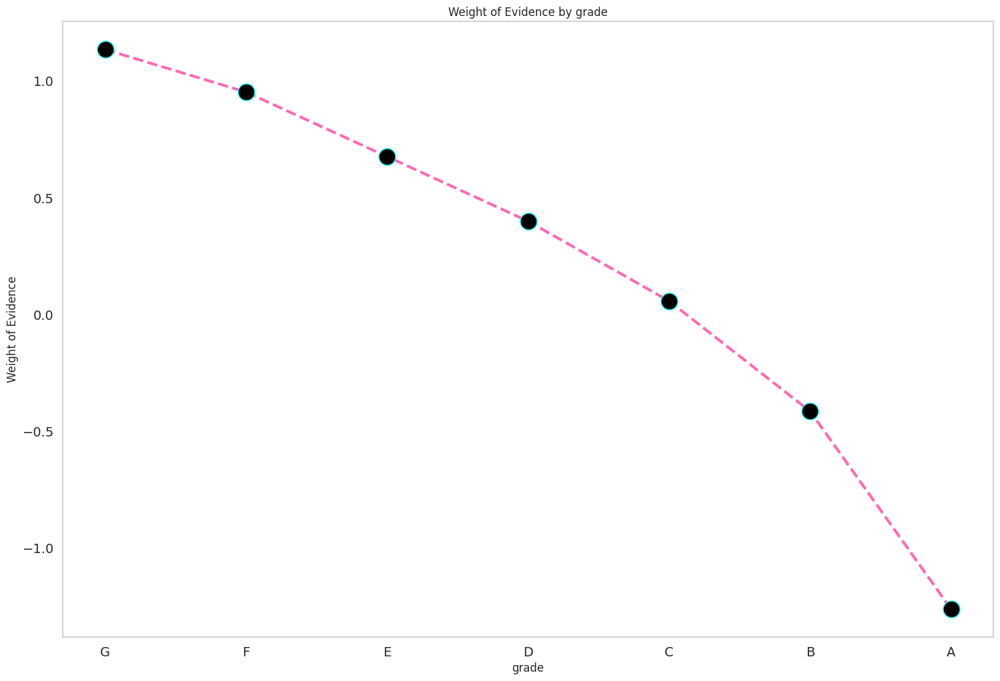

In [ ]:
df_grade = woe_categorical(X, 'grade', y)
plot_by_woe(df_grade)

- Grade G has the highest WoE (around +1.1): this means the proportion of Bad accounts is significantly higher than Good accounts – it's a risky group.

- Grade A has the lowest WoE (around -1.1): indicating the group contains mostly Good accounts, very low risk.

The chart shows that grade is a very strong variable for distinguishing between Good and Bad accounts.

The WoE curve is smooth, monotonic, and logically ordered → ideal for modeling (e.g., logistic regression, scorecards).

Given the likely high overall IV value for grade, it should definitely be kept in the model.

### **2. Analyzing Home Ownership variable**

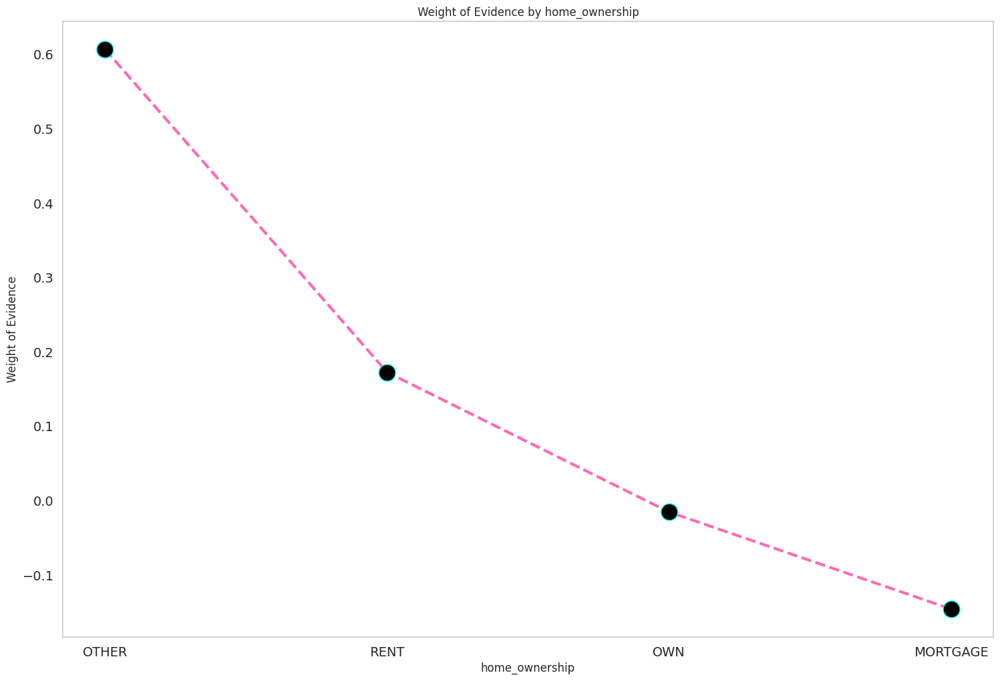

In [ ]:
df_home = woe_categorical(X, 'home_ownership', y)
plot_by_woe(df_home)

In [ ]:
df_home

,home_ownership,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV,Total_IV
0,OTHER,88,0.170455,0.000223,15.0,73.0,0.000377,0.000205,0.606777,NaN,NaN,0.000104,0.022978
1,RENT,154769,0.117239,0.391333,18145.0,136624.0,0.456398,0.384061,0.172562,0.053215,0.434214,0.012483,0.022978
2,OWN,36210,0.099144,0.091557,3590.0,32620.0,0.090299,0.091697,-0.015373,0.018095,0.187935,0.000022,0.022978
3,MORTGAGE,204425,0.088086,0.516888,18007.0,186418.0,0.452927,0.524036,-0.145830,0.011058,0.130457,0.010370,0.022978


The WoE trend decreases from OTHER to MORTGAGE, suggesting that home ownership is inversely related to default risk.

- Borrowers with a mortgage or who own their home are generally safer.

- Borrowers with uncategorized or "OTHER" ownership status are the riskiest.  
Group RENT+OTHER

### **3. Analyzing Verification status variable**

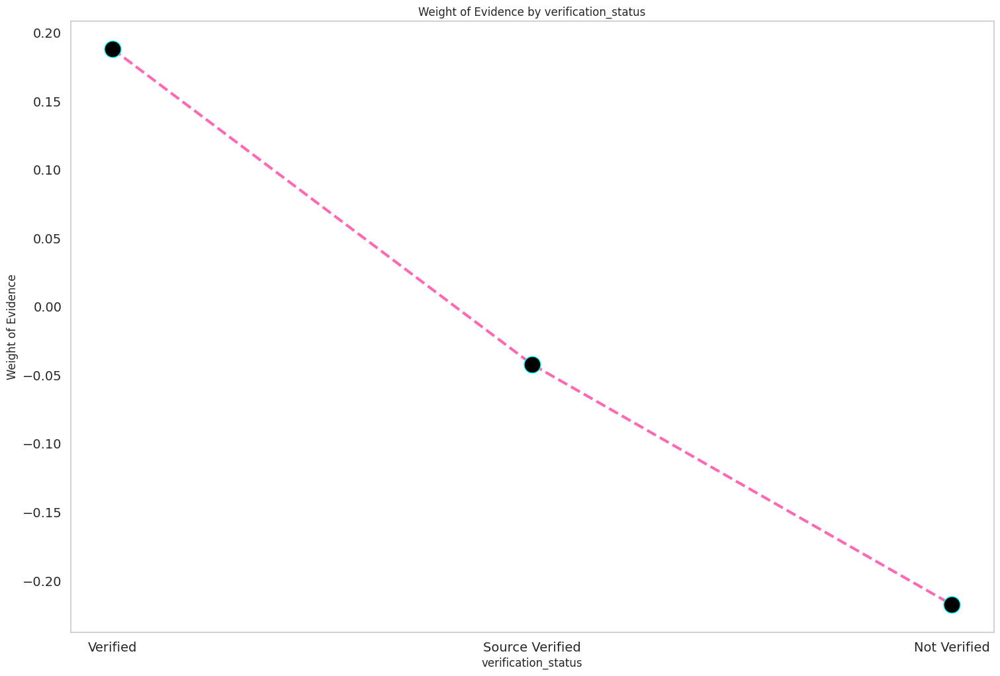

In [ ]:
veri_df = woe_categorical(X, 'verification_status', y)
plot_by_woe(veri_df)

The WoE decreases from Verified to Not Verified, indicating a clear monotonic trend: the less verified the applicant is, the higher the default risk.

### **4. Analyzing Purpose variable**

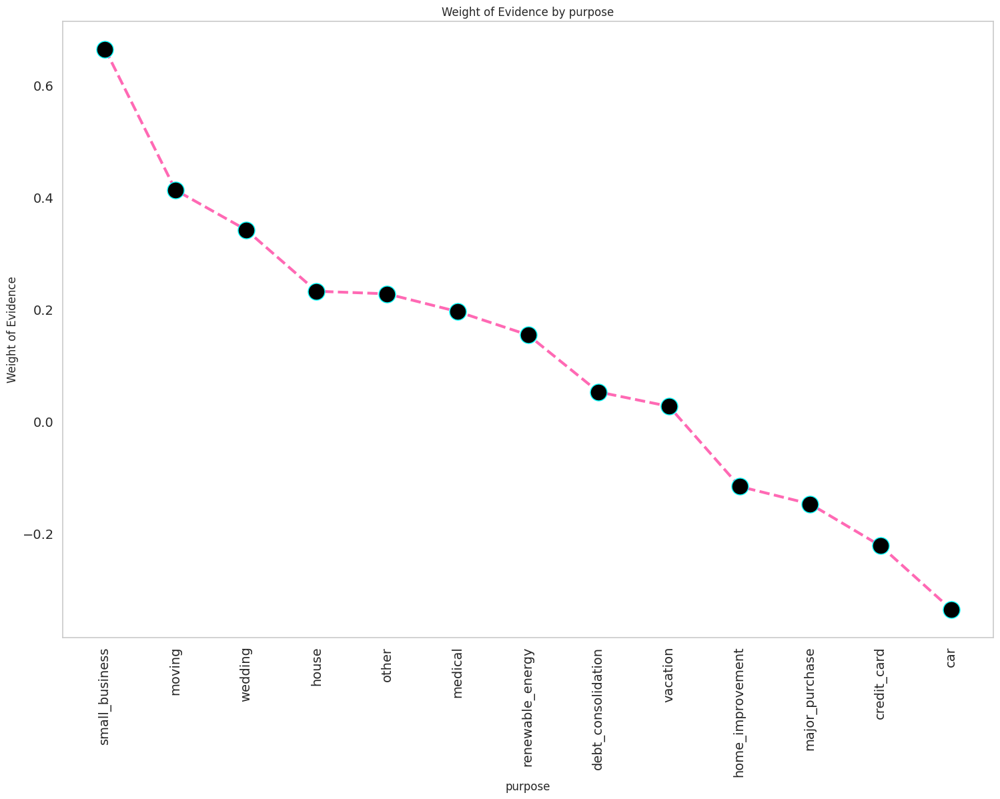

In [ ]:
pur_df = woe_categorical(X, 'purpose', y)
plot_by_woe(pur_df, 90)

WoE values show that loan purpose has a strong impact on the probability of default.

Loans for "small_business", "moving", and "wedding" are associated with lower risk, while "car", "credit_card", and "major_purchase" purposes carry higher risk.

Group 1: Very High WoE
- small_business

Group 2: High WoE
- moving
- wedding
- house

Group 3: Moderate WoE
- other
- medical
- renewable_energy

Group 4: Slightly Positive WoE
- debt_consolidation
- vacation

Group 5: Slightly Negative WoE
- home_improvement
- major_purchase
- credit_card

Group 6: Very Low WoE
- car

### **5. Analyzing address-state variable**

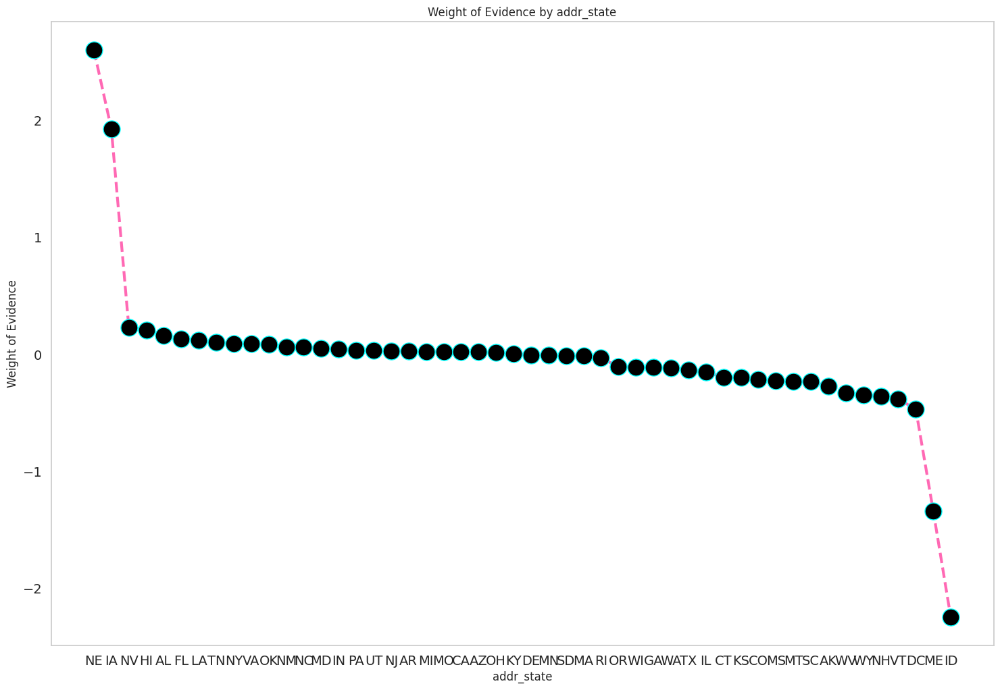

In [ ]:
addr_df = woe_categorical(X, 'addr_state', y)
plot_by_woe(addr_df)

- States like NE, IA, ME, ID show extreme WoE values — likely due to low sample sizes, which causes WoE to swing drastically.

- These extremes can skew the model or lead to overfitting.

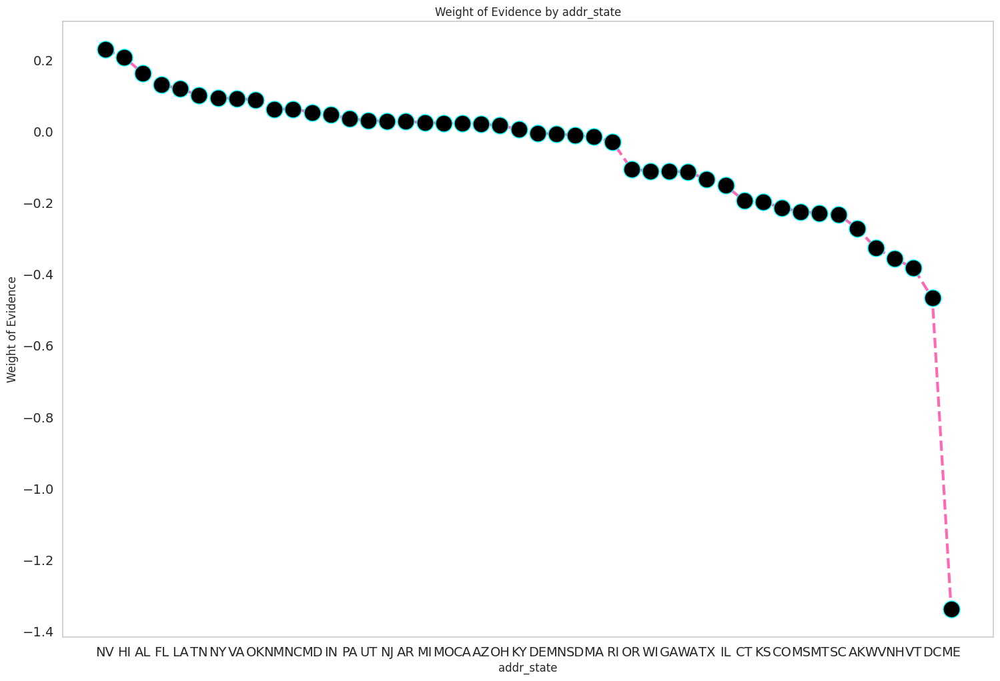

In [ ]:
data1 =addr_df.iloc[2:44, :]
data2 =addr_df.iloc[45:49, :]
low_data_woe = pd.concat([data1, data2], axis=0)
plot_by_woe(low_data_woe)

In deciding which categories to combine we use both WOE and the number of observations in our analysis.
- Categories with similar WoE but significantly different observations will not be combined together, because the number of observations can influence the WoE values.
- Also, categories with both similar WoE and observations greater than 5% can be combined together to form a new category. This process will be used for the rest of analysis.The categories to be combined as follows:

    - Group 0: Extreme outliers (1-3 observations)  
    ['NE', 'ME', 'ID'],  
    - Group 1: Ultra-high risk (WOE < -0.35)  
    ['DC', 'VT', 'NH', 'WY'],  
    - Group 2: Very high risk (-0.35 ≤ WOE < -0.25)  
    ['WV', 'AK'],  
    - Group 3: High risk (-0.25 ≤ WOE < -0.20)  
    ['SC', 'MT', 'MS'],  
    - Group 4: Medium-high risk (-0.20 ≤ WOE < -0.15)  
    ['CO', 'KS', 'CT'],  
    - Group 5: Elevated risk (-0.15 ≤ WOE < -0.10)  
    ['IL', 'TX'],  
    - Group 6: Above-average risk (-0.10 ≤ WOE < -0.05)  
    ['WA', 'GA', 'WI', 'OR'],  
    - Group 7: Average risk (-0.05 ≤ WOE < 0.05)   
    ['RI', 'MA', 'SD', 'MN', 'DE', 'KY', 'OH'],  
    - Group 8: Below-average risk (0.05 ≤ WOE < 0.10)  
    ['AZ', 'CA', 'MI', 'MO', 'AR'],  
    - Group 9: Low risk (0.10 ≤ WOE < 0.15)  
    ['NJ', 'PA', 'IN', 'MD', 'NC', 'NM'],  
    - Group 10: Very low risk (0.15 ≤ WOE < 0.20)  
    ['OK', 'VA', 'NY', 'TN', 'LA'],  
    - Group 11: Ultra-low risk (WOE ≥ 0.20)  
    ['FL', 'AL', 'HI', 'NV'],  
    - Group 12: Special case  
    ['IA']
]

In total we will have to create 13 categories for the addr_variable. We will create these variables later. Let us move on to analyze the rest of the features.

### **6. Analyzing initial list status variable**

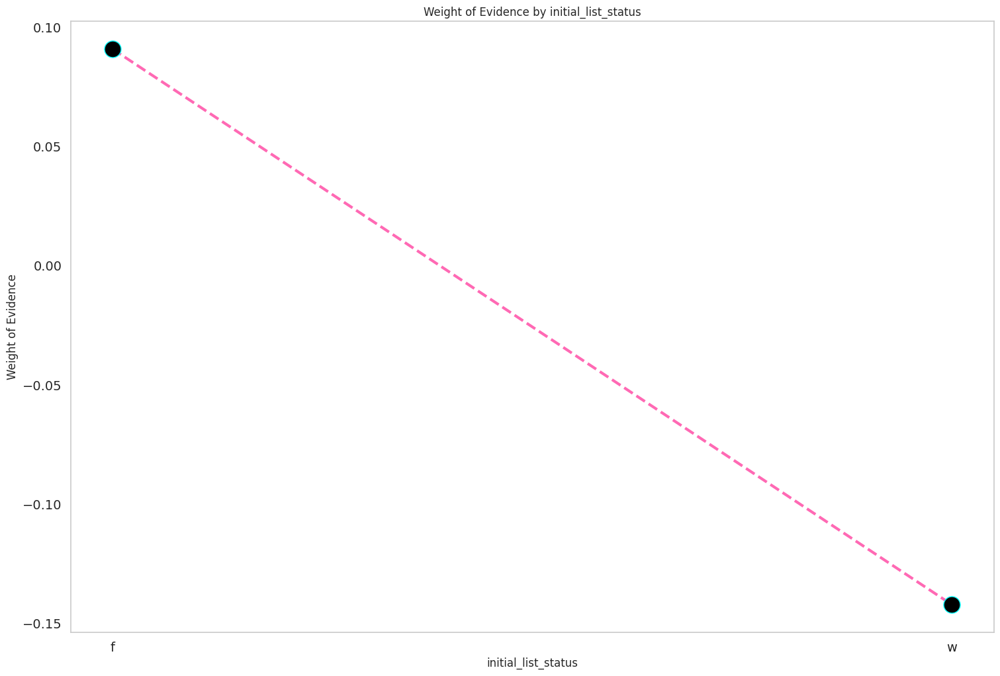

In [ ]:
init_list_df = woe_categorical( X, 'initial_list_status', y)
plot_by_woe(init_list_df)

- f has positive WoE (~+0.09), meaning loans initially listed as f are slightly more likely to be “good” loans.

- w has negative WoE (~−0.14), meaning loans listed as w are slightly more likely to be “bad” loans.

This variable has significantly different WoE values and categories should be kept as seperate variables

## Continous Variables by Plotting WoE

In [ ]:
# function to calculate WoE for continous variables
def woe_continous(df, cat_feature, good_bad_df):
    df = pd.concat([df[cat_feature], good_bad_df], axis=1)
    df = pd.concat([df.groupby(df.columns.values[0], as_index = False)[df.columns.values[1]].count(),
                    df.groupby(df.columns.values[0], as_index = False)[df.columns.values[1]].mean()], axis = 1)
    df = df.iloc[:, [0, 1, 3]]
    df.columns = [df.columns.values[0], 'n_obs', 'prop_good']
    df['prop_n_obs'] = df['n_obs'] / df['n_obs'].sum()
    df['n_good'] = df['prop_good'] * df['n_obs']
    df['n_bad'] = (1 - df['prop_good']) * df['n_obs']
    df['prop_n_good'] = df['n_good'] / df['n_good'].sum()
    df['prop_n_bad'] = df['n_bad'] / df['n_bad'].sum()
    df['WoE'] = np.log(df['prop_n_good'] / df['prop_n_bad'])
    df['diff_prop_good'] = df['prop_good'].diff().abs()
    df['diff_WoE'] = df['WoE'].diff().abs()
    df['IV'] = (df['prop_n_good'] - df['prop_n_bad']) * df['WoE']
    df['IV'] = df['IV'].sum()
    return df

In [ ]:
# check for numerical features
num_features = X.select_dtypes(include=['number']).columns.tolist()
print("Numerical features:", num_features)

Numerical features: ['term', 'int_rate', 'annual_inc', 'dti', 'inq_last_6mths', 'out_prncp', 'total_pymnt', 'total_rec_int', 'tot_cur_bal', 'total_rev_hi_lim', 'mths_since_last_credit_pull_d']


### **1. Analyzing term variable**

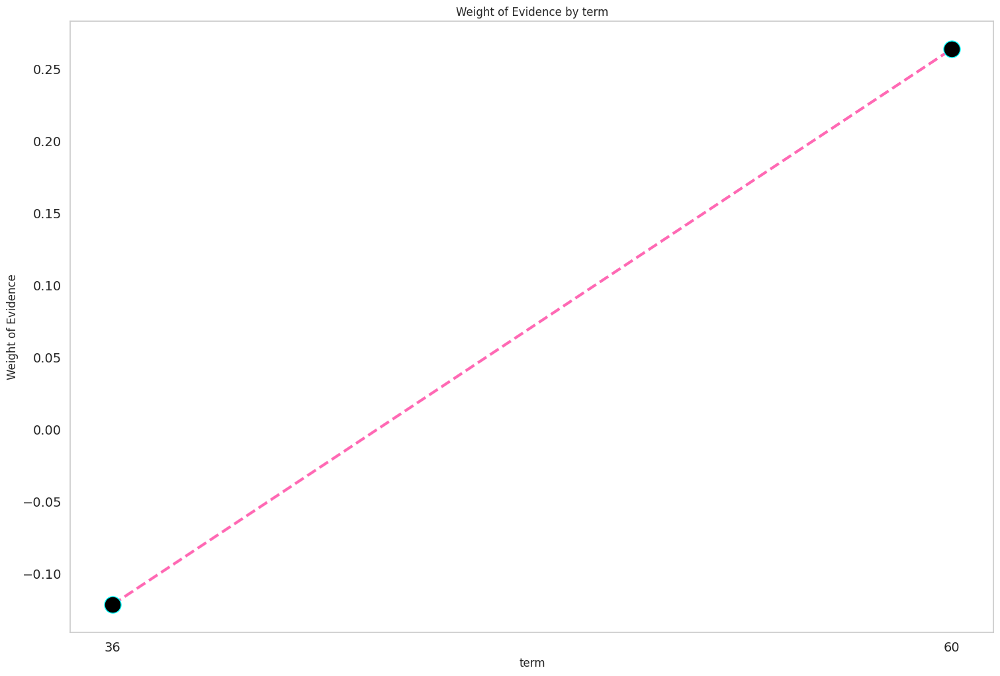

In [ ]:
plot_by_woe(woe_continous(X,'term', y ))

### **2. Analyzing interest rate variable**

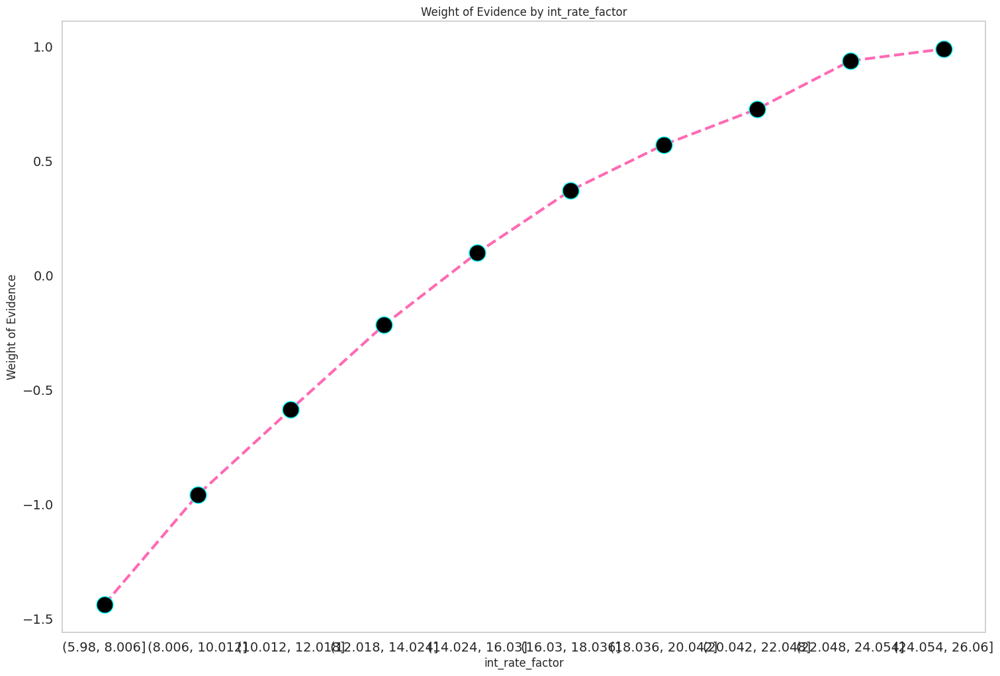

In [ ]:
X['int_rate_factor'] = pd.cut(X['int_rate'], 10)
int_rate_df = woe_continous(X, 'int_rate_factor',y)
plot_by_woe(int_rate_df)

From the graph above only the last two categories will be combined.

(22.048, 26)

### **3. Analyzing toal revolving_high_limit variable**

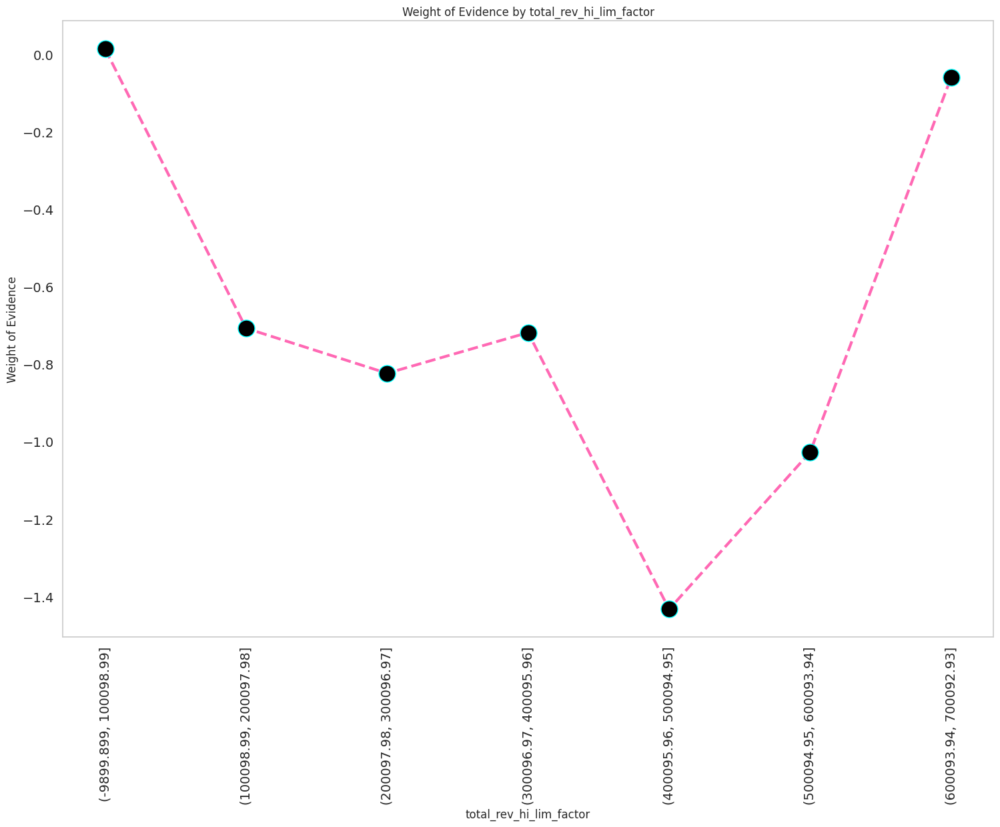

In [ ]:
X['total_rev_hi_lim_factor'] = pd.cut(X['total_rev_hi_lim'], 100)
revol_hi_df = woe_continous(X, 'total_rev_hi_lim_factor', y)
plot_by_woe(revol_hi_df, 90)

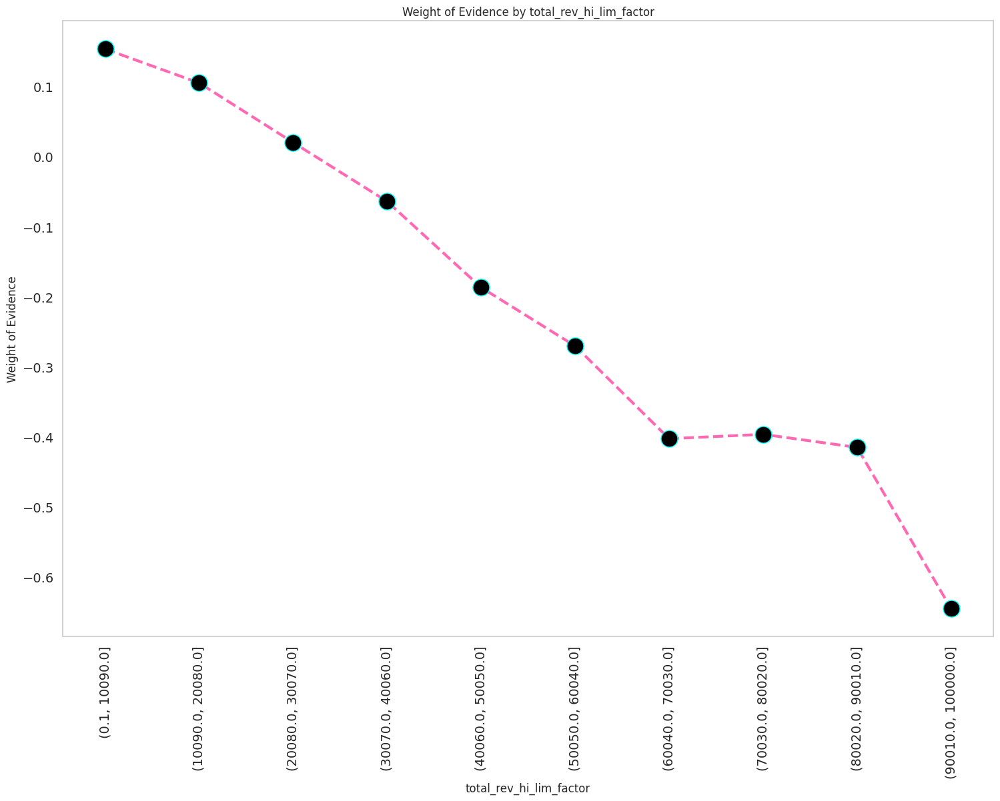

In [ ]:
#analyzing below 100000
X_train_prepr_temp = X[X['total_rev_hi_lim'] <= 100000].copy()
# fine-classing
X_train_prepr_temp['total_rev_hi_lim_factor'] = pd.cut(X_train_prepr_temp['total_rev_hi_lim'],10)
# select only the relevant index in the target col
df_temp = woe_continous(X_train_prepr_temp, 'total_rev_hi_lim_factor', y[X_train_prepr_temp.index])
plot_by_woe(df_temp, 90)

combine (60050,70030) and (70030, 80020) and (80020, 90010)

### **4. Analyzing dti variable**

"dti" is a ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.

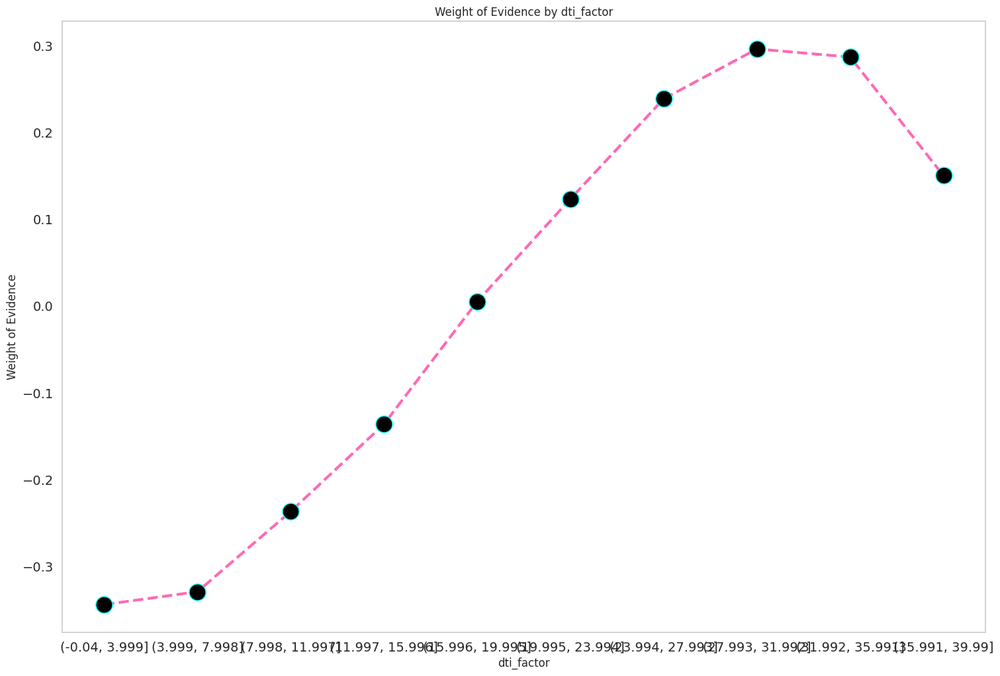

In [ ]:
X['dti_factor'] = pd.cut(X['dti'], 10)
dti_df = woe_continous(X, 'dti_factor', y)
plot_by_woe(dti_df)

The following categories will be combined:

(27.993, 31.992), (31.992, 35.991)  
(-0.04,399) ,(3.999,7998)

### **5. Analyzing annual_income variable**

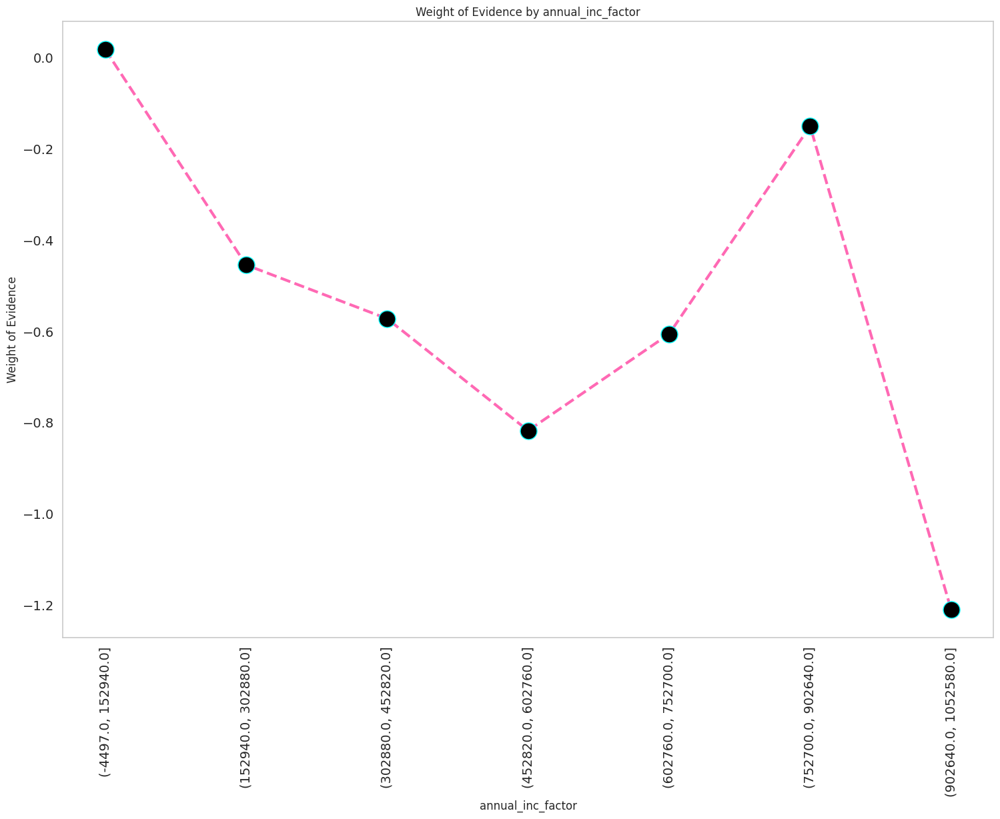

In [ ]:
X['annual_inc_factor'] = pd.cut(X['annual_inc'], 50)
ann_inc_df = woe_continous(X, 'annual_inc_factor', y)
plot_by_woe(ann_inc_df, 90)

We will seperate this variable into people with higher and lower incomes. From the WoE table, we observe, when annual income increases, the the number of observations decreases. This is because only a few people earn high income. We will use a new variable for people with income above 150000 dollars. And also, analyze individuals with income below 150000 dollars.

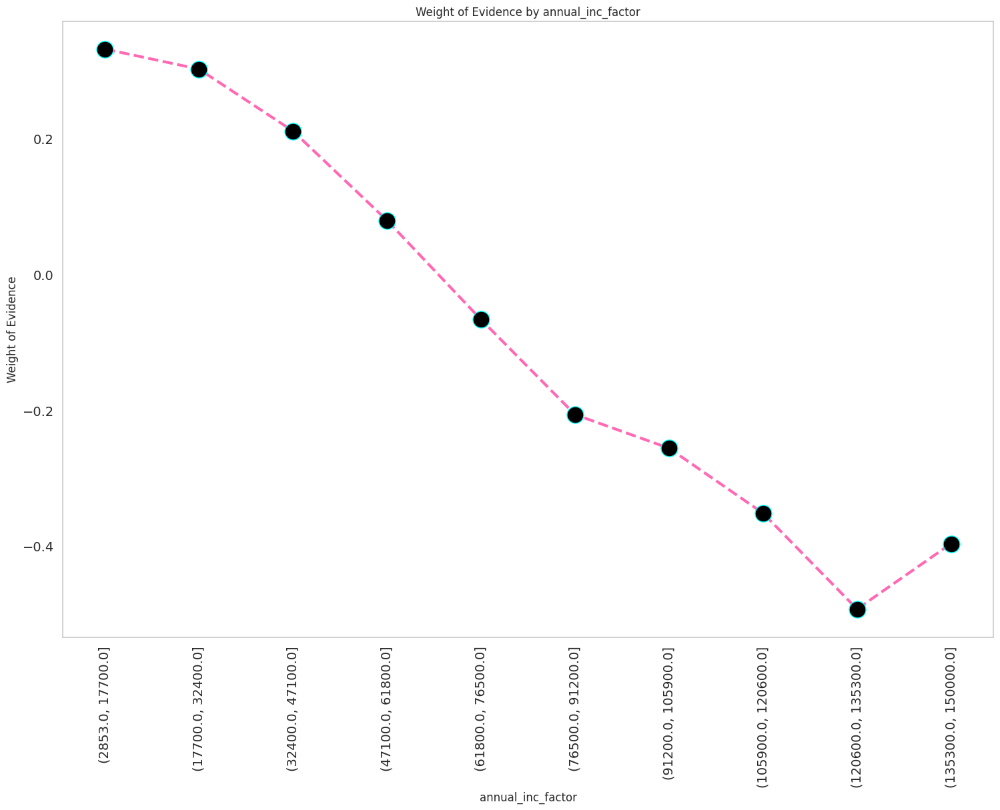

In [ ]:
#Analyzing income  below 150000
X_train_prepr_temp = X[X['annual_inc'] <= 150000].copy()
# fine-classing
X_train_prepr_temp['annual_inc_factor'] = pd.cut(X_train_prepr_temp['annual_inc'], 10)
# select only the relevant index in the target col
df_temp = woe_continous(X_train_prepr_temp, 'annual_inc_factor', y[X_train_prepr_temp.index])
plot_by_woe(df_temp, 90)

From the graph, we will combine the follwing categories based on WoE and number of observations as follows:
- (<=32000),
- (>32000 <= 50000),
- (>50000 <= 60000),
- (>60000 <=75000),
- (>75000 <=11000),
- (>110000 <=120000),
- (>120000 <=135000),
- (>135000 <=150000),
- (>150000)

### **6. Analyzing inq_last_6mths variable**

inq_last_6mths denote the number of inquiries in last 6 months

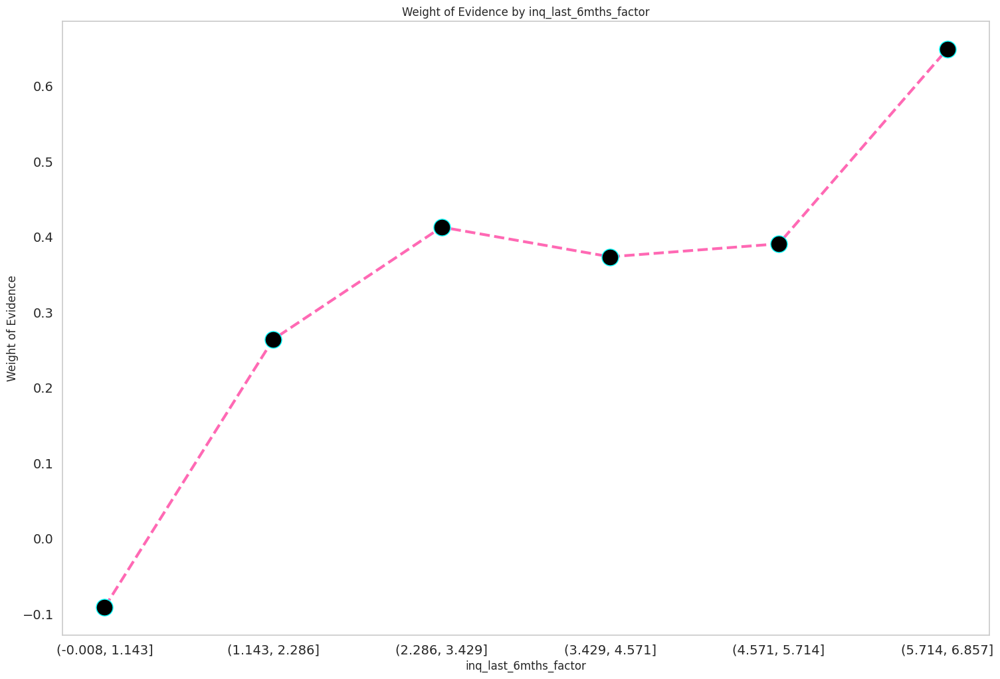

In [ ]:
X['inq_last_6mths_factor'] = pd.cut(X['inq_last_6mths'], 7)
inq_fact_df = woe_continous(X, 'inq_last_6mths_factor', y)
plot_by_woe(inq_fact_df)

The follwing categories will be created

- <1 months,
- 1-2,
- 2-3,
- 3-5
- 5-7

### **7. Analyzing total current balance variable**

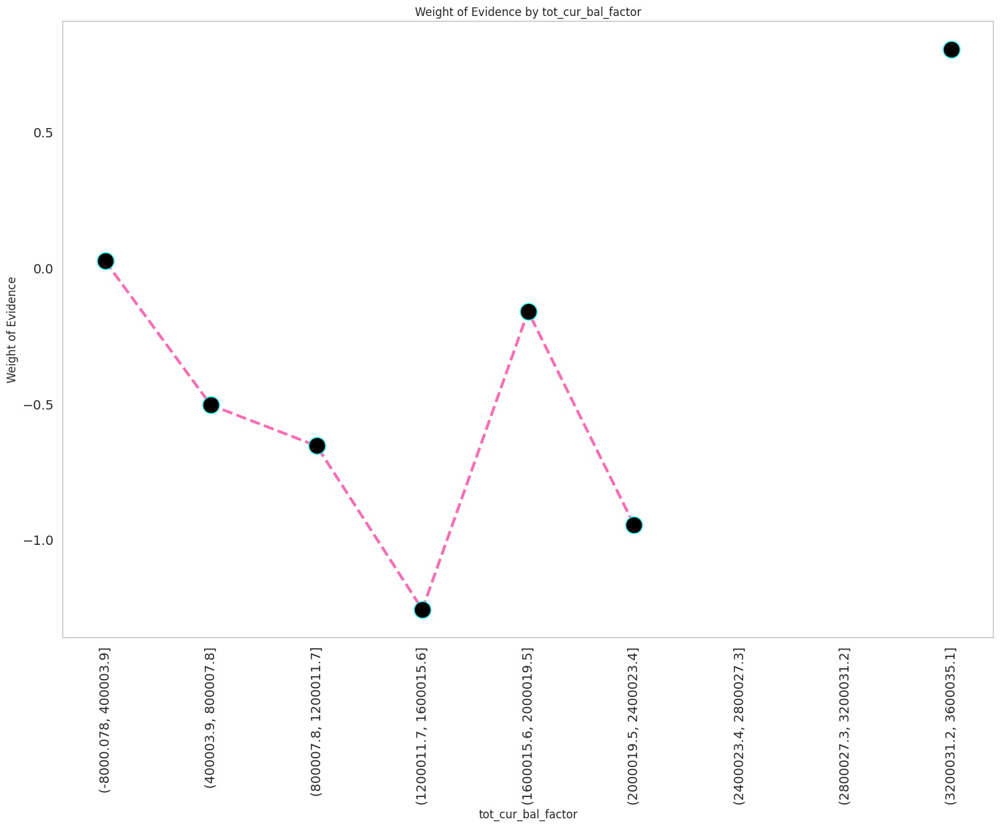

In [ ]:
X['tot_cur_bal_factor'] = pd.cut(X['tot_cur_bal'], 20)
curr_bal_df = woe_continous(X, 'tot_cur_bal_factor', y)
plot_by_woe(curr_bal_df, 90)

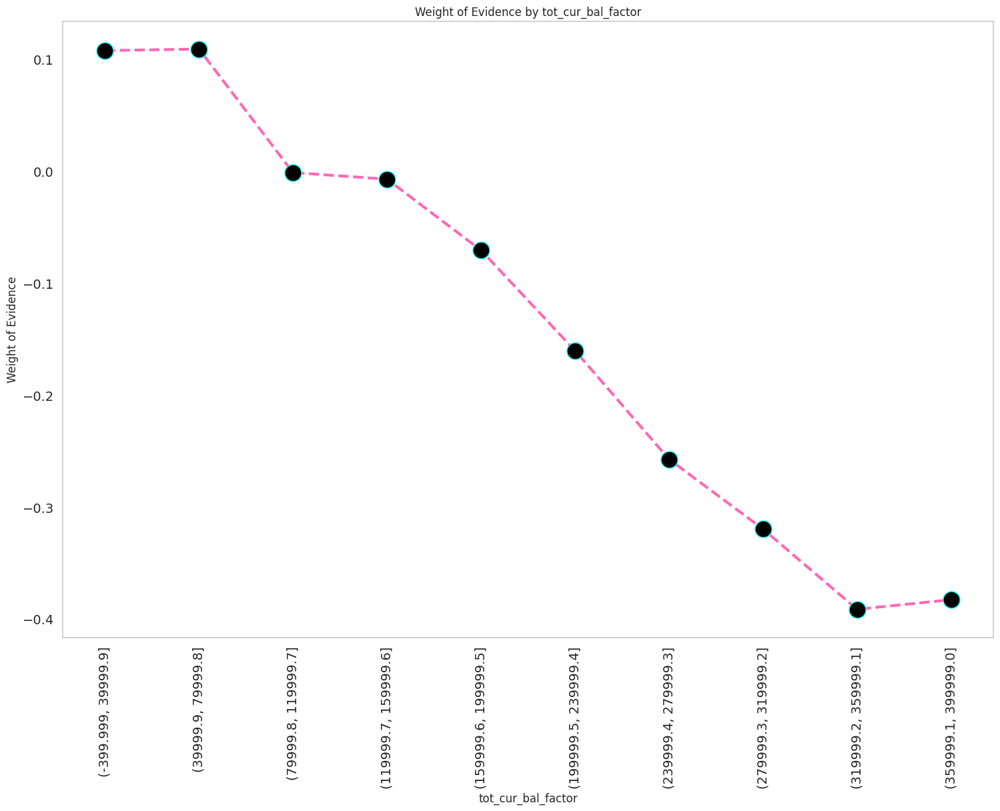

In [ ]:
#Analyzing current balance  below 400000
X_train_prepr_temp = X[X['tot_cur_bal'] <= 400000].copy()
# fine-classing
X_train_prepr_temp['tot_cur_bal_factor'] = pd.cut(X_train_prepr_temp['tot_cur_bal'], 10)
# select only the relevant index in the target column
df_temp = woe_continous(X_train_prepr_temp, 'tot_cur_bal_factor', y[X_train_prepr_temp.index])
plot_by_woe(df_temp, 90)

the following variables will be created:
- <40000,
- 40000-80000,
- 80000-120000,
- 120000-160000,
- 160000-200000,
- 200000-240000,
- 240000-320000,
- 320000-400000

### **8. Analyzing months since credit pulled variable**

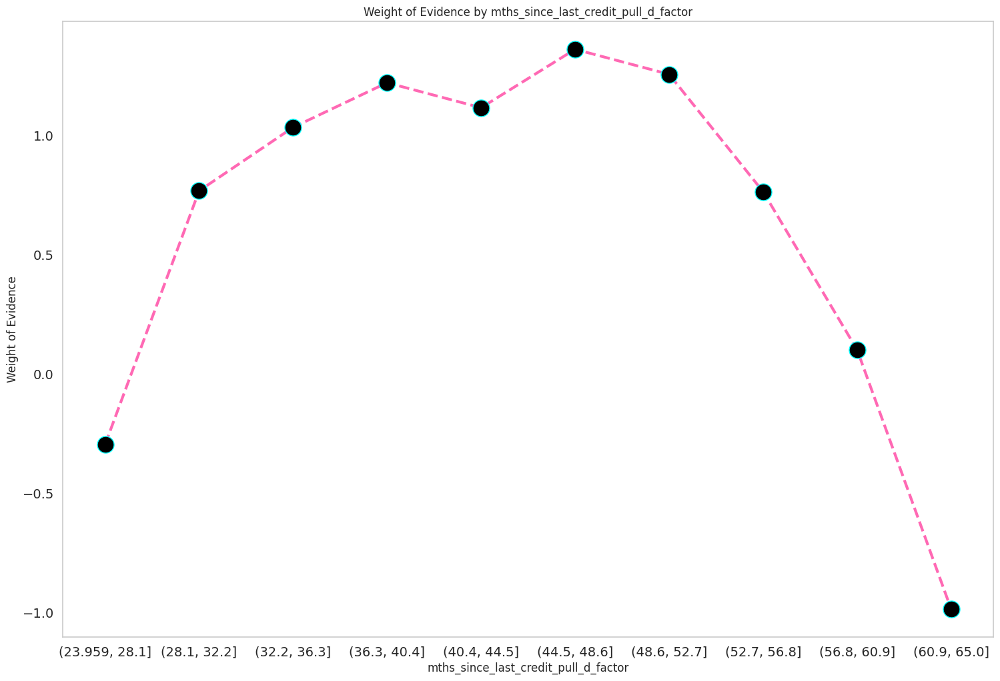

In [ ]:
X['mths_since_last_credit_pull_d_factor'] = pd.cut(X['mths_since_last_credit_pull_d'], 10)
mths_cr_pull_df = woe_continous(X, 'mths_since_last_credit_pull_d_factor', y)
plot_by_woe(mths_cr_pull_df)

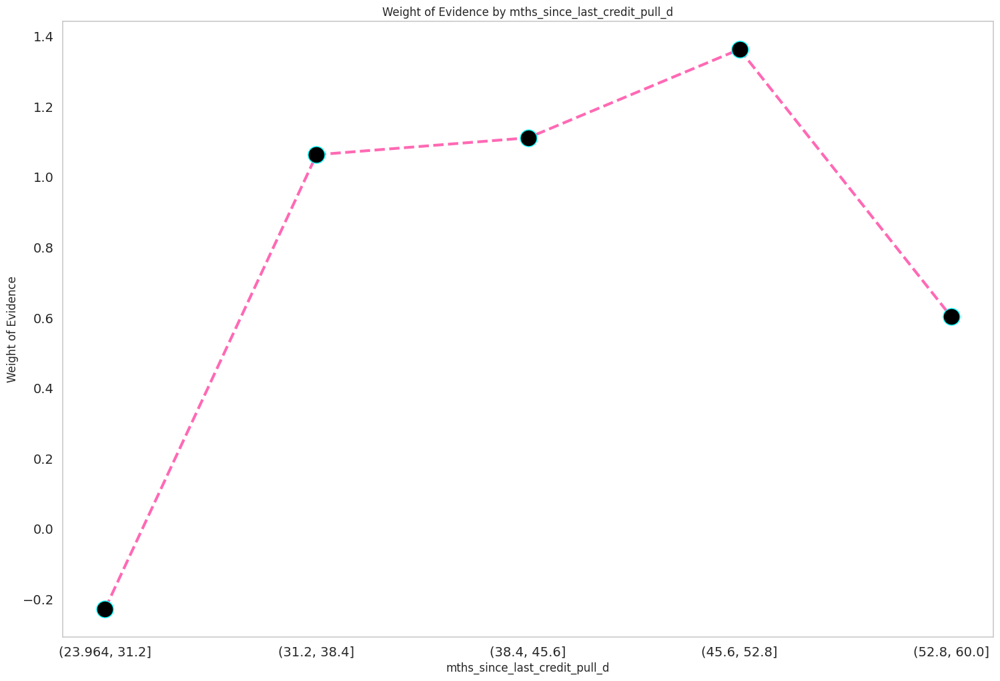

In [ ]:
#Analyzing mths_since_credit_pull  below 60
X_train_prepr_temp = X[X['mths_since_last_credit_pull_d'] <= 60].copy()
# fine-classing
X_train_prepr_temp['mths_since_last_credit_pull_d'] = pd.cut(X_train_prepr_temp['mths_since_last_credit_pull_d'], 5)
# select only the relevant index in the target column
df_temp = woe_continous(X_train_prepr_temp, 'mths_since_last_credit_pull_d', y[X_train_prepr_temp.index])
plot_by_woe(df_temp)

The following categories will be grouped together:
- 54-65,
- 65-76,
- greater than 76

### **9. Analyzing total_rec_int variable**

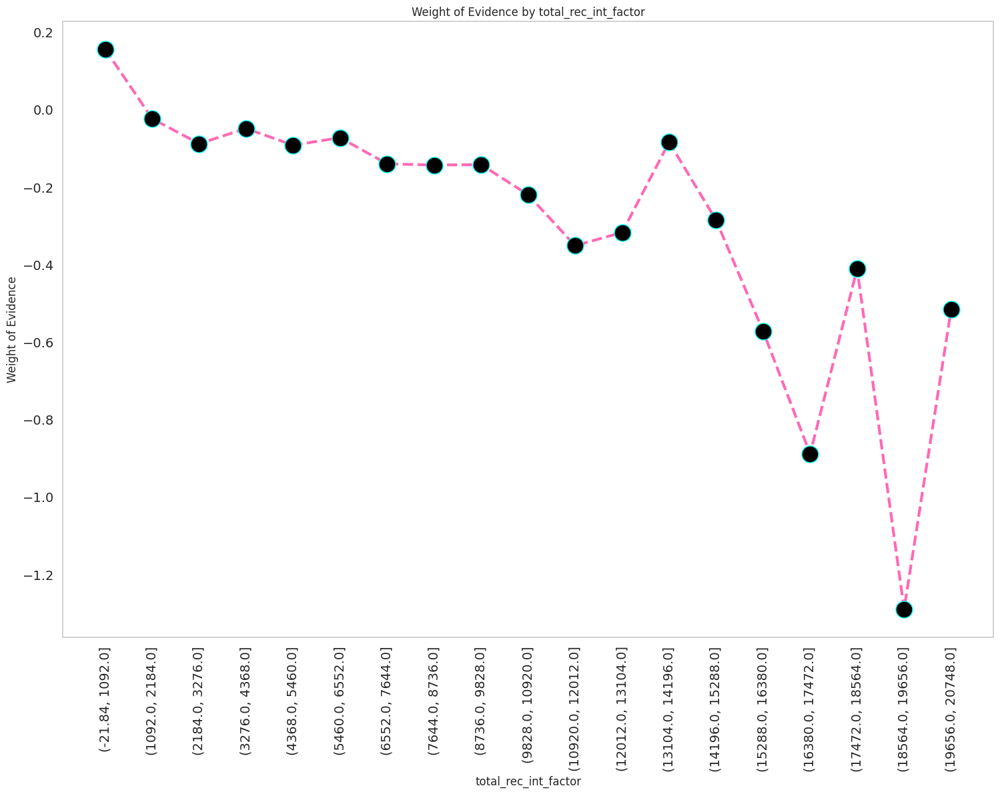

In [ ]:
X['total_rec_int_factor'] = pd.cut(X['total_rec_int'], 20)
rec_int_df = woe_continous(X, 'total_rec_int_factor', y)
plot_by_woe(rec_int_df, 90)

### **10. Analyzing total_payment variable**

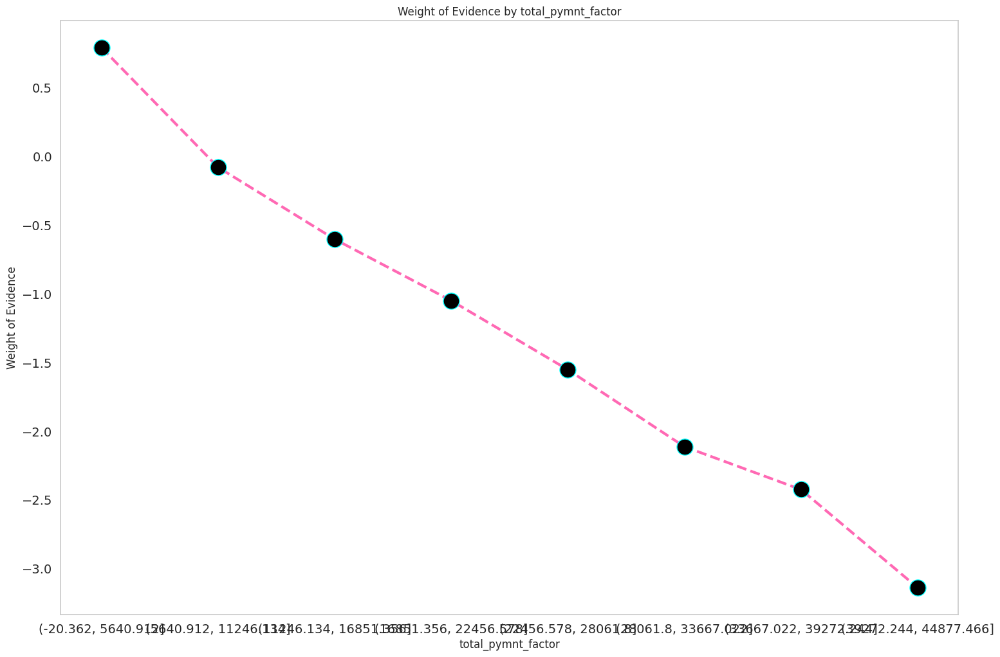

In [ ]:
X['total_pymnt_factor'] = pd.cut(X['total_pymnt'], 10)
total_pym_df = woe_continous(X, 'total_pymnt_factor', y)
plot_by_woe(total_pym_df)

### **11. Analyzing out_prncp_factor variable**

"out_prncp_factor" denotes remaining outstanding principal for total amount funded

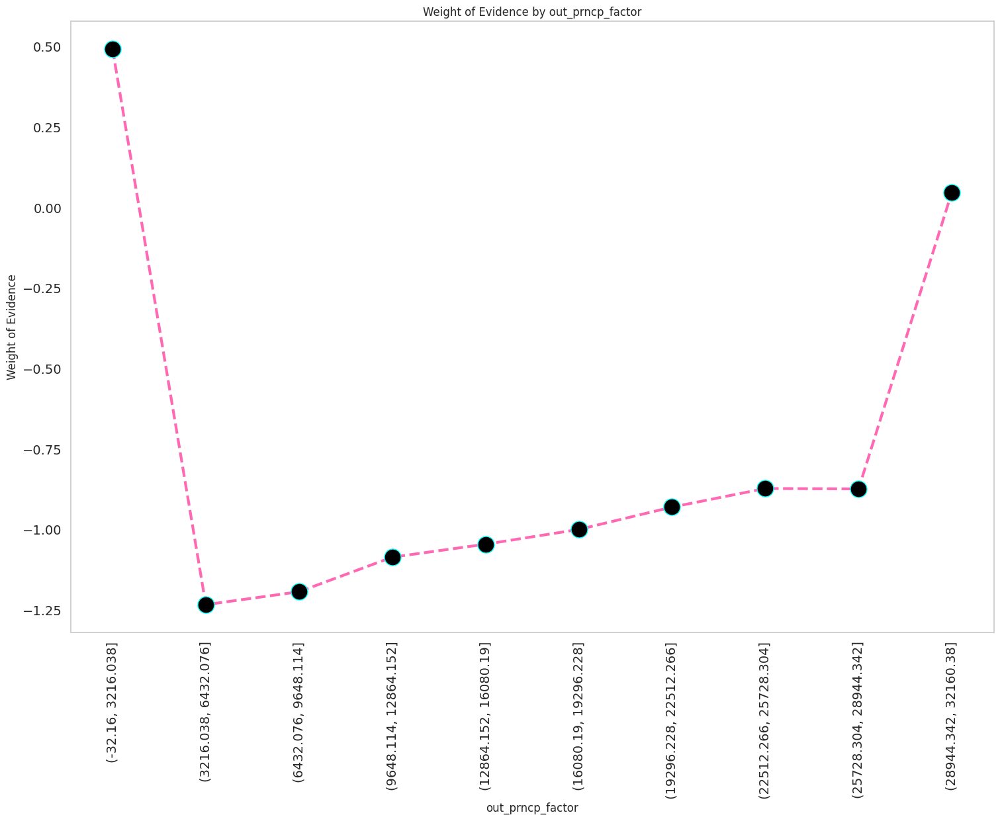

In [ ]:
X['out_prncp_factor'] = pd.cut(X['out_prncp'], 10)
out_df = woe_continous(X, 'out_prncp_factor', y)
plot_by_woe(out_df, 90)

# 5. Feature Engineering (Creating New Features Based on WoE)

In [ ]:
# grade
new_df = preprocess_data.loc[:, 'grade:A':'grade:G']

# home_ownership
# Combine OTHER, NONE with RENT (high risk of default)
new_df['home_ownership:OWN'] = preprocess_data.loc[:, 'home_ownership:OWN']
new_df['home_ownership:OTHER'] = preprocess_data.loc[:, 'home_ownership:OTHER']
new_df['home_ownership:RENT']  = preprocess_data.loc[:, 'home_ownership:RENT']
new_df['home_ownership:MORTGAGE'] = preprocess_data.loc[:, 'home_ownership:MORTGAGE']

# verification status
new_df['verification_status:NOT_VERIFIED'] = preprocess_data.loc[:, 'verification_status:Not Verified']
new_df['verification_status:SOURCE_VERIFIED'] = preprocess_data.loc[:, 'verification_status:Source Verified']
new_df['verification_status:VERIFIED'] = preprocess_data.loc[:, 'verification_status:Verified']

# purpose of loan
# Group 1: Very High WoE
new_df['purpose:SMALL_BUSINESS'] = preprocess_data['purpose:small_business']
# Group 2: High WoE
new_df['purpose:MOVING_WEDDING_HOUSE'] = sum([preprocess_data['purpose:moving'],
                                              preprocess_data['purpose:wedding'],
                                              preprocess_data['purpose:house']])
# Group 3: Moderate WoE
new_df['purpose:OTHER_MEDICAL_RENEWABLE_ENERGY'] = sum([preprocess_data['purpose:other'],
                                                        preprocess_data['purpose:medical'],
                                                        preprocess_data['purpose:renewable_energy']])
# Group 4: Slightly Positive WoE
new_df['purpose:DEBT_CONSOLIDATION_VACATION'] = sum([preprocess_data['purpose:debt_consolidation'],
                                                     preprocess_data['purpose:vacation']])
# Group 5: Slightly Negative WoE
new_df['purpose:HOME_IMPROVEMENT_MAJOR_PURCHASE_CREDIT_CARD'] = sum([preprocess_data['purpose:home_improvement'],
                                                                     preprocess_data['purpose:major_purchase'],
                                                                     preprocess_data['purpose:credit_card']])
# Group 6: Very Low WoE
new_df['purpose:CAR'] = preprocess_data['purpose:car']

# addr state
# Group 0: Extreme outliers (not included since they have 1-3 observations)
# Group 1: Ultra-high risk (WOE < -0.35)
new_df['addr_state:DC_VT_NH_WY'] = sum([preprocess_data['addr_state:DC'], preprocess_data['addr_state:VT'],
                                        preprocess_data['addr_state:NH'], preprocess_data['addr_state:WY']])
# Group 2: Very high risk (-0.35 ≤ WOE < -0.25)
new_df['addr_state:WV_AK'] = sum([preprocess_data['addr_state:WV'], preprocess_data['addr_state:AK']])
# Group 3: High risk (-0.25 ≤ WOE < -0.20)
new_df['addr_state:SC_MT_MS'] = sum([preprocess_data['addr_state:SC'], preprocess_data['addr_state:MT']])
# Group 4: Medium-high risk (-0.20 ≤ WOE < -0.15)
new_df['addr_state:CO_KS_CT'] = sum([preprocess_data['addr_state:CO'], preprocess_data['addr_state:KS'],
                                     preprocess_data['addr_state:CT']])
# Group 5: Elevated risk (-0.15 ≤ WOE < -0.10)
new_df['addr_state:IL_TX'] = sum([preprocess_data['addr_state:IL'], preprocess_data['addr_state:TX']])
# Group 6: Above-average risk (-0.10 ≤ WOE < -0.05)
new_df['addr_state:WA_GA_WI_OR'] = sum([preprocess_data['addr_state:WA'], preprocess_data['addr_state:GA'],
                                        preprocess_data['addr_state:WI'], preprocess_data['addr_state:OR']])
# Group 7: Average risk (-0.05 ≤ WOE < 0.05)
new_df['addr_state:RI_MA_SD_MN_DE_KY_OH'] = sum([preprocess_data['addr_state:RI'], preprocess_data['addr_state:MA'],
                                                 preprocess_data['addr_state:SD'], preprocess_data['addr_state:MN'],
                                                 preprocess_data['addr_state:DE'], preprocess_data['addr_state:KY'],
                                                 preprocess_data['addr_state:OH']])
# Group 8: Below-average risk (0.05 ≤ WOE < 0.10)
new_df['addr_state:AZ_CA_MI_MO_AR'] = sum([preprocess_data['addr_state:AZ'], preprocess_data['addr_state:CA'],
                                           preprocess_data['addr_state:MI'], preprocess_data['addr_state:MO'],
                                           preprocess_data['addr_state:AR']])
# Group 9: Low risk (0.10 ≤ WOE < 0.15)
new_df['addr_state:NJ_PA_IN_MD_NC_NM'] = sum([preprocess_data['addr_state:NJ'], preprocess_data['addr_state:PA'],
                                              preprocess_data['addr_state:IN'], preprocess_data['addr_state:MD'],
                                              preprocess_data['addr_state:NC'], preprocess_data['addr_state:NM']])
# Group 10: Very low risk (0.15 ≤ WOE < 0.20)
new_df['addr_state:OK_VA_NY_TN_LA'] = sum([preprocess_data['addr_state:OK'], preprocess_data['addr_state:VA'],
                                           preprocess_data['addr_state:NY'], preprocess_data['addr_state:TN'],
                                           preprocess_data['addr_state:LA']])
# Group 11: Ultra-low risk (WOE ≥ 0.20)
new_df['addr_state:FL_AL_HI_NV'] = sum([preprocess_data['addr_state:FL'], preprocess_data['addr_state:AL'],
                                        preprocess_data['addr_state:HI'], preprocess_data['addr_state:NV']])
# Group 12: Special case
new_df['addr_state:IA'] = preprocess_data.loc[:, 'addr_state:IA']

# initial_list_status
new_df['initial_list_status:F'] = preprocess_data.loc[:, 'initial_list_status:f']
new_df['initial_list_status:W'] = preprocess_data.loc[:, 'initial_list_status:w']

# term
new_df['term:36'] = np.where((preprocess_data['term'] == 36), 1, 0)
new_df['term:60'] = np.where((preprocess_data['term'] == 60), 1, 0)

# total_rec_int
new_df['total_rec_int:<1000'] = np.where((preprocess_data['total_rec_int'] <= 1000), 1, 0)
new_df['total_rec_int:1000-2000'] = np.where((preprocess_data['total_rec_int'] > 1000) & (preprocess_data['total_rec_int'] <= 2000), 1, 0)
new_df['total_rec_int:2000-9000'] = np.where((preprocess_data['total_rec_int'] > 2000) & (preprocess_data['total_rec_int'] <= 9000), 1, 0)
new_df['total_rec_int:>9000'] = np.where((preprocess_data['total_rec_int'] > 9000), 1, 0)

# total_rev_hi_lim
new_df['total_rev_hi_lim:<10000'] = np.where((preprocess_data['total_rev_hi_lim'] <= 10000), 1, 0)
new_df['total_rev_hi_lim:10000-20000'] = np.where((preprocess_data['total_rev_hi_lim'] > 10000) & (preprocess_data['total_rev_hi_lim'] <= 20000), 1, 0)
new_df['total_rev_hi_lim:20000-40000'] = np.where((preprocess_data['total_rev_hi_lim'] > 20000) & (preprocess_data['total_rev_hi_lim'] <= 40000), 1, 0)
new_df['total_rev_hi_lim:40000-60000'] = np.where((preprocess_data['total_rev_hi_lim'] > 40000) & (preprocess_data['total_rev_hi_lim'] <= 60000), 1, 0)
new_df['total_rev_hi_lim:60000-80000'] = np.where((preprocess_data['total_rev_hi_lim'] > 60000) & (preprocess_data['total_rev_hi_lim'] <= 80000), 1, 0)
new_df['total_rev_hi_lim:80000-100000'] = np.where((preprocess_data['total_rev_hi_lim'] > 80000) & (preprocess_data['total_rev_hi_lim'] <= 100000), 1, 0)
new_df['total_rev_hi_lim:>100000'] = np.where((preprocess_data['total_rev_hi_lim'] > 100000), 1, 0)

# total_pymnt
new_df['total_pymnt:<5000'] = np.where((preprocess_data['total_pymnt'] <= 5000), 1, 0)
new_df['total_pymnt:5000-11000'] = np.where((preprocess_data['total_pymnt'] > 5000) & (preprocess_data['total_pymnt'] <= 11000), 1, 0)
new_df['total_pymnt:11000-16000'] = np.where((preprocess_data['total_pymnt'] > 11000) & (preprocess_data['total_pymnt'] <= 16000), 1, 0)
new_df['total_pymnt:16000-22000'] = np.where((preprocess_data['total_pymnt'] > 16000) & (preprocess_data['total_pymnt'] <= 22000), 1, 0)
new_df['total_pymnt:>22000'] = np.where((preprocess_data['total_pymnt'] <= 5000), 1, 0)

# int_rate
# Combine (22.048, 26)
new_df['int_rate:<7.484'] = np.where((preprocess_data['int_rate'] <= 7.484), 1, 0)
new_df['int_rate:7.484-9.548'] = np.where((preprocess_data['int_rate'] > 7.484) & (preprocess_data['int_rate'] <= 9.548), 1, 0)
new_df['int_rate:9.548-11.612'] = np.where((preprocess_data['int_rate'] > 9.548) & (preprocess_data['int_rate'] <= 11.612), 1, 0)
new_df['int_rate:11.612-13.676'] = np.where((preprocess_data['int_rate'] > 11.612) & (preprocess_data['int_rate'] <= 13.676), 1, 0)
new_df['int_rate:13.676-15.74'] = np.where((preprocess_data['int_rate'] > 13.676) & (preprocess_data['int_rate'] <= 15.74), 1, 0)
new_df['int_rate:15.74-17.804'] = np.where((preprocess_data['int_rate'] > 15.74) & (preprocess_data['int_rate'] <= 17.804), 1, 0)
new_df['int_rate:17.804-19.868'] = np.where((preprocess_data['int_rate'] > 17.804) & (preprocess_data['int_rate'] <= 19.868), 1, 0)
new_df['int_rate:19.868-21.932'] = np.where((preprocess_data['int_rate'] > 19.868) & (preprocess_data['int_rate'] <= 21.932), 1, 0)
new_df['int_rate:21.932-26'] = np.where((preprocess_data['int_rate'] > 21.932) & (preprocess_data['int_rate'] <= 26), 1, 0)

# dti
new_df['dti:<4'] = np.where((preprocess_data['dti'] <= 4), 1, 0)
new_df['dti:4-8'] = np.where((preprocess_data['dti'] > 4) & (preprocess_data['dti'] <= 8), 1, 0)
new_df['dti:8-12'] = np.where((preprocess_data['dti'] > 8) & (preprocess_data['dti'] <= 12), 1, 0)
new_df['dti:12-16'] = np.where((preprocess_data['dti'] > 12) & (preprocess_data['dti'] <= 16), 1, 0)
new_df['dti:16-20'] = np.where((preprocess_data['dti'] > 16) & (preprocess_data['dti'] <= 20), 1, 0)
new_df['dti:20-23'] = np.where((preprocess_data['dti'] > 20) & (preprocess_data['dti'] <= 23), 1, 0)
new_df['dti:23-27'] = np.where((preprocess_data['dti'] > 23) & (preprocess_data['dti'] <= 27), 1, 0)
new_df['dti:27-40'] = np.where((preprocess_data['dti'] > 27) & (preprocess_data['dti'] <= 40), 1, 0)

# annual_inc
# Combine (60050, 70030), (70030, 80020), (80020, 90010) into (60050, 90010)
new_df['annual_inc:<=32000'] = np.where((preprocess_data['annual_inc'] <= 32000), 1, 0)
new_df['annual_inc:32000-50000'] = np.where((preprocess_data['annual_inc'] > 32000) & (preprocess_data['annual_inc'] <= 50000), 1, 0)
new_df['annual_inc:50000-60000'] = np.where((preprocess_data['annual_inc'] > 50000) & (preprocess_data['annual_inc'] <= 60000), 1, 0)
new_df['annual_inc:60000-90010'] = np.where((preprocess_data['annual_inc'] > 60000) & (preprocess_data['annual_inc'] <= 90010), 1, 0)
new_df['annual_inc:90010-110000'] = np.where((preprocess_data['annual_inc'] > 90010) & (preprocess_data['annual_inc'] <= 110000), 1, 0)
new_df['annual_inc:110000-120000'] = np.where((preprocess_data['annual_inc'] > 110000) & (preprocess_data['annual_inc'] <= 120000), 1, 0)
new_df['annual_inc:120000-135000'] = np.where((preprocess_data['annual_inc'] > 120000) & (preprocess_data['annual_inc'] <= 135000), 1, 0)
new_df['annual_inc:135000-150000'] = np.where((preprocess_data['annual_inc'] > 135000) & (preprocess_data['annual_inc'] <= 150000), 1, 0)
new_df['annual_inc:>150000'] = np.where((preprocess_data['annual_inc'] > 150000), 1, 0)

# inq_last_6mths
new_df['inq_last_6mths:<1'] = np.where((preprocess_data['inq_last_6mths'] < 1), 1, 0)
new_df['inq_last_6mths:1-2'] = np.where((preprocess_data['inq_last_6mths'] >= 1) & (preprocess_data['inq_last_6mths'] < 2), 1, 0)
new_df['inq_last_6mths:2-3'] = np.where((preprocess_data['inq_last_6mths'] >= 2) & (preprocess_data['inq_last_6mths'] < 3), 1, 0)
new_df['inq_last_6mths:3-5'] = np.where((preprocess_data['inq_last_6mths'] >= 3) & (preprocess_data['inq_last_6mths'] < 5), 1, 0)
new_df['inq_last_6mths:5-7'] = np.where((preprocess_data['inq_last_6mths'] >= 5) & (preprocess_data['inq_last_6mths'] <= 7), 1, 0)

# tot_cur_bal
# Note: (-0.04, 399), (3.999, 7998) seems to be a typo or unrelated to tot_cur_bal; I'll use the specified bins
new_df['tot_cur_bal:<40000'] = np.where((preprocess_data['tot_cur_bal'] < 40000), 1, 0)
new_df['tot_cur_bal:40000-80000'] = np.where((preprocess_data['tot_cur_bal'] >= 40000) & (preprocess_data['tot_cur_bal'] < 80000), 1, 0)
new_df['tot_cur_bal:80000-120000'] = np.where((preprocess_data['tot_cur_bal'] >= 80000) & (preprocess_data['tot_cur_bal'] < 120000), 1, 0)
new_df['tot_cur_bal:120000-160000'] = np.where((preprocess_data['tot_cur_bal'] >= 120000) & (preprocess_data['tot_cur_bal'] < 160000), 1, 0)
new_df['tot_cur_bal:160000-200000'] = np.where((preprocess_data['tot_cur_bal'] >= 160000) & (preprocess_data['tot_cur_bal'] < 200000), 1, 0)
new_df['tot_cur_bal:200000-240000'] = np.where((preprocess_data['tot_cur_bal'] >= 200000) & (preprocess_data['tot_cur_bal'] < 240000), 1, 0)
new_df['tot_cur_bal:240000-320000'] = np.where((preprocess_data['tot_cur_bal'] >= 240000) & (preprocess_data['tot_cur_bal'] < 320000), 1, 0)
new_df['tot_cur_bal:320000-400000'] = np.where((preprocess_data['tot_cur_bal'] >= 320000) & (preprocess_data['tot_cur_bal'] < 400000), 1, 0)
new_df['tot_cur_bal:>=400000'] = np.where((preprocess_data['tot_cur_bal'] >= 400000), 1, 0)

# mths_since_last_credit_pull_d
new_df['mths_since_last_credit_pull_d:54-65'] = np.where((preprocess_data['mths_since_last_credit_pull_d'] >= 54) & (preprocess_data['mths_since_last_credit_pull_d'] <= 65), 1, 0)
new_df['mths_since_last_credit_pull_d:65-76'] = np.where((preprocess_data['mths_since_last_credit_pull_d'] > 65) & (preprocess_data['mths_since_last_credit_pull_d'] <= 76), 1, 0)
new_df['mths_since_last_credit_pull_d:>76'] = np.where((preprocess_data['mths_since_last_credit_pull_d'] > 76), 1, 0)


# out_prncp
new_df['out_prncp:<3000'] = np.where((preprocess_data['out_prncp'] <= 3000), 1, 0)
new_df['out_prncp:3000-6000'] = np.where((preprocess_data['out_prncp'] > 3000) & (preprocess_data['out_prncp'] <= 6000), 1, 0)
new_df['out_prncp:6000-10000'] = np.where((preprocess_data['out_prncp'] > 6000) & (preprocess_data['out_prncp'] <= 10000), 1, 0)
new_df['out_prncp:10000-12000'] = np.where((preprocess_data['out_prncp'] > 10000) & (preprocess_data['out_prncp'] <= 12000), 1, 0)
new_df['out_prncp:>12000'] = np.where((preprocess_data['out_prncp'] > 12000), 1, 0)

# target
new_df['target'] = preprocess_data.loc[:, 'loan_target']

In [ ]:
#Displaying first 10 rows of new_df
pd.options.display.max_columns = None
new_df.head(10)

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,home_ownership:OWN,home_ownership:OTHER,home_ownership:RENT,home_ownership:MORTGAGE,verification_status:NOT_VERIFIED,verification_status:SOURCE_VERIFIED,verification_status:VERIFIED,purpose:SMALL_BUSINESS,purpose:MOVING_WEDDING_HOUSE,purpose:OTHER_MEDICAL_RENEWABLE_ENERGY,purpose:DEBT_CONSOLIDATION_VACATION,purpose:HOME_IMPROVEMENT_MAJOR_PURCHASE_CREDIT_CARD,purpose:CAR,addr_state:DC_VT_NH_WY,addr_state:WV_AK,addr_state:SC_MT_MS,addr_state:CO_KS_CT,addr_state:IL_TX,addr_state:WA_GA_WI_OR,addr_state:RI_MA_SD_MN_DE_KY_OH,addr_state:AZ_CA_MI_MO_AR,addr_state:NJ_PA_IN_MD_NC_NM,addr_state:OK_VA_NY_TN_LA,addr_state:FL_AL_HI_NV,addr_state:IA,initial_list_status:F,initial_list_status:W,term:36,term:60,total_rec_int:<1000,total_rec_int:1000-2000,total_rec_int:2000-9000,total_rec_int:>9000,total_rev_hi_lim:<10000,total_rev_hi_lim:10000-20000,total_rev_hi_lim:20000-40000,total_rev_hi_lim:40000-60000,total_rev_hi_lim:60000-80000,total_rev_hi_lim:80000-100000,total_rev_hi_lim:>100000,total_pymnt:<5000,total_pymnt:5000-11000,total_pymnt:11000-16000,total_pymnt:16000-22000,total_pymnt:>22000,int_rate:<7.484,int_rate:7.484-9.548,int_rate:9.548-11.612,int_rate:11.612-13.676,int_rate:13.676-15.74,int_rate:15.74-17.804,int_rate:17.804-19.868,int_rate:19.868-21.932,int_rate:21.932-26,dti:<4,dti:4-8,dti:8-12,dti:12-16,dti:16-20,dti:20-23,dti:23-27,dti:27-40,annual_inc:<=32000,annual_inc:32000-50000,annual_inc:50000-60000,annual_inc:60000-90010,annual_inc:90010-110000,annual_inc:110000-120000,annual_inc:120000-135000,annual_inc:135000-150000,annual_inc:>150000,inq_last_6mths:<1,inq_last_6mths:1-2,inq_last_6mths:2-3,inq_last_6mths:3-5,inq_last_6mths:5-7,tot_cur_bal:<40000,tot_cur_bal:40000-80000,tot_cur_bal:80000-120000,tot_cur_bal:120000-160000,tot_cur_bal:160000-200000,tot_cur_bal:200000-240000,tot_cur_bal:240000-320000,tot_cur_bal:320000-400000,tot_cur_bal:>=400000,mths_since_last_credit_pull_d:54-65,mths_since_last_credit_pull_d:65-76,mths_since_last_credit_pull_d:>76,out_prncp:<3000,out_prncp:3000-6000,out_prncp:6000-10000,out_prncp:10000-12000,out_prncp:>12000,target
42535,False,True,False,False,False,False,False,True,False,False,False,False,False,True,False,0,0,1,0,False,0,0,0,0,0,0,0,1,0,0,0,False,False,True,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
42536,False,False,True,False,False,False,False,False,False,True,False,True,False,False,False,0,0,1,0,False,0,0,0,0,0,0,0,1,0,0,0,False,True,False,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
42537,True,False,False,False,False,False,False,False,False,False,True,True,False,False,False,0,0,1,0,False,0,0,0,1,0,0,0,0,0,0,0,False,False,True,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0
42538,False,True,False,False,False,False,False,False,False,True,False,False,True,False,False,0,0,1,0,False,0,0,0,0,0,0,0,0,1,0,0,False,False,True,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
42539,True,False,False,False,False,False,False,False,False,False,True,True,False,False,False,0,0,1,0,False,0,0,0,0,0,0,0,0,0,0,1,False,False,True,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0
42540,False,True,False,False,False,False,False,False,False,False,True,False,True,False,False,0,0,1,0,False,0,0,0,1,0,0,0,0,0,0,0,False,True,False,1,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
42541,False,True,False,False,False,False,False,False,False,True,False,True,False,False,False,0,0,1,0,False,0,0,0,0,0,0,0,0,1,0,0,False,True,False,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,

In [ ]:
new_df1 = new_df

Now we must remove 1 dummy variable for each original variable, otherwise we will get into the [dummy variable trap]. The dummy variables to be removed are those with the lowest WoE.

In [ ]:
def find_reference_categories(df, target_col='target'):
    """
    Identifies reference categories (lowest WOE) for all dummy variables.
    Returns dictionary of {original_variable: reference_category}.
    """
    ref_cats = {}

    # Get all dummy columns (formatted as "var_name:category")
    dummy_cols = [col for col in df.columns if ':' in col and col != target_col]
    original_vars = list(set(col.split(':')[0] for col in dummy_cols))

    for var in original_vars:
        # Get all categories for this variable
        var_cols = [col for col in dummy_cols if col.startswith(f"{var}:")]

        if not var_cols:
            continue

        # Calculate mean target rate per category (proxy for WOE direction)
        mean_target = {}
        for col in var_cols:
            mean_target[col] = df[df[col] == 1][target_col].mean()

        # Find highest-risk category (will become reference)
        ref_category = max(mean_target.items(), key=lambda x: x[1])[0]
        ref_cats[var] = ref_category.split(':')[1]  # Extract just the category name

    return ref_cats

# Usage:
reference_categories = find_reference_categories(new_df)
print("Suggested reference categories to drop:")
print(reference_categories)

Suggested reference categories to drop:
{'total_rev_hi_lim': '<10000', 'total_rec_int': '<1000', 'int_rate': '21.932-26', 'annual_inc': '<=32000', 'mths_since_last_credit_pull_d': '54-65', 'grade': 'G', 'purpose': 'SMALL_BUSINESS', 'term': '60', 'total_pymnt': '<5000', 'addr_state': 'IA', 'inq_last_6mths': '5-7', 'verification_status': 'VERIFIED', 'out_prncp': '<3000', 'tot_cur_bal': '40000-80000', 'dti': '27-40', 'home_ownership': 'OTHER', 'initial_list_status': 'F'}


In [ ]:
#dummy categories to drop
ref_categories = ['home_ownership:OTHER', 'inq_last_6mths:5-7', 'purpose:SMALL_BUSINESS', 'total_rec_int:<1000', 'tot_cur_bal:40000-80000',
                  'addr_state:IA', 'initial_list_status:F', 'dti:27-40', 'annual_inc:<=32000', 'out_prncp:<3000', 'verification_status:VERIFIED',
                    'grade:G', 'mths_since_last_credit_pull_d:54-65', 'total_pymnt:<5000', 'int_rate:21.932-26', 'total_rev_hi_lim:<10000',
                  'term:60']
#col dropped
new_df.drop(columns=ref_categories, inplace=True, axis=1)

# 6. Class Imbalance in the Fully Preprocessed Dataset

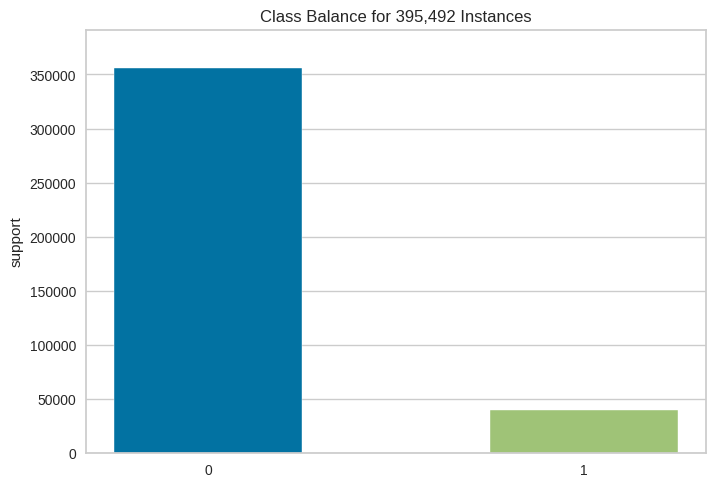

<Axes: title={'center': 'Class Balance for 395,492 Instances'}, ylabel='support'>

In [ ]:
#check if class labels are balanced
from yellowbrick.target import ClassBalance
X= new_df.drop(columns='target', axis=1)
y = new_df['target']
visualizer = ClassBalance()
visualizer.fit(y)
visualizer.show()

From the chart above, we see the individuals classified as bad borrowers have very few observations. This class imbalance can affect our model while training. To solve this problem, we will oversample the minority class.

# Splitting into Train and Test

In [ ]:
#spliting data into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
#checking  imbalance for training dataset
y_train.value_counts()

,count
target,
0,249010
1,27834


# Oversampling Minority Class to Resolve Class Imbalance


In [ ]:
#import libraries for model training
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from imblearn.under_sampling import RandomUnderSampler
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, roc_auc_score, precision_recall_curve
from imblearn.over_sampling import RandomOverSampler
from imblearn.combine import SMOTETomek

In [ ]:
#dealing with imbalanced data
os = RandomOverSampler()
X_train_o, y_train_o = os.fit_resample(X_train, y_train)
y_train_series = pd.Series(y_train_o)
#check value counts after oversampling
y_train_series.value_counts()

,count
target,
1,249010
0,249010


# Building PD Model (White-Box)

In [ ]:
#building logistic regression model
model = LogisticRegression()
model.fit(X_train_o, y_train_o)

LogisticRegression()

In [ ]:
#predicting
y_preds = model.predict(X_test)
#classification report
print(classification_report(y_test, y_preds))

              precision    recall  f1-score   support

           0       0.97      0.78      0.87    106725
           1       0.29      0.80      0.42     11923

    accuracy                           0.78    118648
   macro avg       0.63      0.79      0.65    118648
weighted avg       0.90      0.78      0.82    118648



In [ ]:
y_hat_test_proba = model.predict_proba(X_test)
y_hat_test_proba = y_hat_test_proba[:][: , 1]
y_test_temp = y_test.copy()
y_test_temp.reset_index(drop = True, inplace = True)
y_test_proba = pd.concat([y_test_temp, pd.DataFrame(y_hat_test_proba), pd.DataFrame(y_preds)], axis = 1)
y_test_proba.columns = ['y_test_class_actual', 'y_hat_test_proba', 'y_hat_test']
y_test_proba.index = X_test.index
y_test_proba.head()

,y_test_class_actual,y_hat_test_proba,y_hat_test
138256,0,0.413901,0
366092,0,0.070589,0
186604,0,0.207826,0
332507,0,0.364108,0
116459,0,0.636560,1


# Assessing Discriminatory Power of the PD Model

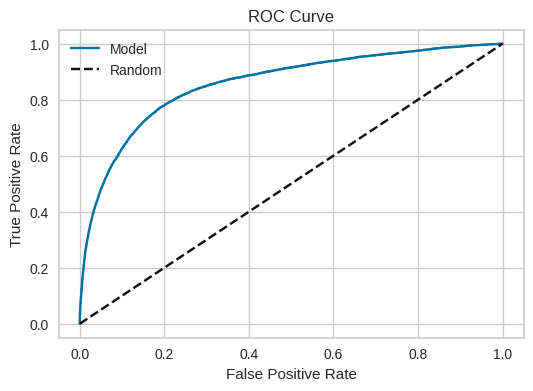

AUROC: 0.8571
Gini: 0.7142


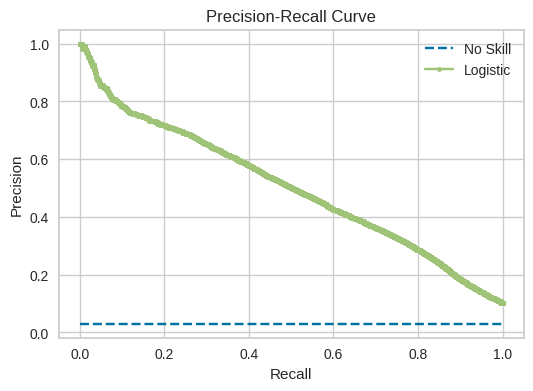

AUC PR: 0.5035
KS Statistic: 0.5821


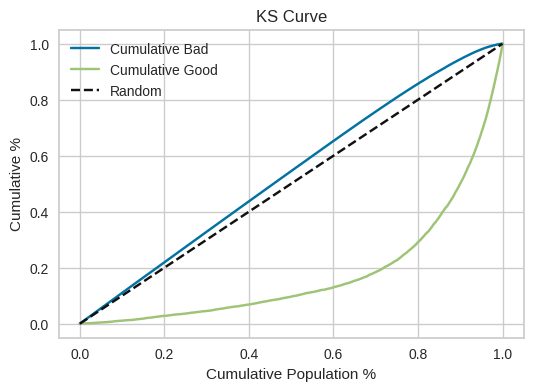


Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.78      0.87    106725
           1       0.29      0.80      0.42     11923

    accuracy                           0.78    118648
   macro avg       0.63      0.79      0.65    118648
weighted avg       0.90      0.78      0.82    118648



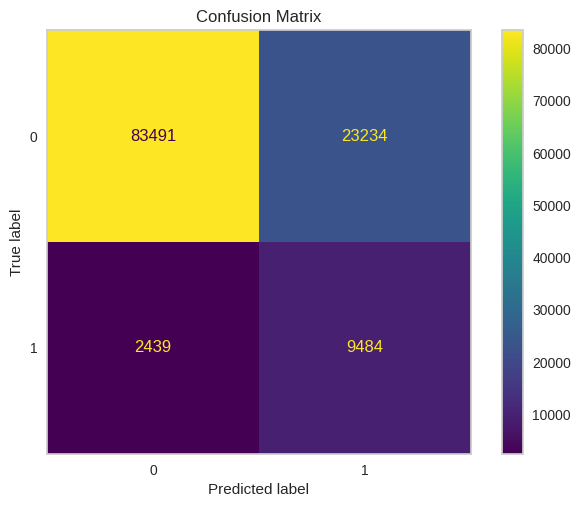

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score, precision_recall_curve, auc, classification_report, confusion_matrix, ConfusionMatrixDisplay

# Compute ROC
fpr, tpr, thresholds = roc_curve(y_test_proba['y_test_class_actual'], y_test_proba['y_hat_test_proba'])
plt.figure(figsize=(6,4))
plt.plot(fpr, tpr, label='Model')
plt.plot(fpr, fpr, linestyle='--', color='k', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.grid(True)
plt.show()

AUROC = roc_auc_score(y_test_proba['y_test_class_actual'], y_test_proba['y_hat_test_proba'])
Gini = AUROC * 2 - 1
print(f"AUROC: {AUROC:.4f}\nGini: {Gini:.4f}")

# Compute Precision-Recall
no_skill = len(y_test[y_test == 1]) / len(y)
precision, recall, thresholds = precision_recall_curve(y_test_proba['y_test_class_actual'], y_test_proba['y_hat_test_proba'])
auc_pr = auc(recall, precision)

plt.figure(figsize=(6,4))
plt.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')
plt.plot(recall, precision, marker='.', label='Logistic')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid(True)
plt.show()

print(f"AUC PR: {auc_pr:.4f}")

# Compute KS
actual_predicted_probs_df = y_test_proba.sort_values('y_hat_test_proba').reset_index(drop=True)
actual_predicted_probs_df['cum_n_pop'] = actual_predicted_probs_df.index + 1
actual_predicted_probs_df['cum_good'] = actual_predicted_probs_df['y_test_class_actual'].cumsum()
actual_predicted_probs_df['cum_bad'] = actual_predicted_probs_df['cum_n_pop'] - actual_predicted_probs_df['cum_good']
actual_predicted_probs_df['cum_n_%'] = actual_predicted_probs_df['cum_n_pop'] / actual_predicted_probs_df.shape[0]
actual_predicted_probs_df['cum_good_%'] = actual_predicted_probs_df['cum_good'] / actual_predicted_probs_df['y_test_class_actual'].sum()
actual_predicted_probs_df['cum_bad_%'] = actual_predicted_probs_df['cum_bad'] / (actual_predicted_probs_df.shape[0] - actual_predicted_probs_df['y_test_class_actual'].sum())

ks_statistic = max(abs(actual_predicted_probs_df['cum_good_%'] - actual_predicted_probs_df['cum_bad_%']))
print(f"KS Statistic: {ks_statistic:.4f}")

plt.figure(figsize=(6,4))
plt.plot(actual_predicted_probs_df['cum_n_%'], actual_predicted_probs_df['cum_bad_%'], label='Cumulative Bad')
plt.plot(actual_predicted_probs_df['cum_n_%'], actual_predicted_probs_df['cum_good_%'], label='Cumulative Good')
plt.plot(actual_predicted_probs_df['cum_n_%'], actual_predicted_probs_df['cum_n_%'], linestyle='--', color='k', label='Random')
plt.xlabel('Cumulative Population %')
plt.ylabel('Cumulative %')
plt.title('KS Curve')
plt.legend()
plt.grid(True)
plt.show()

# Confusion Matrix and Classification Report
y_true = y_test_proba['y_test_class_actual']
y_pred = y_test_proba['y_hat_test']
print("\nClassification Report:")
print(classification_report(y_true, y_pred))

cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()



=== Naive Bayes ===
              precision    recall  f1-score   support

           0       0.98      0.56      0.72    106663
           1       0.19      0.90      0.31     11985

    accuracy                           0.60    118648
   macro avg       0.58      0.73      0.51    118648
weighted avg       0.90      0.60      0.67    118648



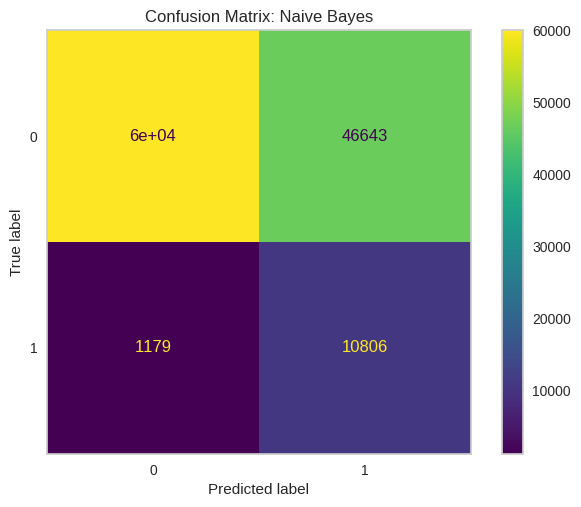

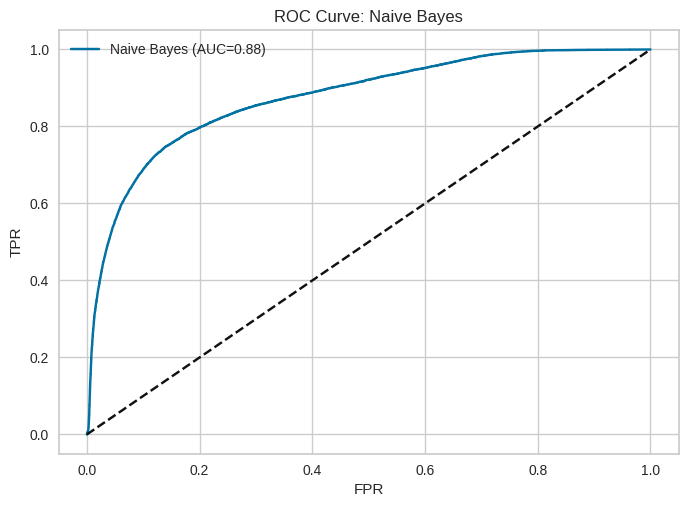

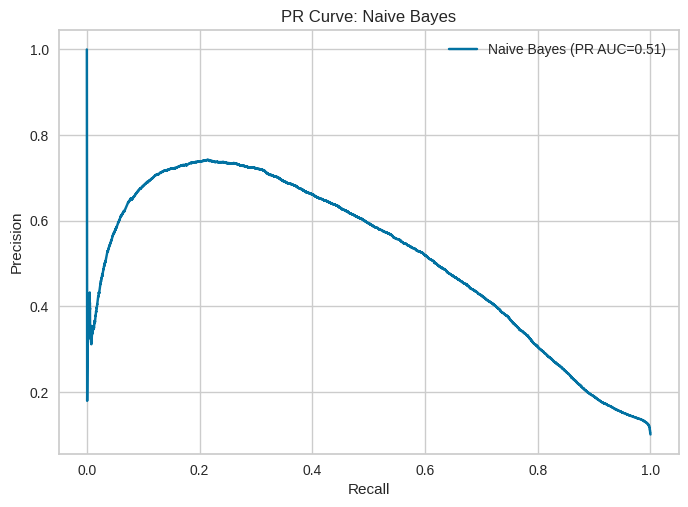


=== Logistic RegressionCV ===
              precision    recall  f1-score   support

           0       0.97      0.99      0.98    106663
           1       0.88      0.69      0.77     11985

    accuracy                           0.96    118648
   macro avg       0.93      0.84      0.88    118648
weighted avg       0.96      0.96      0.96    118648



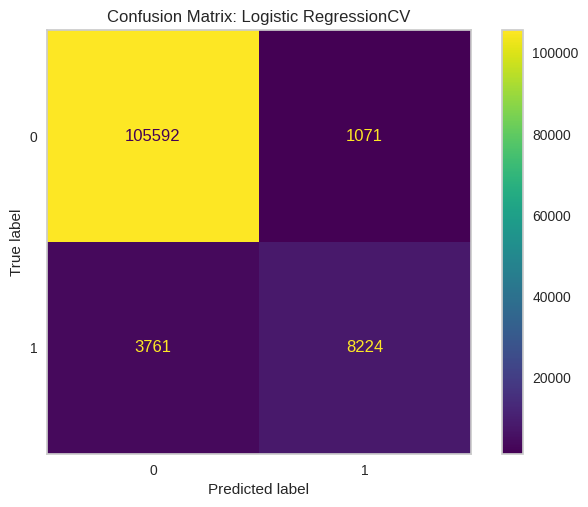

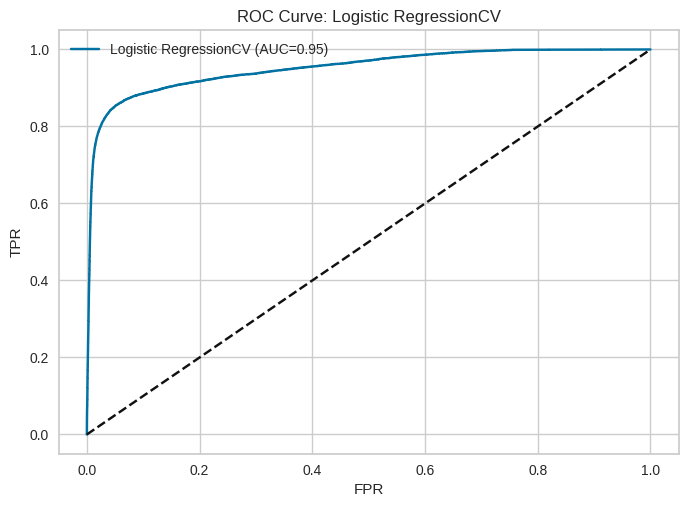

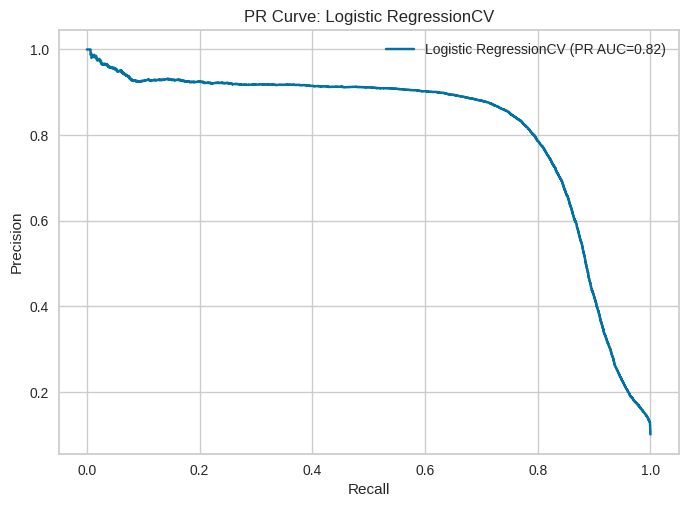


=== Decision Tree ===
              precision    recall  f1-score   support

           0       0.99      0.99      0.99    106663
           1       0.92      0.93      0.92     11985

    accuracy                           0.98    118648
   macro avg       0.95      0.96      0.96    118648
weighted avg       0.98      0.98      0.98    118648



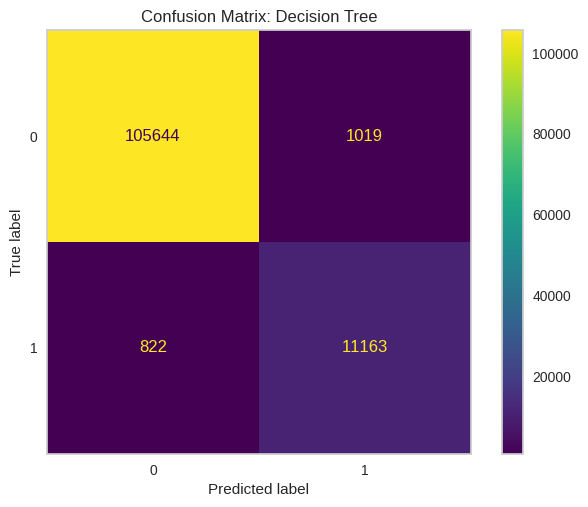

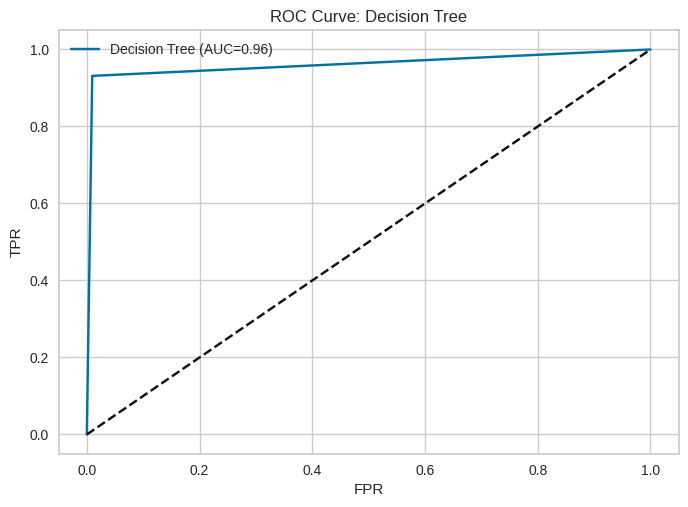

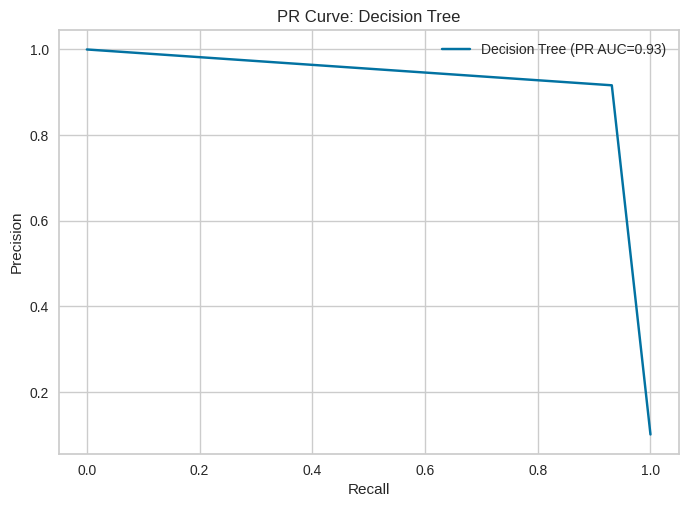


=== Random Forest ===
              precision    recall  f1-score   support

           0       0.99      1.00      1.00    106663
           1       0.98      0.94      0.96     11985

    accuracy                           0.99    118648
   macro avg       0.98      0.97      0.98    118648
weighted avg       0.99      0.99      0.99    118648



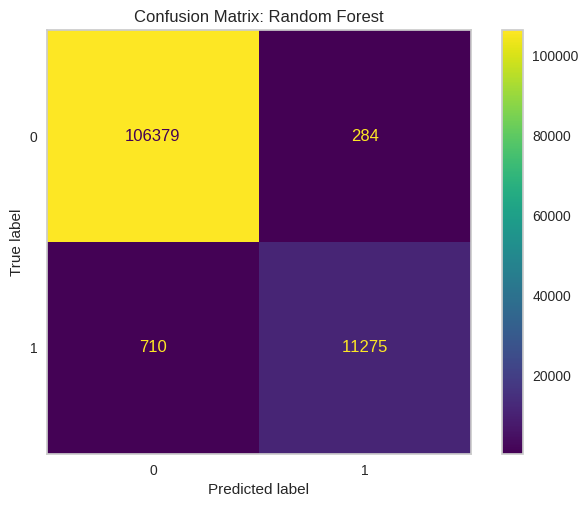

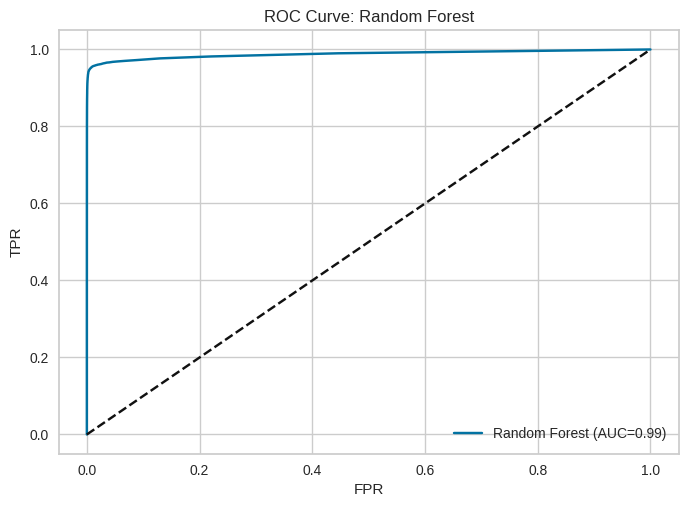

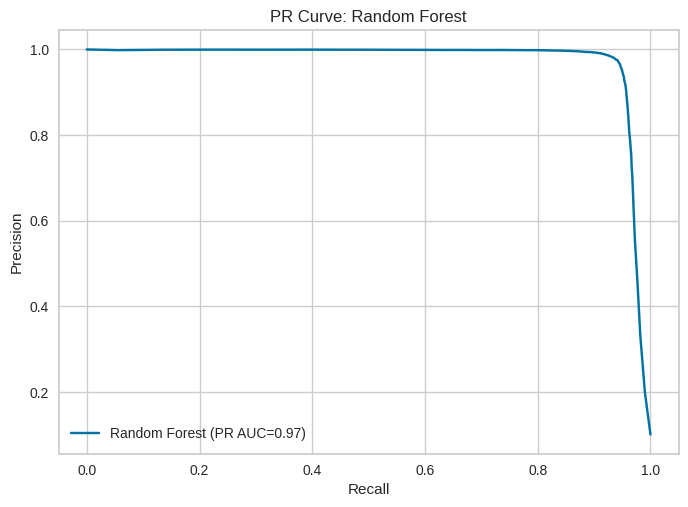


=== Gradient Boosting ===
              precision    recall  f1-score   support

           0       0.99      1.00      0.99    106663
           1       0.96      0.94      0.95     11985

    accuracy                           0.99    118648
   macro avg       0.97      0.97      0.97    118648
weighted avg       0.99      0.99      0.99    118648



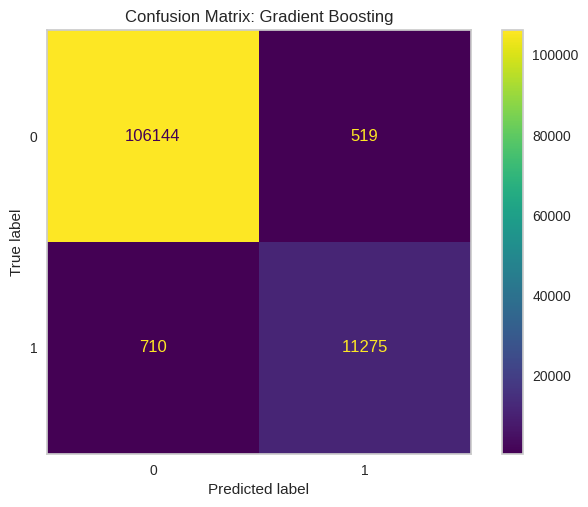

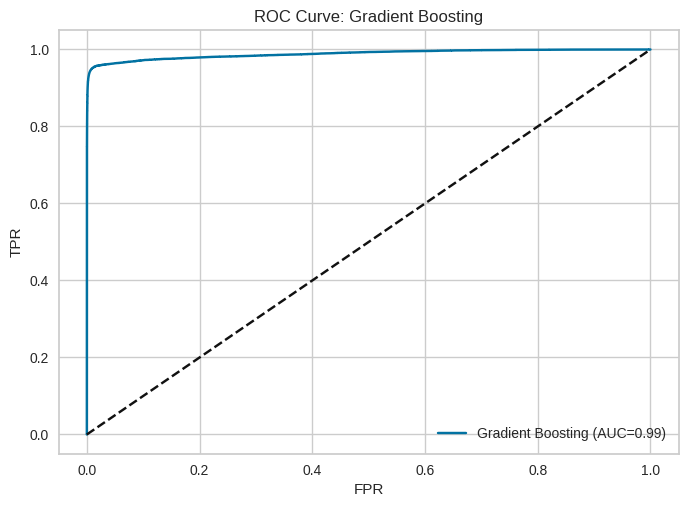

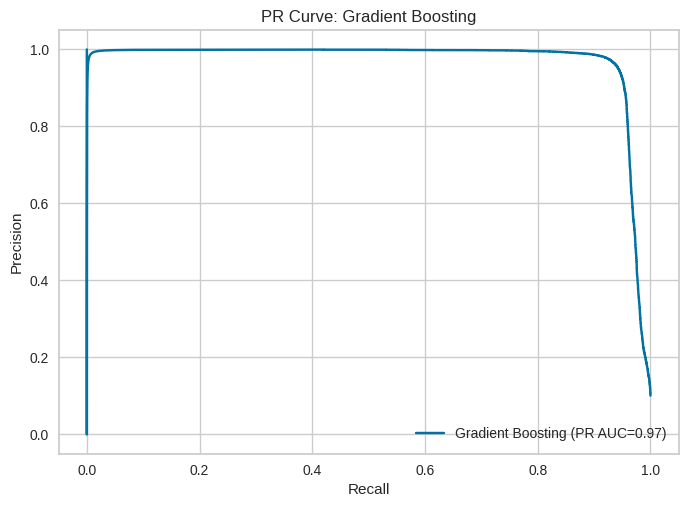


=== MLP Classifier ===
              precision    recall  f1-score   support

           0       0.99      1.00      1.00    106663
           1       0.98      0.94      0.96     11985

    accuracy                           0.99    118648
   macro avg       0.99      0.97      0.98    118648
weighted avg       0.99      0.99      0.99    118648



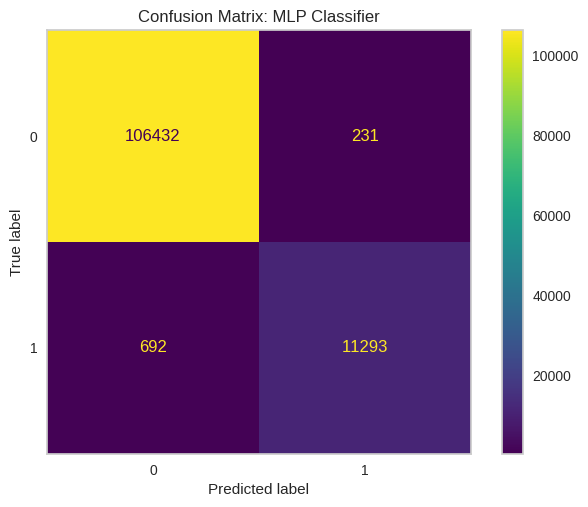

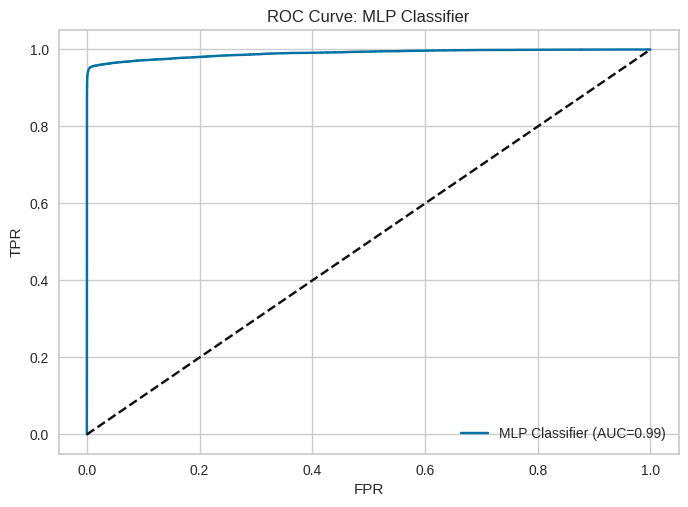

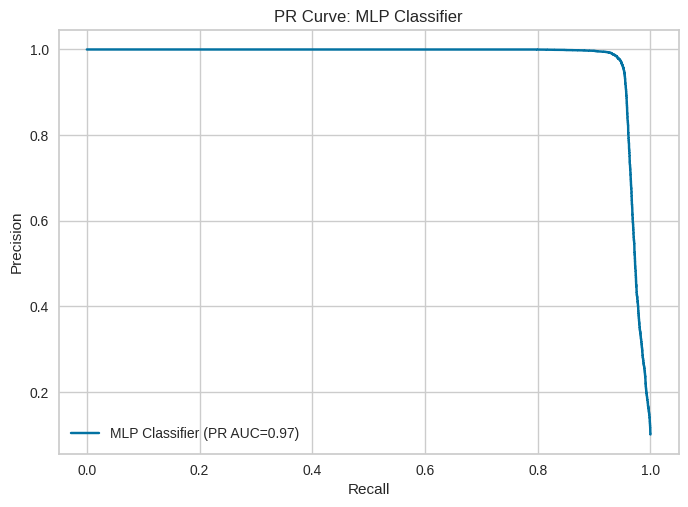

In [ ]:
# -------------------- ADVANCED MODELS TRAINING & METRICS --------------------
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegressionCV
from sklearn.metrics import (
    classification_report, confusion_matrix, ConfusionMatrixDisplay,
    roc_auc_score, roc_curve, precision_recall_curve, auc
)

# Label encode categorical columns
preprocess_data_advanced = data.copy()
lencoders = {}
for col in preprocess_data_advanced.select_dtypes(include=['object']).columns:
    lencoders[col] = LabelEncoder()
    preprocess_data_advanced[col] = lencoders[col].fit_transform(preprocess_data_advanced[col])

X = preprocess_data_advanced.drop(columns='loan_target', axis=1)
y = preprocess_data_advanced['loan_target']
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.3, random_state=12345)

models = [
    {"name": "Naive Bayes", "clf": GaussianNB()},
    {"name": "Logistic RegressionCV", "clf": LogisticRegressionCV()},
    {"name": "Decision Tree", "clf": DecisionTreeClassifier()},
    {"name": "Random Forest", "clf": RandomForestClassifier(n_estimators=100)},
    {"name": "Gradient Boosting", "clf": GradientBoostingClassifier(n_estimators=100)},
    {"name": "MLP Classifier", "clf": MLPClassifier(solver='adam', alpha=1e-1, hidden_layer_sizes=(10,10,5,2), max_iter=500, random_state=42)}
]

advanced_model_metrics = []

for model in models:
    print(f"\n=== {model['name']} ===")
    pipe = Pipeline([('scaler', StandardScaler()), ('clf', model['clf'])])
    pipe.fit(X_train, y_train)
    y_pred = pipe.predict(X_test)
    y_proba = pipe.predict_proba(X_test)[:, 1] if hasattr(pipe, 'predict_proba') else y_pred

    # Metrics
    roc_auc = roc_auc_score(y_test, y_proba)
    gini = roc_auc * 2 - 1
    precision, recall, _ = precision_recall_curve(y_test, y_proba)
    auc_pr = auc(recall, precision)
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    ks = max(abs(pd.Series(tpr) - pd.Series(fpr)))

    # Store metrics
    advanced_model_metrics.append({
        "Model": model['name'],
        "AUC": roc_auc,
        "Gini": gini,
        "AUC PR": auc_pr,
        "KS": ks
    })

    # Print & Plot
    print(classification_report(y_test, y_pred))
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred)
    plt.title(f"Confusion Matrix: {model['name']}")
    plt.grid(False)
    plt.show()

    plt.plot(fpr, tpr, label=f"{model['name']} (AUC={roc_auc:.2f})")
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f"ROC Curve: {model['name']}")
    plt.xlabel("FPR")
    plt.ylabel("TPR")
    plt.legend()
    plt.grid(True)
    plt.show()

    plt.plot(recall, precision, label=f"{model['name']} (PR AUC={auc_pr:.2f})")
    plt.title(f"PR Curve: {model['name']}")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.legend()
    plt.grid(True)
    plt.show()


In [ ]:
# Append PD model metrics from earlier block (manual values)
# Replace below with actual saved AUROC, Gini, AUC PR, KS from your PD block:
advanced_model_metrics.append({
    "Model": "PD Logistic Regression",
    "AUC": AUROC,
    "Gini": Gini,
    "AUC PR": auc_pr,
    "KS": ks_statistic
})

# Compare All Models
comparison_df = pd.DataFrame(advanced_model_metrics)
print("\nModel Comparison Summary (PD + Advanced):")
print(comparison_df.sort_values(by='AUC', ascending=False))


Model Comparison Summary (PD + Advanced):
                    Model       AUC      Gini    AUC PR        KS
5          MLP Classifier  0.989906  0.979812  0.974832  0.947633
4       Gradient Boosting  0.988528  0.977055  0.970630  0.942043
3           Random Forest  0.987928  0.975856  0.974183  0.945906
2           Decision Tree  0.960930  0.921861  0.927347  0.921861
1   Logistic RegressionCV  0.951205  0.902410  0.816808  0.803215
0             Naive Bayes  0.875141  0.750282  0.511984  0.608065
6  PD Logistic Regression  0.857083  0.714167  0.974832  0.582112
